# Imports and functions

In [1]:
import os
import pickle

# Numerical and Data Processing
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.lines as mlines
from matplotlib.patches import Patch
from matplotlib.ticker import ScalarFormatter, MultipleLocator, FormatStrFormatter
from matplotlib.colors import LinearSegmentedColormap
# Statistical and Mathematical Analysis
from scipy.stats import (
    gaussian_kde,
    ks_2samp,
    linregress,
)
from scipy import interpolate
from itertools import cycle

In [2]:
def load_and_filter_data_with_events(sim_dir, scenarios, rain_filter_threshold, shift_threshold, historical_column, future_column ):
    """
    Load and filter data for selected urbanization scenarios, including event numbers.

    Parameters:
    sim_dir (str): Directory containing pickle files.
    scenarios (list): List of scenario labels to analyze.
    rain_filter_threshold (float): Threshold for filtering rain events.
    shift_threshold (int): Threshold for shift range calculation.

    Returns:
    dict: Dictionary containing historical, future data, and event numbers for each scenario.
    """
    data_dict = {}
    
    # Define all available scenarios
    all_scenarios = [
        ('urbanization_1_0.pkl', '38% urbanization'),
        ('urbanization_1_1.pkl', '42% urbanization'),
        ('urbanization_1_2.pkl', '46% urbanization'),
        ('urbanization_1_3.pkl', '49% urbanization'),
        ('urbanization_1_4.pkl', '53% urbanization'),
        ('urbanization_1_5.pkl', '57% urbanization'),
        ('urbanization_2_0.pkl', '73% urbanization'),
        ('urbanization_3_0.pkl', '81% urbanization'),
        ('urbanization_4_0.pkl', '83% urbanization'),
        ('urbanization_5_0.pkl', '87% urbanization')
    ]
    
    # Filter scenarios based on user selection
    selected_scenarios = [(pkl, label) for pkl, label in all_scenarios if label in scenarios]
    
    for pickle_file, label_name in selected_scenarios:
        pickle_file_path = os.path.join(sim_dir, pickle_file)
        
        # Load the data from pickle file
        final_results_df = pd.read_pickle(pickle_file_path)
        
        # Filter events based on thresholds
        filtered_df, _, _ = filter_events_by_rainfall(
            final_results_df, 
            rain_filter_threshold, 
            shift_threshold
        )
        
        # Extract historical and future values along with event numbers
        data_dict[label_name] = {
            'historical': filtered_df[historical_column].values,
            'future': filtered_df[future_column].values,
            'event_num': filtered_df[('event_num', '', '')].values
        }
    
    return data_dict


In [3]:
def filter_events_by_rainfall(final_results_df, rain_filter_threshold, shift_threshold):
    """
    Filter out events with total rainfall below threshold and shifts beyond threshold.
    """
    event_nums_to_filter_out = []
    
    for event in final_results_df['event_num'].unique():
        event_df = final_results_df[final_results_df['event_num'] == event]
        
        # Check rain threshold
        rain_condition = (
            (event_df[('historical', 'full_basin', 'total_rain')] < rain_filter_threshold).all() and 
            (event_df[('future', 'full_basin', 'total_rain')] < rain_filter_threshold).all()
        )
        
        # Check shift threshold
        historical_discharge = event_df[('historical', 'basin discharge', 'max_discharge')].values
        future_discharge = event_df[('future', 'basin discharge', 'max_discharge')].values
        shift_condition = abs(future_discharge - historical_discharge) > shift_threshold
        
        if rain_condition or shift_condition.any():
            event_nums_to_filter_out.append(event)
    
    filtered_df = final_results_df[~final_results_df['event_num'].isin(event_nums_to_filter_out)]
    y_shift_range = np.arange(-shift_threshold, shift_threshold + 1, 500)
    filtered_df = filtered_df[filtered_df[('y', '', '')].isin(y_shift_range)]
    num_classes = 2
    print(f'number of events that filtered out: {len(event_nums_to_filter_out)}')
    
    return filtered_df, y_shift_range, num_classes

In [4]:
def ks_test_for_scenario(data_dict, scenario):
    """
    Perform the Two-sample Kolmogorov-Smirnov test between future and historical data for a given scenario.
    
    Parameters:
    - data_dict (dict): Dictionary containing 'historical' and 'future' data for each scenario.
    - scenario (str): The label of the scenario to analyze (e.g., '39% urbanization').
    
    Returns:
    None: Prints the KS statistic and p-value along with an interpretation.
    """
    if scenario not in data_dict:
        print(f"Error: Scenario '{scenario}' not found in data_dict.")
        return
    
    # Extract future and historical data
    future_data = data_dict[scenario]['future']
    historical_data = data_dict[scenario]['historical']
    
    # Perform KS test
    ks_stat, p_value = ks_2samp(future_data, historical_data)
    
    # Print results
    print(f"KS Test Between Future and Historical Data ({scenario}):")
    print(f"KS Statistic: {ks_stat:.4f}")
    print(f"P-value: {p_value:.4f}")
    
    # Interpretation
    if p_value < 0.05:
        print("The distributions are significantly different.")
    else:
        print("No significant difference between the distributions.")


### Plot functions

In [5]:
def create_scatter_plot(data_dict, title, x_label):
    """
    Create scatter plot comparing historical vs future values for multiple scenarios.
    """
    plt.figure(figsize=(12, 8))
    colors = plt.cm.tab10(np.linspace(0, 1, len(data_dict)))
    
    # Find global min and max for 1:1 line
    all_values = []
    for scenario_data in data_dict.values():
        all_values.extend(scenario_data['historical'])
        all_values.extend(scenario_data['future'])
    min_value, max_value = min(all_values), max(all_values)
    
    # Plot 1:1 line
    plt.plot([min_value, max_value], [min_value, max_value], 
             color='black', linestyle='-', label='1:1 Line')
    
    # Plot data for each scenario
    medians = []  # Store medians to plot later
    for (label, scenario_data), color in zip(data_dict.items(), colors):
        plt.scatter(scenario_data['historical'], scenario_data['future'],
                   alpha=0.6, label=label, color=color)
        
        # Calculate median points
        median_hist = np.median(scenario_data['historical'])
        median_fut = np.median(scenario_data['future'])
        medians.append((label, median_hist, median_fut, color))  # Store for later plotting
        
        # Print median values
        print(f"Medians for {label}:")
        print(f"Historical: {median_hist:.2f}")
        print(f"Future: {median_fut:.2f}\n")
    
    # Plot medians after all points
    for label, median_hist, median_fut, color in medians:
        plt.scatter([median_hist], [median_fut], marker='*', s=300,
                    color=color, edgecolor='black', label=f'{label} Median')
    
    plt.title(title)
    plt.xlabel(f'{x_label} (Historical)')
    plt.ylabel(f'{x_label} (Future)')
    plt.legend()
    plt.xlim(0)
    plt.ylim(0)
    plt.grid(True)
    plt.show()


def create_sorted_scatter_plot(data_dict, title, x_label):
    """
    Create scatter plot with sorted values.
    """
    plt.figure(figsize=(12, 8))
    colors = plt.cm.tab10(np.linspace(0, 1, len(data_dict)))
    
    # Find global min and max for 1:1 line
    all_values = []
    for scenario_data in data_dict.values():
        all_values.extend(scenario_data['historical'])
        all_values.extend(scenario_data['future'])
    min_value, max_value = min(all_values), max(all_values)
    
    # Plot 1:1 line
    plt.plot([min_value, max_value], [min_value, max_value], 
             color='black', linestyle='-', label='1:1 Line')
    
    # Plot sorted data for each scenario
    for (label, scenario_data), color in zip(data_dict.items(), colors):
        sorted_hist = np.sort(scenario_data['historical'])
        sorted_fut = np.sort(scenario_data['future'])
        
        plt.scatter(sorted_hist, sorted_fut, alpha=0.6, label=label, color=color)
        
        # Add median points
        median_hist = np.median(sorted_hist)
        median_fut = np.median(sorted_fut)
        plt.scatter([median_hist], [median_fut], marker='*', s=300,
                   color=color, edgecolor='black', label=f'{label} Median')
    
    plt.title(f"Sorted {title}")
    plt.xlabel(f'{x_label} (Historical)')
    plt.ylabel(f'{x_label} (Future)')
    plt.legend()
    plt.grid(True)
    plt.xlim(0)
    plt.ylim(0)
    plt.show()

def create_cdf_plot(data_dict, title, x_label):
    """
    Create CDF plot for multiple scenarios.
    """
    plt.figure(figsize=(12, 8))
    colors = plt.cm.tab10(np.linspace(0, 1, len(data_dict)))
    
    for (label, scenario_data), color in zip(data_dict.items(), colors):
        # Plot historical
        plt.plot(np.sort(scenario_data['historical']),
                np.linspace(0, 1, len(scenario_data['historical']), endpoint=True),
                label=f'{label} (Historical)', color=color, linestyle='-')
        
        # Plot future
        plt.plot(np.sort(scenario_data['future']),
                np.linspace(0, 1, len(scenario_data['future']), endpoint=True),
                label=f'{label} (Future)', color=color, linestyle='--')
    
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel('Cumulative Probability')
    plt.legend()
    plt.grid(True)
    plt.xlim(0)
    plt.ylim(0)
    plt.show()


    
def create_histogram(data_dict, title, x_label):
    """
    Create histogram for all scenarios.
    """
    plt.figure(figsize=(12, 8))
    colors = plt.cm.tab10(np.linspace(0, 1, len(data_dict)))
    
    for (label, scenario_data), color in zip(data_dict.items(), colors):
        plt.hist(scenario_data['historical'], bins=30, alpha=0.3,
                label=f'{label} (Historical)', color=color, density=True)
        plt.hist(scenario_data['future'], bins=30, alpha=0.3,
                label=f'{label} (Future)', color=color, linestyle='--', density=True)
    
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel('Density')
    plt.legend()
    plt.grid(True)
    plt.xlim(0)
    plt.ylim(0)
    plt.show()

def create_difference_histogram(data_dict, title, x_label):
    """
    Create histogram of differences between historical and future values.
    """
    plt.figure(figsize=(12, 8))
    colors = plt.cm.tab10(np.linspace(0, 1, len(data_dict)))
    
    for (label, scenario_data), color in zip(data_dict.items(), colors):
        differences = scenario_data['historical'] - scenario_data['future']
        plt.hist(differences, bins=30, alpha=0.6,
                label=f'{label} (Historical - Future)', color=color)
    
    plt.title(f'Histogram of Differences in {title}')
    plt.xlabel(f'Difference in {x_label} (Historical - Future)')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True)
    plt.show()

def create_kde_plot(data_dict, title, x_label):
    """
    Create KDE (Probability Density) plot with early stopping for density close to 0.
    """
    plt.figure(figsize=(12, 8))
    colors = plt.cm.tab10(np.linspace(0, 1, len(data_dict)))
    
    # Find global min and max for x_range
    all_values = []
    for scenario_data in data_dict.values():
        all_values.extend(scenario_data['historical'])
        all_values.extend(scenario_data['future'])
    x_range = np.linspace(min(all_values), max(all_values), 500)
    
    threshold = 1e-12  # Define a density threshold to stop plotting
    
    for (label, scenario_data), color in zip(data_dict.items(), colors):
        kde_hist = gaussian_kde(scenario_data['historical'])
        kde_fut = gaussian_kde(scenario_data['future'])
        
        # Calculate KDE values
        density_hist = kde_hist(x_range)
        density_fut = kde_fut(x_range)
        
        # Filter x_range where density is above threshold
        valid_hist = density_hist > threshold
        valid_fut = density_fut > threshold
        
        # Plot the filtered KDEs
        plt.plot(x_range[valid_hist], density_hist[valid_hist], label=f'{label} (Historical)',
                 color=color, linestyle='-')
        plt.plot(x_range[valid_fut], density_fut[valid_fut], label=f'{label} (Future)',
                 color=color, linestyle='--')
    
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel('Probability Density')
    plt.legend()
    plt.grid(True)
    plt.xlim(0)
    plt.ylim(0)
    plt.show()

def create_box_plot(data_dict, title, y_label):
    """
    Create box plot for all scenarios.
    """
    plt.figure(figsize=(12, 8))
    
    # Prepare data for box plot
    data = []
    labels = []
    
    for label, scenario_data in data_dict.items():
        data.extend([scenario_data['historical'], scenario_data['future']])
        labels.extend([f'{label}\nHistorical', f'{label}\nFuture'])
    
    plt.boxplot(data, labels=labels, patch_artist=True, showmeans=True)
    
    plt.title(title)
    plt.ylabel(y_label)
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def create_violin_plot(data_dict, title, y_label):
    """
    Create violin plot for multiple scenarios.
    """
    # Prepare data for violin plot
    data = {
        y_label: [],
        'Scenario': [],
        'Type': []
    }
    
    for label, scenario_data in data_dict.items():
        data[y_label].extend(scenario_data['historical'])
        data[y_label].extend(scenario_data['future'])
        data['Scenario'].extend([label] * len(scenario_data['historical']))
        data['Scenario'].extend([label] * len(scenario_data['future']))
        data['Type'].extend(['Historical'] * len(scenario_data['historical']))
        data['Type'].extend(['Future'] * len(scenario_data['future']))
    
    df = pd.DataFrame(data)
    
    plt.figure(figsize=(12, 8))
    sns.violinplot(x='Scenario', y=y_label, hue='Type', data=df, split=True,
                  palette={'Historical': 'blue', 'Future': 'orange'})
    
    plt.title(title)
    plt.xticks(rotation=45)
    plt.legend(title='Type')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


def create_event_colored_cdf_scatter_with_33_distinct_colors(data_dict, title, x_label):
    """
    Create a scatter plot CDF with both historical and future data, using 33 distinct colors for event numbers.

    Parameters:
    data_dict (dict): Dictionary containing historical, future, and event data for each scenario.
    title (str): Title of the plot.
    x_label (str): Label for the x-axis.

    Returns:
    None: Displays the plot.
    """
    from itertools import cycle

    plt.figure(figsize=(12, 8))

    # Combine all historical, future data, and event numbers
    all_historical_data = []
    all_future_data = []
    all_event_nums = []

    for scenario, scenario_data in data_dict.items():
        all_historical_data.extend(scenario_data['historical'])
        all_future_data.extend(scenario_data['future'])
        all_event_nums.extend(scenario_data['event_num'])

    # Convert to numpy arrays
    all_historical_data = np.array(all_historical_data)
    all_future_data = np.array(all_future_data)
    all_event_nums = np.array(all_event_nums)

    # Calculate the overall CDF for historical and future data
    sorted_historical_data = np.sort(all_historical_data)
    cumulative_prob_historical = np.linspace(0, 1, len(sorted_historical_data), endpoint=True)

    sorted_future_data = np.sort(all_future_data)
    cumulative_prob_future = np.linspace(0, 1, len(sorted_future_data), endpoint=True)

    # Generate 33 distinct colors
    cmap = plt.cm.get_cmap('tab20b', 33)  # Use tab20b colormap with 33 colors
    colors = [cmap(i) for i in range(33)]
    color_cycle = cycle(colors)  # Create a cycle to reuse colors if needed

    # Ensure enough colors for all unique events
    unique_events = np.unique(all_event_nums)
    event_colors = {event: next(color_cycle) for event in unique_events}

    # Plot historical and future CDF with event-colored points
    for event_num in unique_events:
        color = event_colors[event_num]

        # Mask for the current event
        event_mask = (all_event_nums == event_num)
        
        # Get the CDF points for the current event (historical)
        x_hist_event = sorted_historical_data[event_mask]
        y_hist_event = cumulative_prob_historical[event_mask]
        plt.scatter(x_hist_event, y_hist_event, color=color, alpha=0.8, marker='o', label=f'Event {event_num} (Historical)')
        
        # Get the CDF points for the current event (future)
        x_fut_event = sorted_future_data[event_mask]
        y_fut_event = cumulative_prob_future[event_mask]
        plt.scatter(x_fut_event, y_fut_event, color=color, alpha=0.8, marker='x', label=f'Event {event_num} (Future)')

    # Add plot details
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel('Cumulative Probability')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [6]:
def convert_to_specific_discharge(data_dict, basin_area):
    """
    Converts discharge data to specific discharge by dividing each value by the basin area.
    
    Parameters:
        data_dict (dict): Dictionary containing discharge data.
        basin_area (float): Area of the basin in square meters.
        
    Returns:
        dict: Updated dictionary with specific discharge values.
    """
    for key in data_dict:
        for period in data_dict[key]:
            data_dict[key][period] = [value / basin_area for value in data_dict[key][period]]
    return data_dict

In [7]:
def plot_iqr_bar_chart(data_dict, title, y_label):
    """
    Create a bar chart to represent the interquartile range (IQR) for each scenario with warm and cool color schemes.

    Parameters:
    - data_dict (dict): Dictionary containing historical and future data for each scenario.
    - title (str): Title of the bar chart.
    - y_label (str): Label for the y-axis.
    """
    scenarios = []
    iqrs = []
    colors = []

    # Define warm and cool colormaps
    warm_colors = plt.cm.Reds(np.linspace(0.4, 0.9, len(data_dict)))
    cool_colors = plt.cm.Blues(np.linspace(0.4, 0.9, len(data_dict)))
    warm_index, cool_index = 0, 0

    # Calculate IQR and assign colors
    for label, scenario_data in data_dict.items():
        for period, values in scenario_data.items():
            if period in ['historical', 'future']:
                scenarios.append(f"{label} ({period.capitalize()})")
                q1 = np.percentile(values, 25)
                q3 = np.percentile(values, 75)
                iqrs.append(q3 - q1)

                # Assign colors: cool for historical, warm for future
                if period == 'historical':
                    colors.append(cool_colors[cool_index])
                    cool_index += 1
                elif period == 'future':
                    colors.append(warm_colors[warm_index])
                    warm_index += 1

    # Plot the bar chart
    plt.figure(figsize=(12, 8))
    plt.bar(scenarios, iqrs, color=colors, alpha=0.8, edgecolor='black')
    plt.title(title, fontsize=16)
    plt.ylabel(y_label, fontsize=12)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Add legend
    legend_elements = [
        Patch(facecolor=warm_colors[0], edgecolor='black', label='Future (Warm Colors)'),
        Patch(facecolor=cool_colors[0], edgecolor='black', label='Historical (Cool Colors)')
    ]
    plt.legend(handles=legend_elements, loc='upper left', fontsize=10, title='Periods')

    # Show the plot
    plt.tight_layout()
    plt.show()


In [8]:
def plot_percentile_differences(data_dict, lower_percentile, upper_percentile, title, y_label):
    """
    Create a bar chart to represent the differences in percentile ranges between future and historical data for each scenario.

    Parameters:
    - data_dict (dict): Dictionary containing historical and future data for each scenario.
    - lower_percentile (float): Lower percentile for calculation (e.g., 10 for 10th percentile).
    - upper_percentile (float): Upper percentile for calculation (e.g., 90 for 90th percentile).
    - title (str): Title of the bar chart.
    - y_label (str): Label for the y-axis.
    """
    scenarios = []
    percentile_differences = []

    # Calculate percentile differences for each scenario
    for label, scenario_data in data_dict.items():
        # Historical percentiles
        lower_hist = np.percentile(scenario_data['historical'], lower_percentile)
        upper_hist = np.percentile(scenario_data['historical'], upper_percentile)
        range_hist = upper_hist - lower_hist
    
        # Future percentiles
        lower_fut = np.percentile(scenario_data['future'], lower_percentile)
        upper_fut = np.percentile(scenario_data['future'], upper_percentile)
        range_fut = upper_fut - lower_fut

        # Append the differences and scenario label
        scenarios.append(label)
        percentile_differences.append(range_fut - range_hist)
    # Define color map
    colors = plt.cm.PuOr(np.linspace(0.2, 0.8, len(scenarios)))

    # Create the bar chart
    plt.figure(figsize=(12, 8))
    plt.bar(scenarios, percentile_differences, color=colors, alpha=0.8, edgecolor='black')
    plt.axhline(0, color='black', linewidth=1, linestyle='--')  # Add horizontal line at y=0
    plt.title(title, fontsize=16)
    plt.ylabel(y_label, fontsize=12)
    plt.xlabel("Urbanization Percentage", fontsize=12)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    print(percentile_differences)
    # Show the plot
    plt.tight_layout()
    plt.show()


In [9]:

def find_cdf_intersection(data1, data2):
    """Helper function to find intersection point between two CDFs"""
    # Sort data and create CDF points
    x1, y1 = np.sort(data1), np.linspace(0, 1, len(data1), endpoint=True)
    x2, y2 = np.sort(data2), np.linspace(0, 1, len(data2), endpoint=True)
    
    # Create finer interpolation for more accurate intersection detection
    common_x = np.linspace(max(min(x1), min(x2)), min(max(x1), max(x2)), 10000)
    
    # Skip if ranges don't overlap
    if len(common_x) == 0:
        return None
        
    interp_y1 = np.interp(common_x, x1, y1)
    interp_y2 = np.interp(common_x, x2, y2)
    
    # Find where the difference changes sign
    diff = interp_y1 - interp_y2
    sign_changes = np.where(np.diff(np.signbit(diff)))[0]
    
    if len(sign_changes) > 0:
        idx = sign_changes[0]
        x_intersect = common_x[idx]
        y_intersect = (interp_y1[idx] + interp_y2[idx]) / 2
        return x_intersect, y_intersect
    
    # If no sign change found, check if curves are very close
    min_diff_idx = np.argmin(np.abs(diff))
    if np.abs(diff[min_diff_idx]) < 0.01:  # Threshold for "close enough"
        return common_x[min_diff_idx], interp_y1[min_diff_idx]
        
    return None

def create_cdf_with_zoom_and_intersection(data_dict, x_label, xlim_zoom, ylim_zoom, selected_scenarios):
    plt.figure(figsize=(14, 10))  # Larger figure size for better readability
    colors = plt.cm.tab10(np.linspace(0, 1, len(data_dict)))
    intersections = []  # Store intersection points and urban percentages

    # Main plot
    ax = plt.gca()  # Get current axis for formatting later
    for (label, scenario_data), color in zip(data_dict.items(), colors):
        # Plot historical data
        plt.plot(np.sort(scenario_data['historical']),
                 np.linspace(0, 1, len(scenario_data['historical']), endpoint=True),
                 color=color, linestyle='-', linewidth=2)

        # Plot future data
        plt.plot(np.sort(scenario_data['future']),
                 np.linspace(0, 1, len(scenario_data['future']), endpoint=True),
                 color=color, linestyle='--', linewidth=2)

        # Calculate intersection points
        intersection = find_cdf_intersection(scenario_data['historical'], scenario_data['future'])
        if intersection:
            x_int, y_int = intersection

            # Extract urbanization percentage
            urban_percentage = None
            for scenario in selected_scenarios:
                if scenario.startswith(label):
                    urban_percentage = int(scenario.split('%')[0].strip())
                    break

            if urban_percentage is not None:
                intersections.append((urban_percentage, y_int))

            # Plot intersection points
            plt.plot(x_int, y_int, 'ro', markersize=10)
            plt.annotate(f'{y_int:.2f}', xy=(x_int, y_int), xytext=(0, -30),  # Moves text below the point
                         textcoords='offset points', ha='center', fontsize=26)

    # Customize axis labels and tick fonts
    plt.xlabel(x_label, fontsize=28)
    plt.ylabel('Cumulative probability', fontsize=28)
    plt.xticks(fontsize=28)
    plt.yticks(fontsize=28)
    plt.xlim(0)
    plt.ylim(0, 1)
    plt.grid(True, linestyle='--', alpha=0.7)
    
    # Add 'a' label for the main plot
    ax.text(-0.05, 1.05, '(b)', transform=ax.transAxes, fontsize=28, fontweight='bold', va='bottom')
    
    # Apply scientific notation to X-axis if values exceed 100
    if max(ax.get_xticks()) > 100:
        ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
        ax.xaxis.get_major_formatter().set_powerlimits((0, 0))  # Ensures scientific notation
        ax.xaxis.offsetText.set_fontsize(28)  # Increase font size for clarity

    # Zoomed-in plot
    zoom_inset = plt.axes([1.1, 0.6, 0.3, 0.3])  # Adjusted position
    zoom_ax = zoom_inset  # Get zoom axis for formatting
    for (label, scenario_data), color in zip(data_dict.items(), colors):
        zoom_ax.plot(np.sort(scenario_data['historical']),
                     np.linspace(0, 1, len(scenario_data['historical']), endpoint=True),
                     color=color, linestyle='-', linewidth=2)
        zoom_ax.plot(np.sort(scenario_data['future']),
                     np.linspace(0, 1, len(scenario_data['future']), endpoint=True),
                     color=color, linestyle='--', linewidth=2)

    zoom_ax.set_xlim(xlim_zoom)  # Now xlim_zoom is actually applied
    zoom_ax.set_ylim(ylim_zoom)
    zoom_ax.grid(True, linestyle='--', alpha=0.7)

    zoom_ax.tick_params(axis='both', which='major', labelsize=24)

    # Set tick labels with 2 decimal places for Y-axis in zoom-in plot
    zoom_ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

    # Apply scientific notation to zoomed X-axis if needed
    if max(zoom_ax.get_xticks()) > 100:
        zoom_ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
        zoom_ax.xaxis.get_major_formatter().set_powerlimits((0, 0))
        zoom_ax.xaxis.offsetText.set_fontsize(24)
    
    # Create custom legend elements
    # 1. Urbanization level legend handles (colored lines)
    urbanization_handles = []
    for (label, _), color in zip(data_dict.items(), colors):
        urban_percentage = None
        for scenario in selected_scenarios:
            if scenario.startswith(label):
                urban_percentage = scenario.split('%')[0].strip()
                break
        
        if urban_percentage is not None:
            line = mlines.Line2D([], [], color=color, linestyle='-', linewidth=2,
                                 label=f'{urban_percentage}% IMP')
            urbanization_handles.append(line)
    
    # 2. Event type legend handles (black lines)
    historical_line = mlines.Line2D([], [], color='black', linestyle='-', linewidth=2,
                                    label='Historical')
    future_line = mlines.Line2D([], [], color='black', linestyle='--', linewidth=2,
                                label='Future')
    intersection_point = mlines.Line2D([], [], color='red', marker='o', linestyle='None',
                                     markersize=10, label='Intersection point')
    
    # Combine all legend elements
    legend_elements = urbanization_handles + [intersection_point, historical_line, future_line]
    
    # Add the custom legend to the bottom right of the main figure
    ax.legend(handles=legend_elements, loc='lower right', fontsize=24, framealpha=0.9, ncol=2)
    
    plt.tight_layout()
    plt.show()

In [10]:
def plot_split_violin(data_dict, title, y_label):
    """
    Create an improved split violin plot to compare historical and future data for urbanization scenarios.
    Includes boxplots inside the violins to highlight IQR.
    
    Parameters:
    - data_dict (dict): Dictionary containing historical and future data for each scenario.
    - title (str): Title of the plot.
    - y_label (str): Label for the y-axis.
    """
    scenarios = list(data_dict.keys())
    data_historical = [data_dict[scenario]['historical'] for scenario in scenarios]
    data_future = [data_dict[scenario]['future'] for scenario in scenarios]

    def split_violin(data, positions, side, color, alpha=0.7, width=0.8):
        parts = plt.violinplot(data, positions, widths=width, showmeans=False, showmedians=False)
        
        for pc in parts['bodies']:
            pc.set_facecolor(color)
            pc.set_edgecolor('black')
            pc.set_alpha(alpha)
            m = np.mean([pc.get_paths()[0].vertices[:, 0]])
            if side == 'left':
                pc.get_paths()[0].vertices[:, 0] = np.clip(pc.get_paths()[0].vertices[:, 0], -np.inf, m - 0.1)
            else:
                pc.get_paths()[0].vertices[:, 0] = np.clip(pc.get_paths()[0].vertices[:, 0], m + 0.1, np.inf)

        # Add boxplot inside violin
        for i, d in enumerate(data):
            q1, q3 = np.percentile(d, [25, 75])  # IQR
            median = np.median(d)
            offset = -0.12 if side == 'left' else 0.12
            
            # Box edges
            plt.plot([positions[i] + offset] * 2, [q1, q3], color="black", linewidth=2)
            plt.plot([positions[i] + offset - 0.05, positions[i] + offset + 0.05], [q1, q1], color="black", linewidth=2)  # Lower cap
            plt.plot([positions[i] + offset - 0.05, positions[i] + offset + 0.05], [q3, q3], color="black", linewidth=2)  # Upper cap
            
            # Median line
            plt.plot([positions[i] + offset - 0.05, positions[i] + offset + 0.05], [median, median], color="black", linewidth=3)

    plt.figure(figsize=(14, 8))
    positions = np.arange(len(scenarios))

    split_violin(data_historical, positions, 'left', '#377eb8', alpha=0.8, width=0.9)  # Blue for historical
    split_violin(data_future, positions, 'right', '#e41a1c', alpha=0.6, width=0.9)   # Red for future

    plt.title(title, fontsize=16)
    plt.xticks(positions, scenarios, rotation=0)
    plt.ylabel(y_label, fontsize=12)
    plt.xlabel('Urbanization Percentage', fontsize=12)

    legend_elements = [
        Patch(facecolor='#377eb8', edgecolor='black', label='Historical'),
        Patch(facecolor='#e41a1c', edgecolor='black', label='Future'),
        plt.Line2D([0], [0], color='black', linewidth=2, label='IQR (25-75%)'),
#         plt.Line2D([0], [0], marker='o', color='black', label='Mean', markersize=6, linestyle='None'),
#         plt.Line2D([0], [0], marker='*', color='black', label='Median', markersize=10, linestyle='None')
    ]
    plt.legend(handles=legend_elements, loc='upper left')

    plt.tight_layout()
    plt.show()


In [11]:
def plot_enhanced_boxplot(data_dict, title, y_label):
    """
    Create an enhanced box plot for historical and future data for all scenarios.

    Parameters:
    - data_dict (dict): Dictionary containing historical and future data for each scenario.
    - title (str): Title of the plot.
    - y_label (str): Label for the y-axis.
    """
    # Collect data for historical and future
    scenario_labels = list(data_dict.keys())
    data_historical = [data_dict[label]['historical'] for label in scenario_labels]
    data_future = [data_dict[label]['future'] for label in scenario_labels]

    # Define color maps
    colors_historical = plt.cm.Blues(np.linspace(0.4, 0.8, len(scenario_labels)))
    colors_future = plt.cm.Reds(np.linspace(0.4, 0.8, len(scenario_labels)))

    # Plot configuration
    plt.figure(figsize=(14, 8))

    # Boxplot for historical data
    box_hist = plt.boxplot(data_historical, patch_artist=True, positions=np.arange(len(scenario_labels)) - 0.2,
                           boxprops=dict(color='black', linewidth=1.5),
                           whiskerprops=dict(color='black', linewidth=1.5),
                           capprops=dict(color='black', linewidth=1.5),
                           medianprops=dict(color='blue', linewidth=2),
                           flierprops=dict(marker='o', color='black', alpha=0.6),
                           widths=0.35)

    # Boxplot for future data
    box_fut = plt.boxplot(data_future, patch_artist=True, positions=np.arange(len(scenario_labels)) + 0.2,
                          boxprops=dict(color='black', linewidth=1.5),
                          whiskerprops=dict(color='black', linewidth=1.5),
                          capprops=dict(color='black', linewidth=1.5),
                          medianprops=dict(color='red', linewidth=2),
                          flierprops=dict(marker='o', color='black', alpha=0.6),
                          widths=0.35)

    # Color the boxes
    for patch, color in zip(box_hist['boxes'], colors_historical):
        patch.set_facecolor(color)
        patch.set_alpha(0.6)

    for patch, color in zip(box_fut['boxes'], colors_future):
        patch.set_facecolor(color)
        patch.set_alpha(0.6)

    # Add legend
    legend_elements = [
        Patch(facecolor=colors_historical[0], edgecolor='black', label='Historical'),
        Patch(facecolor=colors_future[0], edgecolor='black', label='Future')
    ]
    plt.legend(handles=legend_elements, loc='upper left', fontsize=10, title='Data Type')

    # Add titles, labels, and grid
    plt.title(title, fontsize=16)
    plt.ylabel(y_label, fontsize=12)
    plt.xlabel('Urbanization Scenarios', fontsize=12)
    plt.xticks(range(len(scenario_labels)), scenario_labels, rotation=45, ha='right', fontsize=10)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout()
    plt.show()


In [12]:
def plot_percent_change_by_urbanization(percentile_results, percentiles, label_letter=None):
    """
    Plots grouped bar chart showing percentage change (Future - Historical) / Historical * 100
    for each urbanization scenario and percentile.

    Parameters:
    - percentile_results: dict of scenario -> {'historical': {p: val}, 'future': {p: val}}
    - percentiles: list of percentiles to include (e.g., [25, 50, 75])
    - label_letter: optional subplot label (e.g., 'a') to display outside top-left corner

    Returns:
    - Matplotlib figure object
    """
    scenarios = list(percentile_results.keys())

    # Sort scenarios by urbanization percentage if possible
    try:
        sorted_indices = sorted(range(len(scenarios)), key=lambda i: float(scenarios[i].split("%" )[0]))
    except Exception:
        sorted_indices = list(range(len(scenarios)))
    sorted_scenarios = [scenarios[i] for i in sorted_indices]

    num_scenarios = len(sorted_scenarios)
    num_percentiles = len(percentiles)

    # Calculate percentage differences
    percent_changes = {scenario: [] for scenario in sorted_scenarios}
    for scenario in sorted_scenarios:
        for p in percentiles:
            hist = percentile_results[scenario]['historical'][p]
            fut = percentile_results[scenario]['future'][p]
            change = 100 * (fut - hist) / hist if hist != 0 else np.nan
            percent_changes[scenario].append(change)

    # X-axis setup
    x = np.arange(num_scenarios)
    bar_width = 0.8 / num_percentiles

    # Colors per percentile
    cmap = plt.get_cmap("tab10")
    colors = [cmap(i) for i in range(num_percentiles)]

    fig, ax = plt.subplots(figsize=(max(10, num_scenarios * 1.5), 6))

    for i, p in enumerate(percentiles):
        change_values = [percent_changes[scenario][i] for scenario in sorted_scenarios]
        offset = (i - num_percentiles / 2) * bar_width + bar_width / 2
        ax.bar(x + offset, change_values, width=bar_width,
               label=f"{p}th", color=colors[i])

    # Format x-ticks
    x_labels = []
    for scenario in sorted_scenarios:
        try:
            urb = float(scenario.split("%" )[0])
            x_labels.append(f"{urb:.0f}%")
        except Exception:
            x_labels.append(scenario)

    ax.set_xticks(x)
    ax.set_xticklabels(x_labels)
    ax.set_xlabel("Urbanization Level")
    ax.set_ylabel("Percent Change [%]")
    ax.set_title("Relative Change by Urbanization and Percentile")
    ax.legend(title="Percentile", bbox_to_anchor=(1.05, 1), loc="upper left")

    # Add subplot label if requested
    if label_letter:
        ax.text(-0.15, 1.09, label_letter, transform=ax.transAxes,
                fontsize=24, fontweight='bold', va='top', ha='left')

    plt.tight_layout()



In [13]:
def plot_improved_percentiles(percentile_results, percentiles):
    """
    The original multi-panel plot with grouped bar chart, heatmap and trend lines.
    """

    sns.set_style("whitegrid")
    plt.rcParams.update({
        'font.size': 12,
        'axes.titlesize': 14,
        'axes.labelsize': 13,
        'xtick.labelsize': 11,
        'ytick.labelsize': 11,
        'legend.fontsize': 12,
        'figure.titlesize': 18
    })
    
    scenarios = list(percentile_results.keys())
    urbanization_values = []
    for scenario in scenarios:
        if "%" in scenario:
            try:
                percentage = float(scenario.split("%")[0])
                urbanization_values.append(percentage)
            except:
                urbanization_values.append(0)
        else:
            urbanization_values.append(0)
    
    all_data = []
    for scenario_idx, scenario in enumerate(scenarios):
        for percentile in percentiles:
            all_data.append({
                'Scenario': scenario,
                'Urbanization': urbanization_values[scenario_idx] if urbanization_values else 0,
                'Percentile': f"{percentile}th",
                'Historical': percentile_results[scenario]['historical'][percentile],
                'Future': percentile_results[scenario]['future'][percentile],
                'Difference': percentile_results[scenario]['future'][percentile] - percentile_results[scenario]['historical'][percentile],
                'Percent_Change': (percentile_results[scenario]['future'][percentile] / percentile_results[scenario]['historical'][percentile] - 1) * 100
            })
    df = pd.DataFrame(all_data)
    
    historical_cmap = LinearSegmentedColormap.from_list("historical_cmap", ["#2c7fb8", "#253494"])
    future_cmap = LinearSegmentedColormap.from_list("future_cmap", ["#41ae76", "#005824"])
    
    fig = plt.figure(figsize=(20, 16))
    
    # PLOT 1: GROUPED BAR CHART
    ax1 = plt.subplot2grid((2, 2), (0, 0))
    plot_df = df[df['Percentile'].isin([f"{p}th" for p in percentiles])]
    if any(urbanization_values):
        scenario_order = [s for u, s in sorted(zip(urbanization_values, scenarios))]
        plot_df['Scenario'] = pd.Categorical(plot_df['Scenario'], categories=scenario_order, ordered=True)
        plot_df = plot_df.sort_values('Scenario')
    first_scenarios = sorted(plot_df['Scenario'].unique())[:5]
    plot_df_subset = plot_df[plot_df['Scenario'].isin(first_scenarios)]
    grouped_data = plot_df_subset.pivot(index='Scenario', columns='Percentile', values=['Historical', 'Future'])
    percentile_order = [f"{p}th" for p in sorted(percentiles)]
    column_order = []
    for metric in ['Historical', 'Future']:
        for perc in percentile_order:
            column_order.append((metric, perc))
    if all((metric, perc) in grouped_data.columns for metric, perc in column_order):
        grouped_data = grouped_data.reindex(columns=column_order)
    grouped_data.plot(kind='bar', ax=ax1, width=0.8)
    ax1.set_title('Percentile Values for Selected Scenarios', fontweight='bold')
    ax1.set_ylabel('Value', fontweight='bold')
    ax1.set_xlabel('')
    ax1.legend(title='', ncol=3)
    ax1.grid(axis='y', alpha=0.3)
    
    # PLOT 2: HEATMAP OF PERCENT CHANGE
    ax2 = plt.subplot2grid((2, 2), (0, 1))
    heatmap_df = df.pivot_table(
        index='Scenario', 
        columns='Percentile', 
        values='Percent_Change',
        aggfunc='mean'
    )
    if any(urbanization_values):
        scenario_order = [s for u, s in sorted(zip(urbanization_values, scenarios))]
        heatmap_df = heatmap_df.reindex(scenario_order)
    percentile_order = [f"{p}th" for p in sorted(percentiles)]
    if all(perc in heatmap_df.columns for perc in percentile_order):
        heatmap_df = heatmap_df.reindex(columns=percentile_order)
    cmap = sns.diverging_palette(240, 10, as_cmap=True)
    sns.heatmap(heatmap_df, annot=True, fmt=".1f", cmap=cmap, center=0, ax=ax2, cbar_kws={'label': '% Change (Future vs Historical)'})
    ax2.set_title('Percent Change in Percentile Values', fontweight='bold')
    ax2.set_ylabel('')
    ax2.set_xlabel('Percentile', fontweight='bold')
    
    # PLOT 3: TREND LINES ACROSS URBANIZATION
    ax3 = plt.subplot2grid((2, 2), (1, 0), colspan=2)
    if any(urbanization_values):
        trend_data = []
        for percentile in percentiles:
            for data_type in ['Historical', 'Future']:
                percentile_data = []
                for scenario_idx, scenario in enumerate(scenarios):
                    if urbanization_values[scenario_idx] > 0:
                        percentile_data.append({
                            'Urbanization': urbanization_values[scenario_idx],
                            'Value': percentile_results[scenario][data_type.lower()][percentile],
                            'Type': data_type,
                            'Percentile': f"{percentile}th"
                        })
                trend_data.extend(percentile_data)
        trend_df = pd.DataFrame(trend_data)
        for percentile in [f"{p}th" for p in sorted(percentiles)]:
            subset = trend_df[trend_df['Percentile'] == percentile]
            hist_data = subset[subset['Type'] == 'Historical'].sort_values('Urbanization')
            ax3.plot(hist_data['Urbanization'], hist_data['Value'], 'o-', linewidth=2, label=f'Historical - {percentile}', 
                     color=historical_cmap(sorted(percentiles).index(int(percentile.replace('th', ''))) / len(percentiles)))
            future_data = subset[subset['Type'] == 'Future'].sort_values('Urbanization')
            ax3.plot(future_data['Urbanization'], future_data['Value'], 'o--', linewidth=2, label=f'Future - {percentile}', 
                     color=future_cmap(sorted(percentiles).index(int(percentile.replace('th', ''))) / len(percentiles)))
        ax3.set_title('Value Trends by Urbanization Percentage', fontweight='bold')
        ax3.set_xlabel('Urbanization Percentage (%)', fontweight='bold')
        ax3.set_ylabel('Value', fontweight='bold')
        ax3.grid(True, alpha=0.3)
        ax3.legend(title='', ncol=4, loc='upper left')
        ticks = sorted(list(set(urbanization_values)))
        ax3.set_xticks(ticks)
        ax3.set_xticklabels([f"{t:.0f}%" for t in ticks])
    
    plt.suptitle('Comprehensive Percentile Analysis: Historical vs Future Comparison', fontweight='bold', y=0.98)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    return fig

def plot_line_comparison(percentile_results, percentiles):
    """
    Plot line charts for each scenario comparing historical and future percentile values
    using a standard cartesian plot.
    """
    scenarios = list(percentile_results.keys())
    num_scenarios = len(scenarios)
    
    fig, axes = plt.subplots(nrows=1, ncols=num_scenarios, figsize=(5 * num_scenarios, 5), sharey=True)
    if num_scenarios == 1:
        axes = [axes]
        
    for ax, scenario in zip(axes, scenarios):
        # אסוף את הערכים לפי סדר האחוזונים
        x = percentiles
        hist_vals = [percentile_results[scenario]['historical'][p] for p in percentiles]
        fut_vals = [percentile_results[scenario]['future'][p] for p in percentiles]
        ax.plot(x, hist_vals, 'o-', label='Historical')
        ax.plot(x, fut_vals, 'o--', label='Future')
        ax.set_title(scenario, fontweight='bold')
        ax.set_xlabel('Percentile')
        ax.set_xticks(percentiles)
        ax.grid(True, alpha=0.3)
    axes[0].set_ylabel('Value')
    axes[0].legend()
    fig.suptitle('Line Comparison: Historical vs Future Percentiles', fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    return fig

def plot_scatter_percent_change(percentile_results, percentiles):
    """
    Plot a scatter chart showing the percent change (Future vs Historical) for each percentile,
    with different markers/colors for each scanrio.
    """
    scenarios = list(percentile_results.keys())
    fig, ax = plt.subplots(figsize=(8, 6))
    colors = plt.cm.tab10.colors  # מערך צבעים
    
    for idx, scenario in enumerate(scenarios):
        percent_changes = [ (percentile_results[scenario]['future'][p] / percentile_results[scenario]['historical'][p] - 1) * 100 for p in percentiles ]
        ax.scatter(percentiles, percent_changes, color=colors[idx % len(colors)], label=scenario, s=100, alpha=0.8)
        ax.plot(percentiles, percent_changes, color=colors[idx % len(colors)], alpha=0.6)
    ax.set_xlabel('Percentile')
    ax.set_ylabel('Percent Change (%)')
    ax.set_title('Scatter Plot: Percent Change by Percentile', fontweight='bold')
    ax.grid(True, alpha=0.3)
    ax.legend()
    plt.tight_layout()
    return fig

def plot_difference_area(percentile_results, percentiles):
    """
    Plot an area chart for each scenario showing the difference between Future and Historical
    values across the percentiles.
    """
    scenarios = list(percentile_results.keys())
    num_scenarios = len(scenarios)
    fig, axes = plt.subplots(nrows=1, ncols=num_scenarios, figsize=(5 * num_scenarios, 5), sharey=True)
    if num_scenarios == 1:
        axes = [axes]
    
    for ax, scenario in zip(axes, scenarios):
        diffs = [percentile_results[scenario]['future'][p] - percentile_results[scenario]['historical'][p] for p in percentiles]
        ax.fill_between(percentiles, diffs, color='skyblue', alpha=0.4)
        ax.plot(percentiles, diffs, 'o-', color='Slateblue', label='Difference')
        ax.set_title(scenario, fontweight='bold')
        ax.set_xlabel('Percentile')
        ax.set_xticks(percentiles)
        ax.grid(True, alpha=0.3)
    axes[0].set_ylabel('Difference (Future - Historical)')
    fig.suptitle('Area Plot: Difference Across Percentiles', fontsize=16, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    return fig

def plot_dual_heatmaps(percentile_results, percentiles):
    """
    Creates a figure with two subplots:
    - Subplot 1: A heatmap of the percent change (% Change) between Future and Historical values.
    - Subplot 2: A heatmap of the difference (Future – Historical) for each percentile.
      The color scale is the same as in the percent change heatmap.
    """
    sns.set_style("whitegrid")
    plt.rcParams.update({
        'font.size': 20,
        'axes.titlesize': 20,
        'axes.labelsize': 20,
        'xtick.labelsize': 20,
        'ytick.labelsize': 20,
        'legend.fontsize': 20,
        'figure.titlesize': 20
    })
    
    scenarios = list(percentile_results.keys())
    
    # Prepare a DataFrame with the data for each scenario and percentile
    all_data = []
    for scenario in scenarios:
        for p in percentiles:
            hist = percentile_results[scenario]['historical'][p]
            fut  = percentile_results[scenario]['future'][p]
            percent_change = (fut / hist - 1) * 100
            diff = fut - hist  # Difference between Future and Historical
            all_data.append({
                'Scenario': scenario,
                'Percentile': f"{p}th",
                'Percent_Change': percent_change,
                'Difference': diff
            })
    df = pd.DataFrame(all_data)
    
    # Create pivot tables for the two metrics – rows: scenarios, columns: percentiles
    pivot_percent_change = df.pivot(index='Scenario', columns='Percentile', values='Percent_Change')
    pivot_difference = df.pivot(index='Scenario', columns='Percentile', values='Difference')
    
    # Reorder the columns according to the defined order of percentiles
    col_order = [f"{p}th" for p in percentiles]
    pivot_percent_change = pivot_percent_change.reindex(columns=col_order)
    pivot_difference = pivot_difference.reindex(columns=col_order)
    
    # Define the colormap (using a diverging palette as before)
    cmap = sns.diverging_palette(240, 10, as_cmap=True)
    
    # Create the figure with two subplots (side by side)
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(18, 8))
    
    # Subplot 1: Heatmap of percent change
    sns.heatmap(pivot_percent_change, annot=True, fmt=".1f", cmap=cmap, center=0,
                ax=ax1, cbar_kws={'label': '% Change (Future vs Historical)'})
    ax1.set_title('Percent Change in Percentile Values')
    ax1.set_xlabel('Percentile')
    ax1.set_ylabel('Scenario')
    
    # Subplot 2: Heatmap of difference values (Future – Historical)
    sns.heatmap(pivot_difference, annot=True, fmt=".1f", cmap=cmap, center=0,
                ax=ax2, cbar_kws={'label': 'Difference (Future - Historical)'})
    ax2.set_title('Difference in Percentile Values')
    ax2.set_xlabel('Percentile')
    ax2.set_ylabel('Scenario')
    
    fig.suptitle('Dual Heatmaps: Percent Change and Difference', fontweight='bold', y=1.02)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    return fig
def plot_line_charts_gradient(percentile_results, percentiles):
    """
    Creates a figure with two subplots:
    - Left subplot: A line chart where the x-axis is urbanization percentage and the y-axis is the percent change (% Change).
      Each line represents a different percentile and is colored according to a gradient colormap with the midpoint at the 50th percentile.
    - Right subplot: A line chart where the x-axis is urbanization percentage and the y-axis is the difference (Future – Historical).
      The same gradient colormap is used.
    """
    # Extract scenario names and their corresponding urbanization percentages
    scenarios = list(percentile_results.keys())
    urbanization = []
    for scenario in scenarios:
        try:
            # Extract urbanization percentage from the scenario name (assumes format "XX% ...")
            value = float(scenario.split("%")[0])
        except:
            value = 0
        urbanization.append(value)
    
    # Sort scenarios by urbanization percentage
    sorted_indices = sorted(range(len(urbanization)), key=lambda i: urbanization[i])
    sorted_scenarios = [scenarios[i] for i in sorted_indices]
    sorted_urbanization = [urbanization[i] for i in sorted_indices]
    
    # Prepare dictionaries to hold line values for each percentile
    percent_change_lines = {p: [] for p in percentiles}
    difference_lines = {p: [] for p in percentiles}
    
    for scenario in sorted_scenarios:
        for p in percentiles:
            hist = percentile_results[scenario]['historical'][p]
            fut = percentile_results[scenario]['future'][p]
            percent_change = (fut / hist - 1) * 100
            diff = fut - hist
            percent_change_lines[p].append(percent_change)
            difference_lines[p].append(diff)
    
    # Define a diverging colormap with center at the 50th percentile
    cmap = plt.get_cmap("coolwarm")
    pmin, pmax = min(percentiles), max(percentiles)
    
    # Mapping function to assign a normalized value between 0 and 1 such that 50 maps to 0.5
    def map_percentile_to_norm(p, pmin=pmin, pmax=pmax):
        if p <= 50:
            return 0.5 * (p - pmin) / (50 - pmin) if (50 - pmin) else 0.5
        else:
            return 0.5 + 0.5 * (p - 50) / (pmax - 50) if (pmax - 50) else 0.5
    
    # Create the figure with two subplots (side by side)
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6), sharex=True)
    
    # Left subplot: Percent change vs. Urbanization using gradient colormap
    for p in percentiles:
        norm_val = map_percentile_to_norm(p)
        color = cmap(norm_val)
        ax1.plot(sorted_urbanization, percent_change_lines[p], marker='o', linestyle='-',
                 label=f"{p}th", color=color)
    ax1.set_xlabel('Urbanization Percentage (%)')
    ax1.set_ylabel('% Change (Future vs Historical)')
    ax1.set_title('Percent Change by Urbanization')
    ax1.grid(True, alpha=0.3)
    ax1.legend(title='Percentile')
    
    # Right subplot: Difference vs. Urbanization using the same gradient colormap
    for p in percentiles:
        norm_val = map_percentile_to_norm(p)
        color = cmap(norm_val)
        ax2.plot(sorted_urbanization, difference_lines[p], marker='o', linestyle='-',
                 label=f"{p}th", color=color)
    ax2.set_xlabel('Urbanization Percentage (%)')
    ax2.set_ylabel('Difference (Future - Historical)')
    ax2.set_title('Difference by Urbanization')
    ax2.grid(True, alpha=0.3)
    ax2.legend(title='Percentile')
    
    fig.suptitle('Line Charts: Percent Change and Difference by Urbanization', fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    return fig

def plot_contour_difference(percentile_results, percentiles):
    """
    Creates a contour plot for the differences (Future - Historical)
    with the x-axis representing urbanization percentage and the y-axis representing percentiles.
    """
    scenarios = list(percentile_results.keys())
    urbanization = []
    for scenario in scenarios:
        try:
            urban = float(scenario.split("%")[0])
        except:
            urban = 0
        urbanization.append(urban)
    
    # Sort scenarios by urbanization percentage
    sorted_indices = sorted(range(len(urbanization)), key=lambda i: urbanization[i])
    sorted_urban = [urbanization[i] for i in sorted_indices]
    
    # Build a matrix where rows represent percentiles and columns represent scenarios (sorted by urbanization)
    diff_matrix = []
    for p in input_percentiles:
        row = []
        for idx in sorted_indices:
            scenario = scenarios[idx]
            hist = percentile_results[scenario]['historical'][p]
            fut = percentile_results[scenario]['future'][p]
            diff = fut - hist
            row.append(diff)
        diff_matrix.append(row)
    diff_matrix = np.array(diff_matrix)
    
    # Create a meshgrid for contour plotting
    X, Y = np.meshgrid(sorted_urban, input_percentiles)
    fig, ax = plt.subplots(figsize=(10, 6))
    contour = ax.contourf(X, Y, diff_matrix, cmap="coolwarm", levels=20)
    fig.colorbar(contour, ax=ax, label="Difference (Future - Historical)")
    ax.set_xlabel("Urbanization Percentage (%)")
    ax.set_ylabel("Percentile")
    ax.set_title("Contour Plot of Differences")
    plt.tight_layout()
    plt.show()
    return fig


In [14]:
def compute_percentiles(data_dict, percentiles):
    """
    Compute the specified percentiles for both historical and future data for each scenario.
    """
    results = {}
    for scenario, data in data_dict.items():
        results[scenario] = {}
        for key in ['historical', 'future']:
            scenario_data = data[key]
            percentile_values = {p: np.percentile(scenario_data, p) for p in percentiles}
            results[scenario][key] = percentile_values
    return results

In [15]:
def create_cdf_with_zoom(data_dict, title, x_label, xlim_zoom, ylim_zoom):
    """
    Create CDF plot with zoomed inset.
    """
    plt.figure(figsize=(12, 8))
    colors = plt.cm.tab10(np.linspace(0, 1, len(data_dict)))

    # Main plot
    for (label, scenario_data), color in zip(data_dict.items(), colors):
        plt.plot(np.sort(scenario_data['historical']),
                np.linspace(0, 1, len(scenario_data['historical']), endpoint=True),
                label=f'{label} (Historical)', color=color, linestyle='-')
        plt.plot(np.sort(scenario_data['future']),
                np.linspace(0, 1, len(scenario_data['future']), endpoint=True),
                label=f'{label} (Future)', color=color, linestyle='--')

    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel('Cumulative Probability')
    plt.legend()
    plt.xlim(0)
    plt.ylim(0)
    plt.grid(True)

    # Add zoomed inset
    zoom_inset = plt.axes([1.1, 0.6, 0.3, 0.3])
    for (label, scenario_data), color in zip(data_dict.items(), colors):
        zoom_inset.plot(np.sort(scenario_data['historical']),
                       np.linspace(0, 1, len(scenario_data['historical']), endpoint=True),
                       color=color, linestyle='-')
        zoom_inset.plot(np.sort(scenario_data['future']),
                       np.linspace(0, 1, len(scenario_data['future']), endpoint=True),
                       color=color, linestyle='--')

    zoom_inset.set_xlim(xlim_zoom)
    zoom_inset.set_ylim(ylim_zoom)
    zoom_inset.grid(True)
    zoom_inset.set_title("Zoomed-In View", fontsize=10)

    plt.tight_layout()
    plt.show()

In [16]:
def create_single_period_cdf_plot(data_dict, period, title, x_label):
    if period not in ['historical', 'future']:
        print("Error: period must be either 'historical' or 'future'.")
        return

    line_style = '--' if period == 'future' else '-'
    fig, ax = plt.subplots(figsize=(14, 10))

    # Color palette
    tol_colors = [
        "#984EA3",  # 1. purple
        "#377EB8",  # 2. blue
        "#FF7F00",  # 4. orange
        "#E41A1C",  # 5. red
        "#A65628",  # 6. brown
        "#999999",  # 7. gray
        "#66A61E",  # 8. green
        "#FFD92F",  # 9. yellow
    ]

    # Assign colors to scenarios
    colors = cycle(tol_colors)
    assigned_colors = [next(colors) for _ in range(len(data_dict))]

    for (label, scenario_data), color in zip(data_dict.items(), assigned_colors):
        if period in scenario_data:
            sorted_data = np.sort(scenario_data[period])
            cumulative_prob = np.linspace(0, 1, len(sorted_data), endpoint=True)
            label_str = label.replace(' urbanization', '')
            formatted_label = f"{label_str} IMP ({period})"

            ax.plot(
                sorted_data,
                cumulative_prob,
                label=formatted_label,
                color=color,
                linewidth=2,
                linestyle=line_style
            )
        else:
            print(f"Warning: '{period}' not found for scenario '{label}'.")

    # Format axis if needed
    x_max = max(
        [max(scenario_data[period]) for scenario_data in data_dict.values() if period in scenario_data]
    )
    if x_max > 1000:
        x_label = x_label.replace('discharge', 'runoff volume')
        ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
        ax.xaxis.get_major_formatter().set_powerlimits((0, 0))
        ax.xaxis.set_major_locator(MultipleLocator(10 ** (len(str(int(x_max))) - 1)))
        ax.xaxis.offsetText.set_fontsize(32)

    # Labels and ticks
    ax.set_xlabel(x_label, fontsize=32)
    ax.set_ylabel('Cumulative probability', fontsize=32)
    ax.tick_params(axis='both', labelsize=32)

    # Set black thin frame around the plot
    for spine in ['left', 'bottom', 'right', 'top']:
        ax.spines[spine].set_color('black')
        ax.spines[spine].set_linewidth(1.2)

    ax.grid(True, linestyle='--', alpha=0.7)
    ax.set_xlim(0)
    ax.set_ylim(0, 1)
    ax.set_yticks(np.linspace(0, 1, 5))
    ax.text(-0.05, 1.05, "(d)", transform=ax.transAxes, fontsize=34, fontweight='bold')
#     ax.legend(fontsize=28, loc='lower right')
    plt.tight_layout()

    # Save figure
    save_dir = r"D:\Development\RESEARCH\Raanana\figures\climate_change_shifts\CDFs"
    os.makedirs(save_dir, exist_ok=True)
    filename = f"{title.replace(' ', '_')}_{period}.png"
    save_path = os.path.join(save_dir, filename)
    fig.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"Figure saved to: {save_path}")

    plt.show()


In [17]:
def create_cdf(data_dict, x_label, xlim_zoom, ylim_zoom, selected_scenarios):
    fig, ax = plt.subplots(figsize=(14, 10))  # Create fig and ax explicitly
    
    # Custom Tol color palette
    tol_colors = [
        "#984EA3", "#377EB8", "#FF7F00", "#E41A1C",
        "#A65628", "#999999", "#66A61E", "#FFD92F"
    ]
    colors = cycle(tol_colors)
    assigned_colors = [next(colors) for _ in range(len(data_dict))]
    intersections = []

    # Main plot
    for (label, scenario_data), color in zip(data_dict.items(), assigned_colors):
        ax.plot(np.sort(scenario_data['historical']),
                np.linspace(0, 1, len(scenario_data['historical']), endpoint=True),
                color=color, linestyle='-', linewidth=2)

        ax.plot(np.sort(scenario_data['future']),
                np.linspace(0, 1, len(scenario_data['future']), endpoint=True),
                color=color, linestyle='--', linewidth=2)

        # Intersection calculation
        intersection = find_cdf_intersection(scenario_data['historical'], scenario_data['future'])
        if intersection:
            x_int, y_int = intersection
            urban_percentage = None
            for scenario in selected_scenarios:
                if scenario.startswith(label):
                    urban_percentage = int(scenario.split('%')[0].strip())
                    break
            if urban_percentage is not None:
                intersections.append((urban_percentage, y_int))

    # Labels and formatting
#     x_label = x_label.replace('discharge', 'runoff volume')
    ax.set_xlabel(x_label, fontsize=28)
    
    ax.set_ylabel('Cumulative probability', fontsize=28)
    ax.tick_params(axis='both', labelsize=28)
    ax.set_xlim(0)
    ax.set_ylim(0, 1)
    ax.grid(True, linestyle='--', alpha=0.7)
    ax.text(-0.05, 1.05, '(a)', transform=ax.transAxes, fontsize=28, fontweight='bold', va='bottom')
    
    # Black frame (spines)
    for spine in ['left', 'bottom', 'right', 'top']:
        ax.spines[spine].set_color('black')
        ax.spines[spine].set_linewidth(1.2)

    # Scientific notation if needed
    if max(ax.get_xticks()) > 100:
        ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
        ax.xaxis.get_major_formatter().set_powerlimits((0, 0))
        ax.xaxis.offsetText.set_fontsize(28)

    # Zoom-in plot
    zoom_ax = fig.add_axes([1.1, 0.6, 0.3, 0.3])
    colors = cycle(tol_colors)
    assigned_colors_zoom = [next(colors) for _ in range(len(data_dict))]

    for (label, scenario_data), color in zip(data_dict.items(), assigned_colors_zoom):
        zoom_ax.plot(np.sort(scenario_data['historical']),
                     np.linspace(0, 1, len(scenario_data['historical']), endpoint=True),
                     color=color, linestyle='-', linewidth=2)
        zoom_ax.plot(np.sort(scenario_data['future']),
                     np.linspace(0, 1, len(scenario_data['future']), endpoint=True),
                     color=color, linestyle='--', linewidth=2)

    zoom_ax.set_xlim(xlim_zoom)
    zoom_ax.set_ylim(ylim_zoom)
    zoom_ax.grid(True, linestyle='--', alpha=0.7)
    zoom_ax.tick_params(axis='both', which='major', labelsize=24)
    zoom_ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

    if max(zoom_ax.get_xticks()) > 100:
        zoom_ax.xaxis.set_major_formatter(ScalarFormatter(useMathText=True))
        zoom_ax.xaxis.get_major_formatter().set_powerlimits((0, 0))
        zoom_ax.xaxis.offsetText.set_fontsize(24)

    for spine in ['left', 'bottom', 'right', 'top']:
        zoom_ax.spines[spine].set_color('black')
        zoom_ax.spines[spine].set_linewidth(1.2)

    # Legend
    urbanization_handles = []
    for (label, _), color in zip(data_dict.items(), assigned_colors):
        urban_percentage = None
        for scenario in selected_scenarios:
            if scenario.startswith(label):
                urban_percentage = scenario.split('%')[0].strip()
                break
        if urban_percentage is not None:
            line = mlines.Line2D([], [], color=color, linestyle='-', linewidth=2,
                                 label=f'{urban_percentage}% IMP')
            urbanization_handles.append(line)

    historical_line = mlines.Line2D([], [], color='black', linestyle='-', linewidth=2, label='Historical')
    future_line = mlines.Line2D([], [], color='black', linestyle='--', linewidth=2, label='Future')
    legend_elements = urbanization_handles + [historical_line, future_line]
    ax.legend(handles=legend_elements, loc='lower right', fontsize=24, framealpha=0.9, ncol=2)

    plt.tight_layout()

    # Save figure
    save_dir = r"D:\Development\RESEARCH\Raanana\figures\climate_change_shifts\CDFs"
    os.makedirs(save_dir, exist_ok=True)
    filename = f"{x_label.replace(' ', '_')}_ZOOM.png"
    save_path = os.path.join(save_dir, filename)
    fig.savefig(save_path, dpi=100, bbox_inches='tight')
    print(f"Figure saved to: {save_path}")

    plt.show()


## Filter the data and create *Data_dict*

In [91]:
# Configuration
sim_dir = r"D:\Development\RESEARCH\Raanana\SWMM\from_radar\Climate_Change\pickles\Urbanization_comparsion"
rain_filter_threshold = 10  # mm
shift_threshold = 20000     # meters
# input_percentiles = [5,10,20,30,40,50,60,70,80,85,90,95,97,98,99]
input_percentiles = [5,10,90,95,]

# basin_area = 820000  # S28 area in square meters
# basin_area = 13256000  # total basin area in square meters


# Define columns for analysis
# historical_column = ('historical', 'Max_Specific_Discharge', 'max_discharge')
# future_column =('future', 'Max_Specific_Discharge', 'max_discharge')

historical_column = ('historical', 'basin discharge', 'max_discharge')
future_column =('future', 'basin discharge', 'max_discharge')
# Max_Specific_Discharge
# total_discharge

chosen_unit = 'm$^3$' 
# chosen_unit = 'm$^3$ s$^{-1}$' 

# Select scenarios to compare
selected_scenarios = [
    '38% urbanization',
#     '42% urbanization',
#     '49% urbanization',
#     '53% urbanization',
#     '57% urbanization',
    '73% urbanization',
#     '81% urbanization',
#     '83% urbanization',
    '87% urbanization'
    
]

# Load and process data
data_dict = load_and_filter_data_with_events(sim_dir, selected_scenarios, 
                               rain_filter_threshold, shift_threshold, historical_column, future_column)

# Create plot titles
dynamic_title = f"{historical_column[1].replace('_', ' ').title()} - {historical_column[2].replace('_', ' ').replace('max', 'Peak').title()}"
x_label = f"{historical_column[2].replace('_', ' ').replace('max', 'Peak').capitalize()} [{chosen_unit}]"
# x_label = "Total runoff volume [m³]"


# Set global font sizes
plt.rc('font', size=16)          # Default text size
plt.rc('axes', titlesize=16)     # Title font size
plt.rc('axes', labelsize=16)     # Axes labels font size
plt.rc('legend', fontsize=16)    # Legend font size
plt.rc('xtick', labelsize=16)    # X-axis tick font size
plt.rc('ytick', labelsize=16)    # Y-axis tick font size
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['axes.linewidth'] = 1.0

number of events that filtered out: 8
number of events that filtered out: 8
number of events that filtered out: 8


    urbanization  historical_low_events  future_low_events  historical_%  future_%
38% urbanization                      0                  0          0.00      0.00
73% urbanization                      0                  0          0.00      0.00
87% urbanization                      0                  0          0.00      0.00


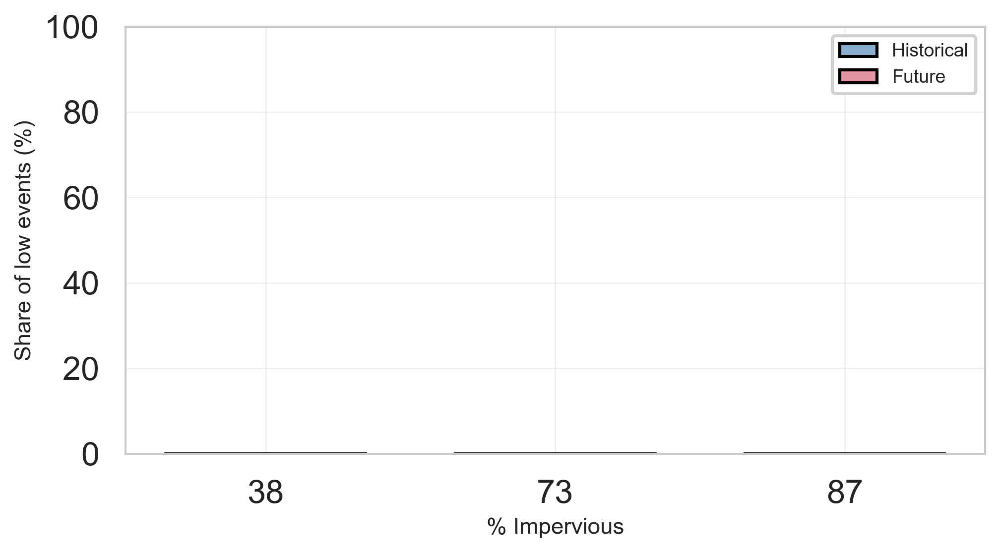

In [67]:
# # how many events generate low discharge
# # Urbanization levels to compare
urbanization_levels = [
    '38% urbanization',
#     # '42% urbanization',
#     # '49% urbanization',
#     # '53% urbanization',
#     # '57% urbanization',
    '73% urbanization',
#     # '81% urbanization',
#     # '83% urbanization',
    '87% urbanization'
]

# Define threshold (e.g., 0.0 for exact zeros or 0.1 for small runoff)
threshold = .1  # you can change this to 0.1 or any value you want

results = []

for level in urbanization_levels:
    hist = np.array(data_dict[level]['historical'])
    fut = np.array(data_dict[level]['future'])
    
    # Count number of low values (below threshold)
    hist_low = np.sum(hist <= threshold)
    fut_low = np.sum(fut <= threshold)
    
    # Total number of values
    hist_total = hist.size
    fut_total = fut.size
    
    # Calculate share of low values
    hist_share = hist_low / hist_total * 100
    fut_share = fut_low / fut_total * 100
    
    results.append({
        'urbanization': level,
        'historical_low_events': hist_low,
        'future_low_events': fut_low,
        'historical_%': hist_share,
        'future_%': fut_share
    })

# Display results neatly
import pandas as pd

df_results = pd.DataFrame(results)
print(df_results.to_string(index=False, float_format="%.2f"))



# === Simple visualization ===
x = np.arange(len(df_results))
w = 0.35

fig, ax = plt.subplots(figsize=(7, 4), dpi=300)
ax.bar(x - w/2, df_results["historical_%"], width=w,
       color="#89AED2", edgecolor="black", label="Historical")
ax.bar(x + w/2, df_results["future_%"], width=w,
       color="#E594A4", edgecolor="black", label="Future")

ax.set_xticks(x)
ax.set_xticklabels([lvl.split('%')[0] for lvl in df_results["urbanization"]])
ax.set_xlabel("% Impervious", fontsize=11)
ax.set_ylabel("Share of low events (%)", fontsize=11)
ax.set_ylim(0, 100)
ax.grid(True, axis="y", alpha=0.3)

ax.legend(frameon=True, framealpha=0.9, fontsize=9)
plt.tight_layout()
plt.show()



In [68]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import os

def plot_ecdf_with_band_only(hist_values, fut_values,
                             alpha=0.05, n_boot=1000, n_grid=512, rng_seed=42,
                             logit=True, strength=1.0,
                             x_label="Peak discharge",
                             hist_label="Historical", fut_label="Future",
                             legend_loc="lower right", legend_ci=True,
                             panel_label=None,
                             panel_label_pos=(-0.075, 1.02),
                             panel_label_fontsize=22,
                             panel_label_weight="bold",
                             axis_label_fontsize=22,
                             tick_fontsize=18,
                             title=None,                     # NEW
                             save_pdf_path=None              # NEW
):
    # ----- grid and ECDFs on common x -----
    x  = make_x_grid_from_two(hist_values, fut_values, n=n_grid)
    Fh = ecdf_on_grid(hist_values, x)
    Ff = ecdf_on_grid(fut_values,  x)

    # ----- bootstrap bands -----
    lo_h, hi_h = pooled_bootstrap_cdf_band(
        hist_values, x, n_boot=n_boot, alpha=alpha, rng_seed=rng_seed
    )
    lo_f, hi_f = pooled_bootstrap_cdf_band(
        fut_values,  x, n_boot=n_boot, alpha=alpha, rng_seed=rng_seed+1
    )

    # ----- colors -----
    hist_color = "#1E3A5F"
    hist_fill  = "#89AED2"
    fut_color  = "#7B1121"
    fut_fill   = "#E594A4"

#     fig, ax = plt.subplots(figsize=(14.0, 5.8), dpi=300)
    fig, ax = plt.subplots(figsize=(8, 6), dpi=300)

    # ----- draw ECDFs -----
    if logit:
        L = lambda p: _logit_scaled(p, strength=strength)

        ax.fill_between(x, L(lo_h), L(hi_h),
                        color=hist_fill, alpha=0.35, linewidth=0)
        ax.fill_between(x, L(lo_f), L(hi_f),
                        color=fut_fill, alpha=0.35, linewidth=0)

        ax.plot(x, L(Fh), lw=1.8, color=hist_color)
        ax.plot(x, L(Ff), lw=1.8, color=fut_color)

        ax.set_ylabel("CDF", fontsize=axis_label_fontsize)
        ax.set_ylim(-3, 3)

        pct_ticks = np.array([0.01, 0.05, 0.10, 0.50, 0.90, 0.95, 0.99])
        ax.set_yticks(_logit_scaled(pct_ticks, strength=strength))
        ax.set_yticklabels(
            [f"{int(pt*100)}%" for pt in pct_ticks],
            fontsize=tick_fontsize
        )

    else:
        ax.fill_between(x, lo_h, hi_h, color=hist_fill, alpha=0.35, linewidth=0)
        ax.fill_between(x, lo_f, hi_f, color=fut_fill, alpha=0.35, linewidth=0)

        ax.plot(x, Fh, lw=1.8, color=hist_color)
        ax.plot(x, Ff, lw=1.8, color=fut_color)

        ax.set_ylabel("ECDF", fontsize=axis_label_fontsize)
        ax.set_ylim(-0.02, 1.02)

    # ----- axes, ticks, grid -----
    ax.set_xlim(left=min(x))
    ax.set_xlabel(x_label, fontsize=axis_label_fontsize)

    if title is not None:
        ax.set_title(title, fontsize=axis_label_fontsize)

    ax.grid(True, axis="x", alpha=.7, linewidth=1)
    ax.grid(True, axis="y", alpha=.7, linewidth=1)

    for spine in ["top", "right"]:
        ax.spines[spine].set_visible(False)
    for spine in ["left", "bottom"]:
        ax.spines[spine].set_linewidth(0.8)
        ax.spines[spine].set_color("black")

    ax.minorticks_on()
    ax.tick_params(axis="both", which="major",
                   direction="in", length=5, width=0.9,
                   colors="black", labelsize=tick_fontsize)
    ax.tick_params(axis="both", which="minor",
                   direction="in", length=3, width=0.6,
                   colors="black", labelsize=0)

    # ----- legend -----
    legend_fontsize = tick_fontsize + 2

    handles = [
        Line2D([], [], color=hist_color, lw=1.8, label=hist_label),
        Line2D([], [], color=fut_color,  lw=1.8, label=fut_label),
    ]
    labels = [hist_label, fut_label]

    if legend_ci:
        from matplotlib.patches import Patch
        ci_pct = int((1 - alpha) * 100)
        ci_patch = Patch(facecolor="#808080", alpha=0.18, edgecolor="none",
                         label=f"{ci_pct}% bootstrap CI")
        handles.append(ci_patch)
        labels.append(f"{ci_pct}% bootstrap CI")

    ax.legend(handles=handles, labels=labels,
              loc=legend_loc, frameon=False,
              fontsize=legend_fontsize, handlelength=2.0)

    # ----- panel label -----
    if panel_label is not None:
        ax.text(panel_label_pos[0], panel_label_pos[1], str(panel_label),
                transform=ax.transAxes, fontsize=panel_label_fontsize,
                fontweight=panel_label_weight, ha="left", va="bottom")

    plt.tight_layout()

    # ---------- SAVE AS PDF (NEW) ----------
    if save_pdf_path is not None:
        os.makedirs(os.path.dirname(save_pdf_path), exist_ok=True)
        fig.savefig(save_pdf_path, format="pdf", dpi=300)

    return fig


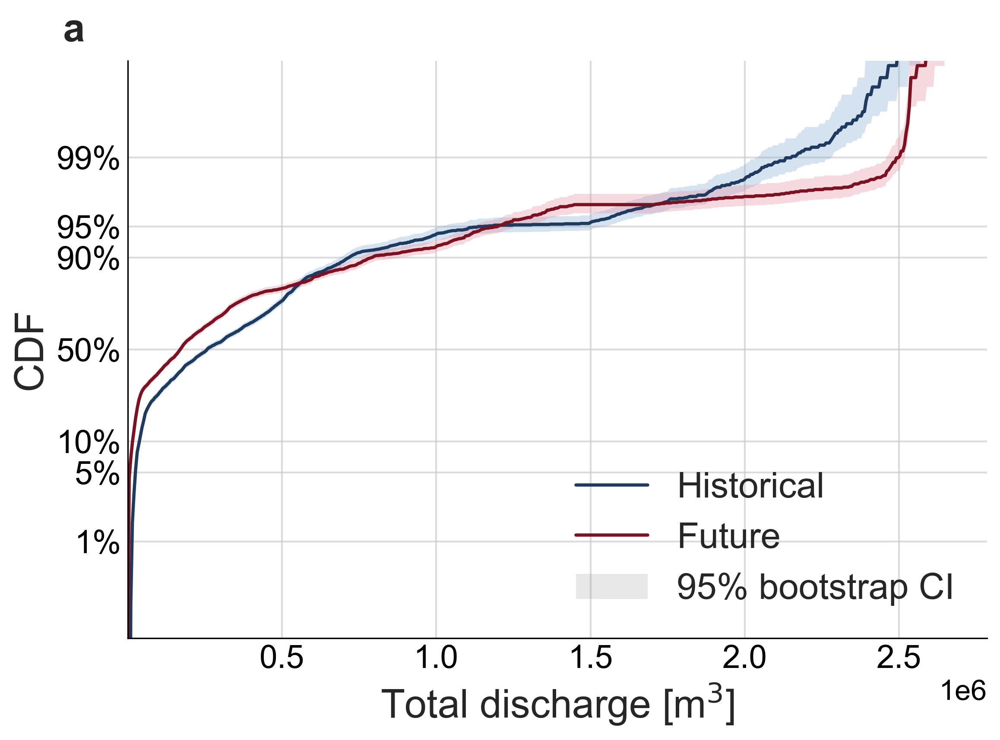

In [69]:
fig = plot_ecdf_with_band_only(
    data_dict['73% urbanization']['historical'],
    data_dict['73% urbanization']['future'],
    alpha=0.05, n_boot=2000, n_grid=512, rng_seed=42,
    logit=True, strength=1.0,
    x_label=x_label,
    hist_label="Historical", fut_label="Future",
    legend_loc="lower right",
    legend_ci=True,
    panel_label="a",
#     title="ECDF of Peak Discharge (73% Urbanization)",

#     save_pdf_path=r"D:\Development\RESEARCH\Documents\Papers\urban_runoff_response_to_hpes\Nature\Figures\Fig_S6_a.pdf"
)

plt.show()


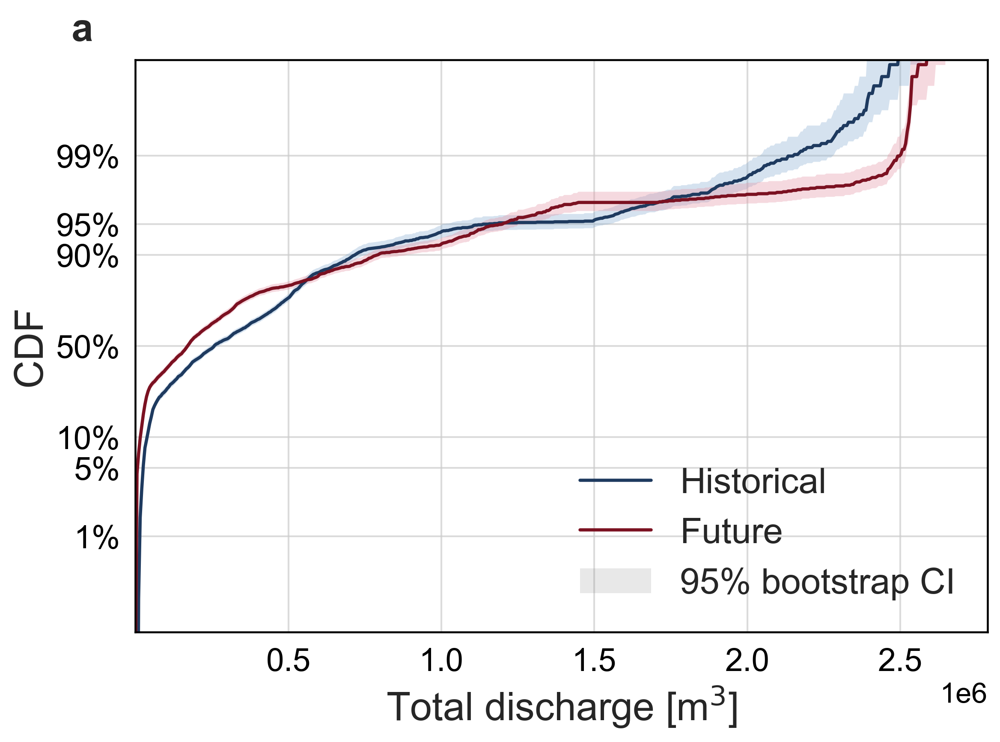

In [70]:
# 1. Generate the plot (remove the save_pdf_path from here)
fig = plot_ecdf_with_band_only(
    data_dict['73% urbanization']['historical'],
    data_dict['73% urbanization']['future'],
    alpha=0.05,
    n_boot=2000,
    n_grid=512,
    rng_seed=42,
    logit=True,
    strength=1.0,
    x_label=x_label,
    hist_label="Historical",
    fut_label="Future",
    legend_loc="lower right",
    legend_ci=True,
    panel_label="a"
    # Do not save inside the function
)

# 2. Apply Nature-style axes styling
ax = fig.axes[0]
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1.1)
    spine.set_color("black")

ax.tick_params(
    top=False, 
    right=False, 
    direction="out"
)

# 3. Save the figure AFTER styling
save_path = r"D:\Development\RESEARCH\Documents\Papers\urban_runoff_response_to_hpes\Nature\Figures\Fig_s_6a.pdf"
fig.savefig(save_path, format='pdf', bbox_inches='tight')

plt.show()

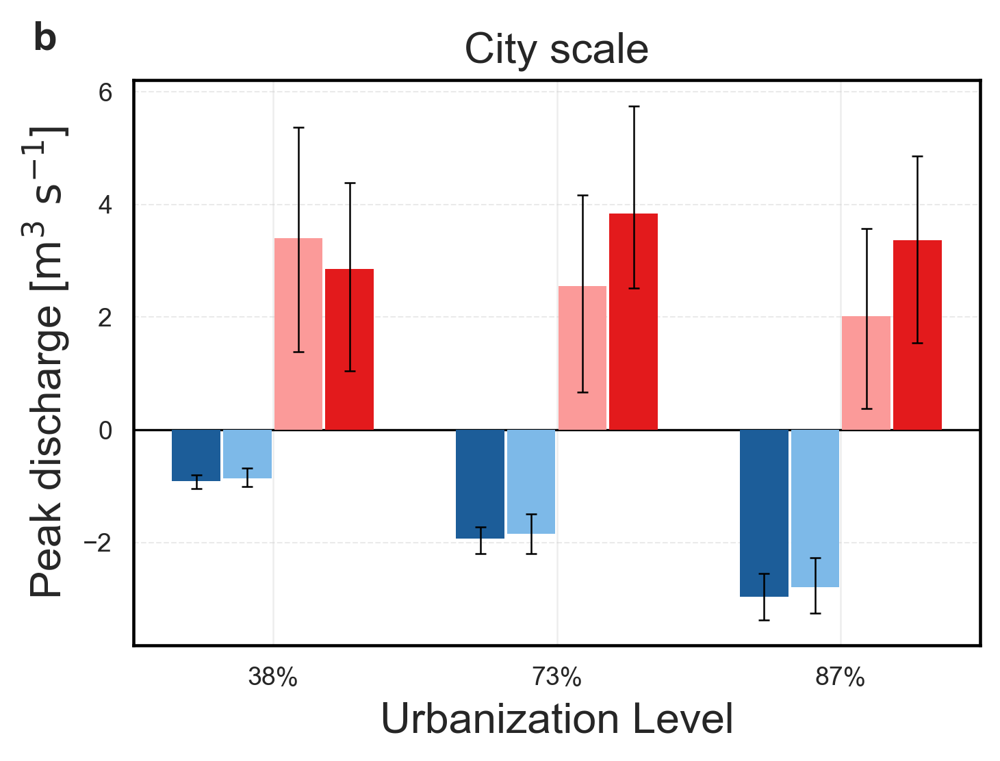

In [92]:
import os
import numpy as np
import matplotlib.pyplot as plt

# ---------- helpers ----------
def _bootstrap_ci(values, q, n_boot=2000, alpha=0.05, seed=0):
    """Return (center, low_halfwidth, high_halfwidth) for the q-th percentile via bootstrap."""
    v = np.asarray(values)
    v = v[~np.isnan(v)]
    if v.size == 0:
        return np.nan, np.nan, np.nan
    rng = np.random.default_rng(seed)
    n = v.size
    boots = np.percentile(v[rng.integers(0, n, size=(n_boot, n))], q, axis=1)
    lo, hi = np.nanpercentile(boots, [100*alpha/2, 100*(1-alpha/2)])
    center = np.percentile(v, q)
    return center, center - lo, hi - center


# ---------- main plot ----------
def plot_change_styled_dual_palette(
    data_dict,
    percentiles=(5, 10, 90, 95),
    urbanization_levels=None,
    mode="absolute",
    show_errorbars=False,
    n_boot=2000,
    alpha=0.05,
    seed=42,
    label_letter='b',
    figsize=(4.8, 4.0),
    dpi=300,
    x_label="Urbanization Level",
    y_label=r"Peak discharge [$\mathrm{m^3\ s^{-1}}$]",
    title=None,
    save_pdf_path=None
):
    # Sort urbanization levels numerically
    if urbanization_levels is None:
        def _key(k):
            try:
                return float(k.split('%')[0])
            except Exception:
                return k
        urbanization_levels = sorted(list(data_dict.keys()), key=_key)

    colors = {
        5:  '#1c5d99',
        10: '#7db9e8',
        90: '#fb9a99',
        95: '#e31a1c',
    }

    x = np.arange(len(urbanization_levels))
    nP = len(percentiles)
    barw = 0.17
    offsets = np.linspace(-0.27, 0.27, nP)

    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)

    for i, p in enumerate(percentiles):
        vals, lo, hi = [], [], []
        for lvl in urbanization_levels:
            h = data_dict[lvl]['historical']
            f = data_dict[lvl]['future']
            ch, loh, hih = _bootstrap_ci(h, p, n_boot, alpha, seed)
            cf, lof, hif = _bootstrap_ci(f, p, n_boot, alpha, seed + 1)

            if mode == "absolute":
                v = cf - ch
                elow, ehi = np.hypot(loh, lof), np.hypot(hih, hif)
            else:
                v = (cf - ch) / ch * 100 if (ch is not np.nan and ch != 0) else np.nan
                if ch and ch != 0:
                    elow = np.hypot(loh / abs(ch), lof / abs(ch)) * 100.0
                    ehi = np.hypot(hih / abs(ch), hif / abs(ch)) * 100.0
                else:
                    elow = ehi = np.nan

            vals.append(v)
            lo.append(elow)
            hi.append(ehi)

        ax.bar(
            x + offsets[i], vals, width=barw,
            color=colors[p], edgecolor='none', zorder=3,
            label=f"{p}th percentile"
        )

        if show_errorbars:
            ax.errorbar(
                x + offsets[i], vals,
                yerr=[lo, hi], fmt='none',
                ecolor='black', elinewidth=0.6,
                capsize=2, capthick=0.6, zorder=4
            )

    # Styling
    ax.axhline(0, color='black', lw=0.8, zorder=2)
    ax.set_xticks(x)
    ax.set_xticklabels([f"{float(l.split('%')[0]):.0f}%" for l in urbanization_levels], fontsize=15)
    ax.set_xlabel(x_label, fontsize=15)
    ax.set_ylabel(y_label if mode == "absolute" else "Relative change [%]", fontsize=15)

    if title is not None:
        ax.set_title(title, fontsize=15)

    ax.grid(axis='y', which='major', ls='--', lw=0.5, alpha=0.4, zorder=0)
    ax.tick_params(axis='both', labelsize=9, width=0.9, length=4, direction='out')

    # ---- Full black box around axes (like your example) ----
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.1)
        spine.set_color('black')

#         legend = ax.legend(
#             frameon=True, framealpha=1.0, edgecolor="#cccccc",
#             fontsize=10, title="Percentile", title_fontsize=12,
#             bbox_to_anchor=(0, 0.8),
#             loc='center left'
#         )
#         legend.get_frame().set_linewidth(0.6)

    if label_letter:
        ax.text(-0.12, 1.04, label_letter, transform=ax.transAxes,
                fontsize=14, fontweight='bold', va='bottom')

    plt.tight_layout(rect=[0, 0, 0.86, 1])

    # ---------- Save as PDF ----------
    if save_pdf_path is not None:
        os.makedirs(os.path.dirname(save_pdf_path), exist_ok=True)
        fig.savefig(save_pdf_path, format="pdf", dpi=max(dpi, 300))

    return fig


fig = plot_change_styled_dual_palette(
    data_dict,
    percentiles=(5, 10, 90, 95),
    urbanization_levels=['38% urbanization', '73% urbanization', '87% urbanization'],
    mode="absolute",
    show_errorbars=True,
    label_letter='b',
    title ='City scale',
    figsize=(6, 4.0),
    x_label="Urbanization Level",
#     y_label=r"Peak discharge [$\mathrm{m^3\ s^{-1}\ km^{-2}}$]",
#     y_label=r"Total discharge ['m$^3$']",
    save_pdf_path=r"D:\Development\RESEARCH\Documents\Papers\urban_runoff_response_to_hpes\Nature\Figures\Fig_4_b.pdf"
)

plt.show()


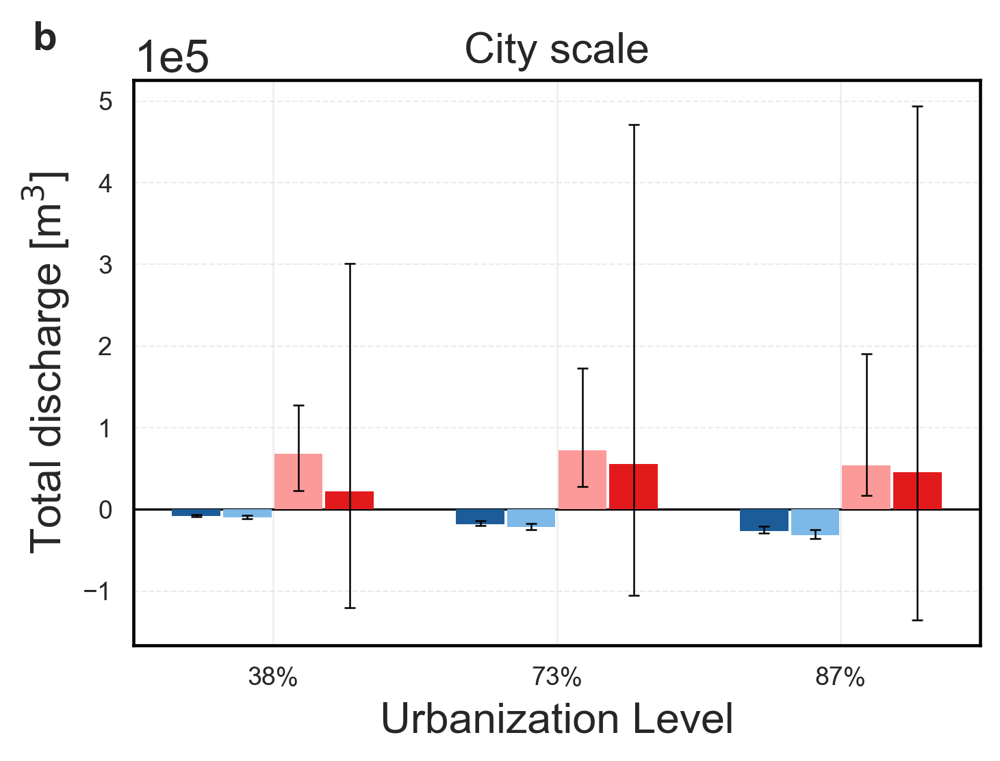

In [80]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter

# ---------- helpers ----------
def _bootstrap_ci(values, q, n_boot=2000, alpha=0.05, seed=0):
    """Return (center, low_halfwidth, high_halfwidth) for the q-th percentile via bootstrap."""
    v = np.asarray(values)
    v = v[~np.isnan(v)]
    if v.size == 0:
        return np.nan, np.nan, np.nan
    rng = np.random.default_rng(seed)
    n = v.size
    boots = np.percentile(v[rng.integers(0, n, size=(n_boot, n))], q, axis=1)
    lo, hi = np.nanpercentile(boots, [100*alpha/2, 100*(1-alpha/2)])
    center = np.percentile(v, q)
    return center, center - lo, hi - center


# ---------- main plot ----------
def plot_change_styled_dual_palette(
    data_dict,
    percentiles=(5, 10, 90, 95),
    urbanization_levels=None,
    mode="absolute",
    show_errorbars=False,
    n_boot=2000,
    alpha=0.05,
    seed=42,
    label_letter='b',
    figsize=(4.8, 4.0),
    dpi=300,
    x_label="Urbanization Level",
    y_label=r"Peak discharge [$\mathrm{m^3\ s^{-1}}$]",
    title=None,
    save_pdf_path=None
):
    # Sort urbanization levels numerically
    if urbanization_levels is None:
        def _key(k):
            try:
                return float(k.split('%')[0])
            except Exception:
                return k
        urbanization_levels = sorted(list(data_dict.keys()), key=_key)

    colors = {
        5:  '#1c5d99',
        10: '#7db9e8',
        90: '#fb9a99',
        95: '#e31a1c',
    }

    x = np.arange(len(urbanization_levels))
    nP = len(percentiles)
    barw = 0.17
    offsets = np.linspace(-0.27, 0.27, nP)

    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)

    for i, p in enumerate(percentiles):
        vals, lo, hi = [], [], []
        for lvl in urbanization_levels:
            h = data_dict[lvl]['historical']
            f = data_dict[lvl]['future']
            ch, loh, hih = _bootstrap_ci(h, p, n_boot, alpha, seed)
            cf, lof, hif = _bootstrap_ci(f, p, n_boot, alpha, seed + 1)

            if mode == "absolute":
                v = cf - ch
                elow, ehi = np.hypot(loh, lof), np.hypot(hih, hif)
            else:
                v = (cf - ch) / ch * 100 if (ch is not np.nan and ch != 0) else np.nan
                if ch and ch != 0:
                    elow = np.hypot(loh / abs(ch), lof / abs(ch)) * 100.0
                    ehi = np.hypot(hih / abs(ch), hif / abs(ch)) * 100.0
                else:
                    elow = ehi = np.nan

            vals.append(v)
            lo.append(elow)
            hi.append(ehi)

        ax.bar(
            x + offsets[i], vals, width=barw,
            color=colors[p], edgecolor='none', zorder=3,
            label=f"{p}th percentile"
        )

        if show_errorbars:
            ax.errorbar(
                x + offsets[i], vals,
                yerr=[lo, hi], fmt='none',
                ecolor='black', elinewidth=0.6,
                capsize=2, capthick=0.6, zorder=4
            )

    # Styling
    ax.axhline(0, color='black', lw=0.8, zorder=2)
    ax.set_xticks(x)
    ax.set_xticklabels([f"{float(l.split('%')[0]):.0f}%" for l in urbanization_levels], fontsize=15)
    ax.set_xlabel(x_label, fontsize=15)
    ax.set_ylabel(y_label if mode == "absolute" else "Relative change [%]", fontsize=15)

    if title is not None:
        ax.set_title(title, fontsize=15)

    ax.grid(axis='y', which='major', ls='--', lw=0.5, alpha=0.4, zorder=0)
    ax.tick_params(axis='both', labelsize=9, width=0.9, length=4, direction='out')

    # ---------- Y axis: force 1e5 (NOT ×10^5) ----------
    formatter = ScalarFormatter(useMathText=False)
    formatter.set_scientific(True)
    formatter.set_powerlimits((-2, 2))
    ax.yaxis.set_major_formatter(formatter)
    ax.ticklabel_format(axis='y', style='sci', scilimits=(-2, 2))

    # ---- Full black box around axes ----
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.1)
        spine.set_color('black')

    if label_letter:
        ax.text(-0.12, 1.04, label_letter, transform=ax.transAxes,
                fontsize=14, fontweight='bold', va='bottom')

    plt.tight_layout(rect=[0, 0, 0.86, 1])

    # ---------- Save as PDF ----------
    if save_pdf_path is not None:
        os.makedirs(os.path.dirname(save_pdf_path), exist_ok=True)
        fig.savefig(save_pdf_path, format="pdf", dpi=max(dpi, 300))

    return fig


fig = plot_change_styled_dual_palette(
    data_dict,
    percentiles=(5, 10, 90, 95),
    urbanization_levels=['38% urbanization', '73% urbanization', '87% urbanization'],
    mode="absolute",
    show_errorbars=True,
    label_letter='b',
    title='City scale',
    figsize=(6, 4.0),
    x_label="Urbanization Level",
    y_label=r"Total discharge [m$^3$]",
    save_pdf_path=r"D:\Development\RESEARCH\Documents\Papers\urban_runoff_response_to_hpes\Nature\Figures\Fig_s6_c.pdf"
)

plt.show()


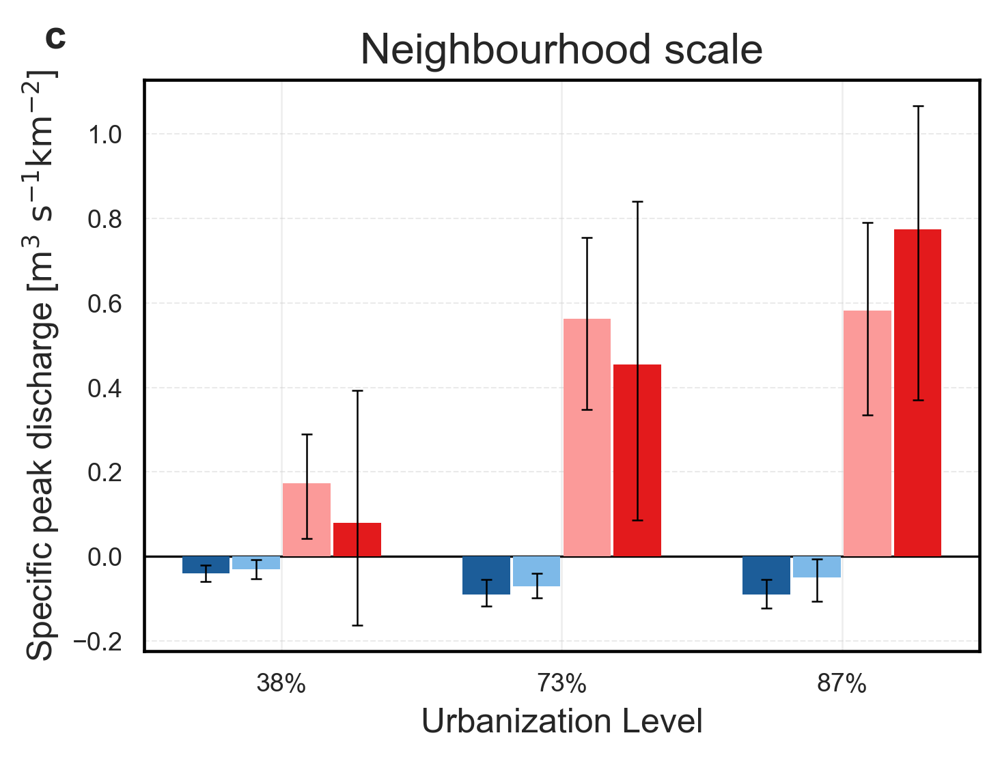

In [90]:
import os
import numpy as np
import matplotlib.pyplot as plt

# ---------- helpers ----------
def _bootstrap_ci(values, q, n_boot=2000, alpha=0.05, seed=0):
    """Return (center, low_halfwidth, high_halfwidth) for the q-th percentile via bootstrap."""
    v = np.asarray(values)
    v = v[~np.isnan(v)]
    if v.size == 0:
        return np.nan, np.nan, np.nan
    rng = np.random.default_rng(seed)
    n = v.size
    boots = np.percentile(v[rng.integers(0, n, size=(n_boot, n))], q, axis=1)
    lo, hi = np.nanpercentile(boots, [100*alpha/2, 100*(1-alpha/2)])
    center = np.percentile(v, q)
    return center, center - lo, hi - center


# ---------- main plot ----------
def plot_change_styled_dual_palette(
    data_dict,
    percentiles=(5, 10, 90, 95),
    urbanization_levels=None,
    mode="absolute",
    show_errorbars=False,
    n_boot=2000,
    alpha=0.05,
    seed=42,
    label_letter='b',
    figsize=(4.8, 4.0),
    dpi=300,
    x_label="Urbanization Level",
    y_label=r"Specific peak discharge [$\mathrm{m^3\ s^{-1} km^{-2}}$]",
    title=None,
    save_pdf_path=None
):
    # Sort urbanization levels numerically
    if urbanization_levels is None:
        def _key(k):
            try:
                return float(k.split('%')[0])
            except Exception:
                return k
        urbanization_levels = sorted(list(data_dict.keys()), key=_key)

    colors = {
        5:  '#1c5d99',
        10: '#7db9e8',
        90: '#fb9a99',
        95: '#e31a1c',
    }

    x = np.arange(len(urbanization_levels))
    nP = len(percentiles)
    barw = 0.17
    offsets = np.linspace(-0.27, 0.27, nP)

    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)

    for i, p in enumerate(percentiles):
        vals, lo, hi = [], [], []
        for lvl in urbanization_levels:
            h = data_dict[lvl]['historical']
            f = data_dict[lvl]['future']
            ch, loh, hih = _bootstrap_ci(h, p, n_boot, alpha, seed)
            cf, lof, hif = _bootstrap_ci(f, p, n_boot, alpha, seed + 1)

            if mode == "absolute":
                v = cf - ch
                elow, ehi = np.hypot(loh, lof), np.hypot(hih, hif)
            else:
                v = (cf - ch) / ch * 100 if (ch is not np.nan and ch != 0) else np.nan
                if ch and ch != 0:
                    elow = np.hypot(loh / abs(ch), lof / abs(ch)) * 100.0
                    ehi = np.hypot(hih / abs(ch), hif / abs(ch)) * 100.0
                else:
                    elow = ehi = np.nan

            vals.append(v)
            lo.append(elow)
            hi.append(ehi)

        ax.bar(
            x + offsets[i], vals, width=barw,
            color=colors[p], edgecolor='none', zorder=3,
            label=f"{p}th percentile"
        )

        if show_errorbars:
            ax.errorbar(
                x + offsets[i], vals,
                yerr=[lo, hi], fmt='none',
                ecolor='black', elinewidth=0.6,
                capsize=2, capthick=0.6, zorder=4
            )

    # Styling
    ax.axhline(0, color='black', lw=0.8, zorder=2)
    ax.set_xticks(x)
    ax.set_xticklabels(
        [f"{float(l.split('%')[0]):.0f}%" for l in urbanization_levels],
        fontsize=15
    )
    ax.set_xlabel(x_label, fontsize=12)
    ax.set_ylabel(y_label if mode == "absolute" else "Relative change [%]", fontsize=12)

    if title is not None:
        ax.set_title(title, fontsize=15)

    ax.tick_params(axis='both', labelsize=9, width=0.9, length=4, direction='out')

    # Force scientific notation on Y-axis (1eX style)
    ax.ticklabel_format(axis='y', style='sci', scilimits=(0, 0))

    ax.grid(axis='y', which='major', ls='--', lw=0.5, alpha=0.4, zorder=0)

    # ---- Full black box around axes ----
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_linewidth(1.1)
        spine.set_color('black')

    if label_letter:
        ax.text(
            -0.12, 1.04, label_letter,
            transform=ax.transAxes,
            fontsize=14, fontweight='bold', va='bottom'
        )

    plt.tight_layout(rect=[0, 0, 0.86, 1])

    # ---------- Save as PDF ----------
    if save_pdf_path is not None:
        os.makedirs(os.path.dirname(save_pdf_path), exist_ok=True)
        fig.savefig(save_pdf_path, format="pdf", dpi=max(dpi, 300))

    return fig


# Call
fig = plot_change_styled_dual_palette(
    data_dict,
    percentiles=(5, 10, 90, 95),
    urbanization_levels=['38% urbanization', '73% urbanization', '87% urbanization'],
    mode="absolute",
    show_errorbars=True,
    label_letter='c',
    title='Neighbourhood scale',
    figsize=(6, 4.0),
    x_label="Urbanization Level",
#     y_label=r"Total runoff specific volume [$\mathrm{m^3\ km^{-2}}$]",
    save_pdf_path=r"D:\Development\RESEARCH\Documents\Papers\urban_runoff_response_to_hpes\Nature\Figures\Fig_4_c.pdf"
)

plt.show()


C:\Users\raznu\AppData\Local\Temp\ipykernel_26924\3581082914.py:176: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


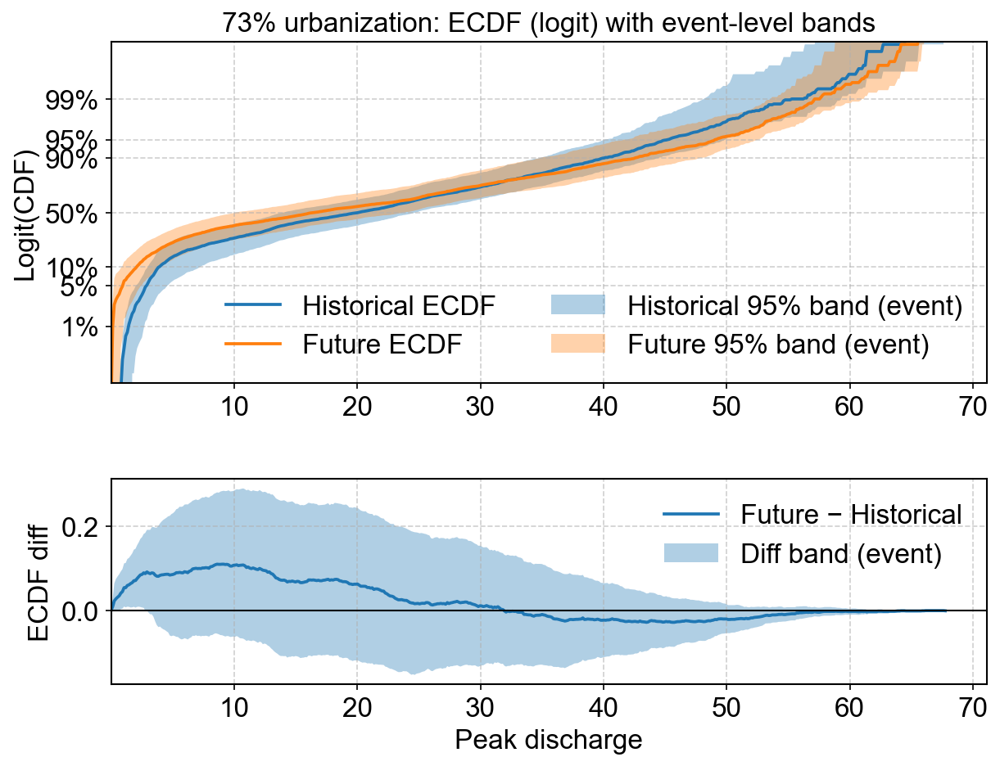

In [25]:
# ===== ECDF with event-level bootstrap bands, plotted on a logit Y-scale (like your example) =====
# Works directly with your prepared arrays:
#   hist_values = data_dict['73% urbanization']['historical']
#   fut_values  = data_dict['73% urbanization']['future']
#
# Top panel: ECDFs + 95% bootstrap bands on a logit scale (with "strength" control)
# Bottom panel: ECDF difference (Future − Historical) + 95% bands on a linear scale

import numpy as np
import matplotlib.pyplot as plt

# ---------- logit helpers (style like your create_cdf_logit_strength) ----------
def _logit_base(p, eps=1e-6):
    p = np.clip(p, eps, 1 - eps)
    return np.log10(p / (1 - p))

def _logit_scaled(p, strength=1.0, eps=1e-6):
    return _logit_base(p, eps=eps) * strength

# ---------- ECDF utilities ----------
def make_x_grid_from_two(a, b, n=512):
    a = np.asarray(a); b = np.asarray(b)
    xmin, xmax = np.min([a.min(), b.min()]), np.max([a.max(), b.max()])
    if xmin == xmax:
        eps = 1e-9 if xmin == 0 else abs(xmin)*1e-9
        return np.linspace(xmin - eps, xmax + eps, n)
    return np.linspace(xmin, xmax, n)

def ecdf_on_grid(values, x_grid):
    v = np.sort(np.asarray(values))
    counts = np.searchsorted(v, x_grid, side="right")
    return counts / float(v.size)  # in [0,1]

# ---------- event structure + bootstrap ----------
def build_event_blocks(values, block_size=81):
    v = np.asarray(values)
    n = v.size
    if n % block_size != 0:
        raise ValueError(f"Array length {n} not divisible by block_size={block_size}")
    return [v[i*block_size:(i+1)*block_size] for i in range(n // block_size)]

def event_bootstrap_cdf_band(values, x_grid, block_size=81, n_boot=1000, alpha=0.05, rng_seed=None):
    rng = np.random.default_rng(rng_seed)
    blocks = build_event_blocks(values, block_size)
    m = len(blocks)  # number of events
    boot = np.empty((n_boot, x_grid.size), dtype=float)
    for b in range(n_boot):
        idx = rng.integers(0, m, size=m)         # resample events with replacement
        vb = np.concatenate([blocks[i] for i in idx], axis=0)
        boot[b] = ecdf_on_grid(vb, x_grid)
    lo = np.nanpercentile(boot, 100*alpha/2, axis=0)
    hi = np.nanpercentile(boot, 100*(1 - alpha/2), axis=0)
    return lo, hi

def unpaired_event_bootstrap_cdf_diff(hist_values, fut_values, x_grid,
                                      block_size=81, n_boot=1000, alpha=0.05, rng_seed=None):
    rng = np.random.default_rng(rng_seed)
    h_blocks = build_event_blocks(hist_values, block_size)
    f_blocks = build_event_blocks(fut_values,  block_size)
    mh, mf = len(h_blocks), len(f_blocks)
    boot = np.empty((n_boot, x_grid.size), dtype=float)
    for b in range(n_boot):
        ih = rng.integers(0, mh, size=mh)        # resample events independently (UNPAIRED)
        iff = rng.integers(0, mf, size=mf)
        hb = np.concatenate([h_blocks[i] for i in ih], axis=0)
        fb = np.concatenate([f_blocks[i] for i in iff], axis=0)
        Fh = ecdf_on_grid(hb, x_grid)
        Ff = ecdf_on_grid(fb, x_grid)
        boot[b] = Ff - Fh
    lo = np.nanpercentile(boot, 100*alpha/2, axis=0)
    hi = np.nanpercentile(boot, 100*(1 - alpha/2), axis=0)
    return lo, hi

# ---------- optional pooled bootstrap (for comparison overlay) ----------
def pooled_bootstrap_cdf_band(values, x_grid, n_boot=1000, alpha=0.05, rng_seed=None):
    rng = np.random.default_rng(rng_seed)
    v = np.asarray(values); n = v.size
    boot = np.empty((n_boot, x_grid.size), dtype=float)
    for b in range(n_boot):
        vb = v[rng.integers(0, n, size=n)]
        boot[b] = ecdf_on_grid(vb, x_grid)
    lo = np.nanpercentile(boot, 100*alpha/2, axis=0)
    hi = np.nanpercentile(boot, 100*(1 - alpha/2), axis=0)
    return lo, hi

def unpaired_bootstrap_cdf_diff(hist_values, fut_values, x_grid, n_boot=1000, alpha=0.05, rng_seed=None):
    rng = np.random.default_rng(rng_seed)
    h = np.asarray(hist_values); f = np.asarray(fut_values)
    nh, nf = h.size, f.size
    boot = np.empty((n_boot, x_grid.size), dtype=float)
    for b in range(n_boot):
        hb = h[rng.integers(0, nh, size=nh)]
        fb = f[rng.integers(0, nf, size=nf)]
        Fh = ecdf_on_grid(hb, x_grid)
        Ff = ecdf_on_grid(fb, x_grid)
        boot[b] = Ff - Fh
    lo = np.nanpercentile(boot, 100*alpha/2, axis=0)
    hi = np.nanpercentile(boot, 100*(1 - alpha/2), axis=0)
    return lo, hi

# ---------- plotting on logit scale (top) + linear diff (bottom) ----------
def plot_ecdf_event_bands_logit(hist_values, fut_values,
                                block_size=81, alpha=0.05, n_boot=1000, n_grid=512,
                                rng_seed=42, overlay_pooled=False,
                                strength=1.0, x_label="Peak discharge",
                                title="ECDF with event-level bootstrap bands (logit scale)",
                                hist_label="Historical", fut_label="Future"):
    x = make_x_grid_from_two(hist_values, fut_values, n=n_grid)

    # ECDFs
    Fh = ecdf_on_grid(hist_values, x)
    Ff = ecdf_on_grid(fut_values,  x)

    # Event-level bands
    h_lo_ev, h_hi_ev = event_bootstrap_cdf_band(hist_values, x, block_size=block_size,
                                                n_boot=n_boot, alpha=alpha, rng_seed=rng_seed)
    f_lo_ev, f_hi_ev = event_bootstrap_cdf_band(fut_values,  x, block_size=block_size,
                                                n_boot=n_boot, alpha=alpha, rng_seed=rng_seed+1)
    d_lo_ev, d_hi_ev = unpaired_event_bootstrap_cdf_diff(hist_values, fut_values, x,
                                                         block_size=block_size, n_boot=n_boot,
                                                         alpha=alpha, rng_seed=rng_seed+2)
    D = Ff - Fh

    # Optional pooled overlay
    if overlay_pooled:
        h_lo_pl, h_hi_pl = pooled_bootstrap_cdf_band(hist_values, x, n_boot=n_boot, alpha=alpha, rng_seed=rng_seed+3)
        f_lo_pl, f_hi_pl = pooled_bootstrap_cdf_band(fut_values,  x, n_boot=n_boot, alpha=alpha, rng_seed=rng_seed+4)
        d_lo_pl, d_hi_pl = unpaired_bootstrap_cdf_diff(hist_values, fut_values, x, n_boot=n_boot, alpha=alpha, rng_seed=rng_seed+5)

    # Transform to logit scale for top panel (bands + lines)
    def L(p): return _logit_scaled(p, strength=strength)
    Fh_L, Ff_L = L(Fh), L(Ff)
    h_lo_ev_L, h_hi_ev_L = L(h_lo_ev), L(h_hi_ev)
    f_lo_ev_L, f_hi_ev_L = L(f_lo_ev), L(f_hi_ev)
    if overlay_pooled:
        h_lo_pl_L, h_hi_pl_L = L(h_lo_pl), L(h_hi_pl)
        f_lo_pl_L, f_hi_pl_L = L(f_lo_pl), L(f_hi_pl)

    # Figure
    fig = plt.figure(figsize=(9.2, 6.8), dpi=150)
    gs = fig.add_gridspec(2, 1, height_ratios=[2.0, 1.2], hspace=0.35)

    # Top: ECDF on logit scale
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.fill_between(x, h_lo_ev_L, h_hi_ev_L, alpha=0.35, label=f"{hist_label} {int((1-alpha)*100)}% band (event)")
    ax1.fill_between(x, f_lo_ev_L, f_hi_ev_L, alpha=0.35, label=f"{fut_label} {int((1-alpha)*100)}% band (event)")
    if overlay_pooled:
        ax1.fill_between(x, h_lo_pl_L, h_hi_pl_L, alpha=0.15, label=f"{hist_label} band (pooled)")
        ax1.fill_between(x, f_lo_pl_L, f_hi_pl_L, alpha=0.15, label=f"{fut_label} band (pooled)")
    ax1.plot(x, Fh_L, lw=1.8, label=f"{hist_label} ECDF")
    ax1.plot(x, Ff_L, lw=1.8, label=f"{fut_label} ECDF")

    ax1.set_ylabel("Logit(CDF)")
    ax1.set_xlabel(None)
    ax1.set_xlim(left=min(x))
    ax1.set_ylim(-3, 3)  # fixed bounds like your example; "strength" affects lines/ticks, not bounds
    pct_ticks = np.array([0.01, 0.05, 0.10, 0.50, 0.90, 0.95, 0.99])
    ax1.set_yticks(_logit_scaled(pct_ticks, strength=strength))
    ax1.set_yticklabels([f"{int(p*100)}%" for p in pct_ticks])
    ax1.grid(ls="--", alpha=0.6)
    ax1.set_title(title)
    ax1.legend(frameon=False, ncol=2)

    # Bottom: ECDF difference on linear scale
    ax2 = fig.add_subplot(gs[1, 0], sharex=ax1)
    ax2.fill_between(x, d_lo_ev, d_hi_ev, alpha=0.35, label="Diff band (event)")
    if overlay_pooled:
        ax2.fill_between(x, d_lo_pl, d_hi_pl, alpha=0.15, label="Diff band (pooled)")
    ax2.plot(x, D, lw=1.8, label=f"{fut_label} − {hist_label}")
    ax2.axhline(0.0, color="k", lw=1.0)
    ax2.set_xlabel(x_label)
    ax2.set_ylabel("ECDF diff")
    ax2.grid(ls="--", alpha=0.6)
    ax2.legend(frameon=False)

    plt.tight_layout()
    plt.show()

# ===== Example usage with your dict =====
hist_values = data_dict['73% urbanization']['historical']
fut_values  = data_dict['73% urbanization']['future']

plot_ecdf_event_bands_logit(hist_values, fut_values,
                            block_size=81, alpha=0.05, n_boot=2000, n_grid=512,
                            rng_seed=42, overlay_pooled=False,
                            strength=1.0, x_label="Peak discharge",
                            title="73% urbanization: ECDF (logit) with event-level bands")


# PLOT

In [26]:
percentile_results = compute_percentiles(data_dict, percentiles=input_percentiles)

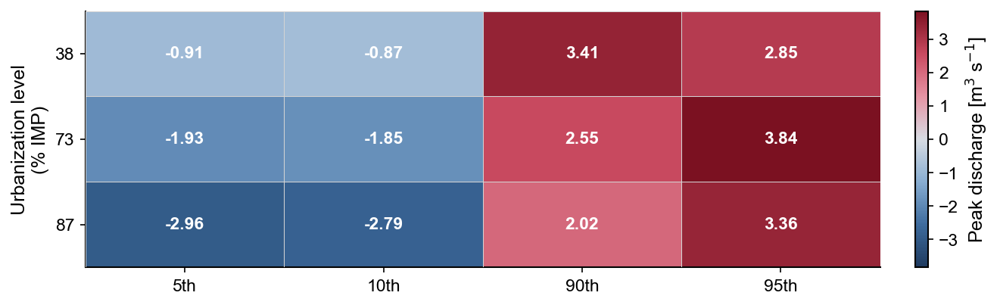

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, TwoSlopeNorm
from matplotlib import cm

# ------------------------ styling helpers ------------------------
def _house_style():
    """Apply a clean, publication-grade style."""
    plt.rcParams.update({
        "figure.dpi": 150,
        "savefig.dpi": 300,
        "axes.spines.top": False,
        "axes.spines.right": False,
        "axes.grid": False,          # heatmap cells act as the grid
        "font.size": 12,
        "axes.labelsize": 12,
        "xtick.labelsize": 11,
        "ytick.labelsize": 11,
        "legend.frameon": False,
    })


def _format_value(val):
    """Format cell value with adaptive precision."""
    if not np.isfinite(val):
        return ""
    av = abs(val)
    if av >= 100:
        return f"{val:.0f}"
    if av >= 10:
        return f"{val:.1f}"
    return f"{val:.2f}"

# ------------------------ data prep ------------------------
def _tidy(percentile_results, percentiles):
    """
    Convert nested dict {scenario: {"historical": {p: v}, "future": {p: v}}}
    into a tidy DataFrame with delta and percent change.
    """
    rows = []
    for scen, d in percentile_results.items():
        try:
            urb = float(str(scen).split("%")[0])
        except Exception:
            urb = np.nan
        for p in percentiles:
            if p in d.get("historical", {}) and p in d.get("future", {}):
                h = float(d["historical"][p])
                f = float(d["future"][p])
                delta = f - h
                pct = np.nan if h == 0 else 100.0 * delta / h
                rows.append(dict(
                    scenario=scen, urbanization=urb, percentile=p,
                    historical=h, future=f, delta=delta, pct_change=pct
                ))
            # silently skip missing pairs to keep the figure clean
    df = pd.DataFrame(rows)
    if df.empty:
        return df

    df = df.sort_values(["urbanization", "percentile"]).reset_index(drop=True)
    scen_order = (df[["scenario", "urbanization"]]
                  .drop_duplicates()
                  .sort_values("urbanization")["scenario"].tolist())
    df["scenario"] = pd.Categorical(df["scenario"], categories=scen_order, ordered=True)
    return df

# ------------------------ colormap factory ------------------------
def _diverging_cmap():
    """
    Deep, balanced blue–rose diverging palette.
    Midpoint is a muted gray-blue instead of white,
    giving smoother transition around zero and avoiding over-bright center.
    """
    colors = [
        "#1E3A5F",  # deep navy blue (safe)
        "#3E6C9E",  # strong blue
        "#89AED2",  # light but still saturated blue
        "#D8DCE3",  # neutral gray-blue midpoint (less bright than white)
        "#E594A4",  # rose
        "#C94A60",  # pinkish red
        "#7B1121",  # deep crimson (risk)
    ]
    return LinearSegmentedColormap.from_list("diverging_delta_blue_crimson_muted_center", colors)


# ------------------------ main figure ------------------------
def fig_delta_heatmap_text(percentile_results,
                           percentiles,
                           x_label="Change (Future − Historical)",
                           y_label="Urbanization level\n(% IMP)",
                           annotate=True,
                           cell_edge=True,
                           cell_edge_color="lightgray",
                           cell_edge_width=0.5,
                           figsize_per_row=0.55,
                           base_width=9.0):
    """
    Heatmap of deltas by percentile (columns) and scenario (rows).

    Parameters
    ----------
    percentile_results : dict
        Nested dict: {scenario: {"historical": {p: v}, "future": {p: v}}}
    percentiles : list-like
        Percentiles to plot (e.g., [5, 10, 25, 50, 75, 90, 95])
    x_label : str
        Colorbar label. Will be applied verbatim.
    y_label : str
        Y-axis label. Default matches the requested text.
    annotate : bool
        If True, draw values inside cells with contrast-aware text.
    cell_edge : bool
        If True, draw subtle cell borders.
    cell_edge_color : str
        Color for cell borders.
    cell_edge_width : float
        Line width for cell borders.
    figsize_per_row : float
        Height per row to keep compact yet legible.
    base_width : float
        Figure width in inches.

    Returns
    -------
    fig : matplotlib.figure.Figure
    """
    _house_style()
    df = _tidy(percentile_results, percentiles)
    if df.empty:
        fig, ax = plt.subplots(figsize=(6, 3))
        ax.text(0.5, 0.5, "No data to display", ha="center", va="center")
        ax.axis("off")
        return fig

    scenarios = list(df["scenario"].cat.categories)
    P = sorted(set(p for p in percentiles if p in df["percentile"].unique()))

    # Build matrix with scenarios as rows and percentiles as columns
    mat = (df.pivot_table(index="scenario", columns="percentile", values="delta", aggfunc="mean")
             .reindex(index=scenarios, columns=P)
             .to_numpy())

    # Symmetric limits around zero
    vmax = np.nanmax(np.abs(mat))
    if not np.isfinite(vmax) or vmax == 0:
        vmax = 1.0
    norm = TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax)
    cmap = _diverging_cmap()

    # Figure size scales with number of rows
    fig_height = max(2.5, figsize_per_row * len(scenarios) + 1.2)
    fig, ax = plt.subplots(figsize=(base_width, fig_height))

    im = ax.imshow(mat, cmap=cmap, norm=norm, aspect="auto", interpolation="nearest")

    # X axis
    ax.set_xticks(range(len(P)))
    ax.set_xticklabels([f"{p}th" for p in P])

    # Y axis: show only the numeric urbanization value, axis label indicates percent
    urb_map = df.groupby("scenario", observed=True)["urbanization"].first().reindex(scenarios)
    ax.set_yticks(range(len(scenarios)))
    ax.set_yticklabels([f"{int(round(u))}" if np.isfinite(u) else "" for u in urb_map.values])

    ax.set_xlabel("")  # no top title, keep bottom clean
    ax.set_ylabel(y_label)

    # No overall title as requested


    # Cell annotations (uniform white text)
    if annotate:
        for i in range(mat.shape[0]):
            for j in range(mat.shape[1]):
                val = mat[i, j]
                if np.isfinite(val):
                    txt = _format_value(val)
                    ax.text(
                        j, i, txt,
                        ha="center", va="center",
                        color="white",       # all text white
                        fontsize=11,
                        fontweight="bold"
                    )


    # Optional subtle cell borders
    if cell_edge:
        n_rows, n_cols = mat.shape
        for x in np.arange(-0.5, n_cols, 1):
            ax.axvline(x, color=cell_edge_color, linewidth=cell_edge_width, zorder=3)
        for y in np.arange(-0.5, n_rows, 1):
            ax.axhline(y, color=cell_edge_color, linewidth=cell_edge_width, zorder=3)

    # Colorbar with exact requested label
    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(x_label)

    # Tight layout for a clean look
    fig.tight_layout()
    return fig

# ------------ example (comment out in production) ------------
fig = fig_delta_heatmap_text(percentile_results, input_percentiles,
                             x_label= x_label,
                             y_label="Urbanization level\n(% IMP)")
plt.show()


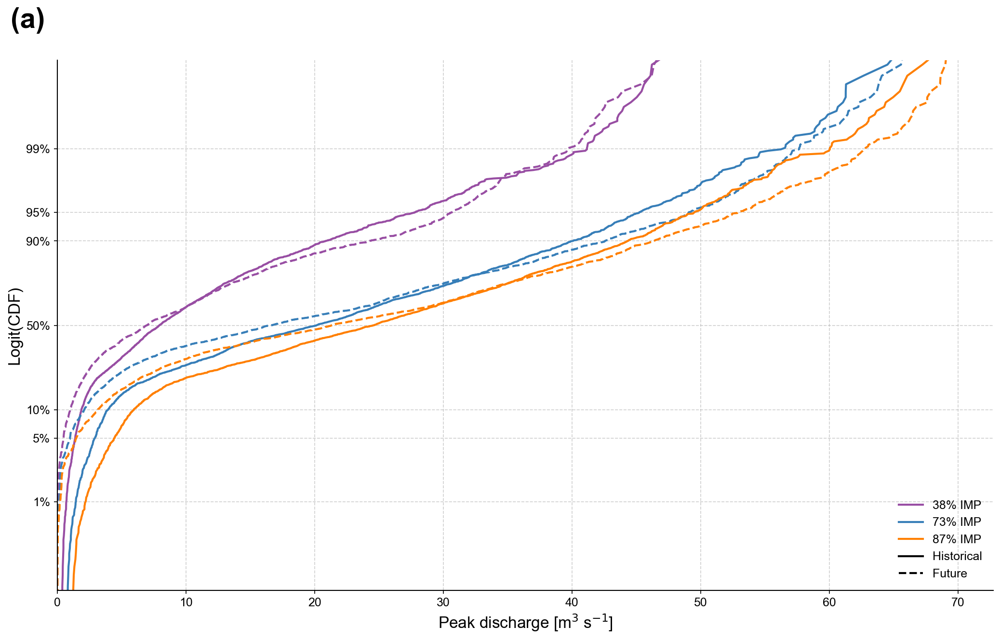

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from itertools import cycle

def create_cdf_logit_strength(
    data_dict, x_label, selected_scenarios,
    strength=1.0               # 0 = CDF רגיל, 1 = logit קלאסי, >1 = זנבות מודגשים
):
    """CDF with logit Y-axis; strength משפיע רק על הקווים וה־ticks, לא על גבול-הציר."""

    # --- helper functions ----------------------------------------------------
    def logit_base(p):          # logit ללא כפל
        p = np.clip(p, 1e-6, 1-1e-6)
        return np.log10(p / (1-p))

    def logit_scaled(p):        # logit מוכפל בידית-גז
        return logit_base(p) * strength

    # --- figure --------------------------------------------------------------
    fig, ax = plt.subplots(figsize=(14, 9))
    pal = cycle(["#984EA3","#377EB8","#FF7F00","#E41A1C",
                 "#A65628","#999999","#66A61E","#FFD92F"])
    cols = [next(pal) for _ in range(len(data_dict))]

    # --- draw CDF curves -----------------------------------------------------
    for (lbl, d), c in zip(data_dict.items(), cols):
        n = len(d['historical'])
        p = np.linspace(1/(n+1), n/(n+1), n)
        ax.plot(np.sort(d['historical']), logit_scaled(p),
                color=c, lw=2, ls='-')
        n = len(d['future'])
        p = np.linspace(1/(n+1), n/(n+1), n)
        ax.plot(np.sort(d['future']),     logit_scaled(p),
                color=c, lw=2, ls='--')

    # --- axis: קבוע ±3 ⇒ מכסה ~0.05 %–99.95 % -------------------------------
    ax.set_xlabel(x_label, fontsize=16)
    ax.set_ylabel("Logit(CDF)", fontsize=16)
    ax.set_xlim(left=0)
    ax.set_ylim(-3, 3)                    # שומרים קבוע – strength מזיז קווים
    ax.text(-0.05, 1.05, '(a)', transform=ax.transAxes, fontsize=28, fontweight='bold', va='bottom')
    # ticks (אותם % תמיד, מוכפלים ב-strength)
    pct_ticks = np.array([0.01,0.05,0.1,0.5,0.9,0.95,0.99])
    ax.set_yticks(logit_scaled(pct_ticks))
    ax.set_yticklabels([f"{int(p*100)}%" for p in pct_ticks])

    ax.grid(ls='--', alpha=.6)
    ax.tick_params(labelsize=12)

    # --- legend --------------------------------------------------------------
    handles=[]
    for (lbl,_), c in zip(data_dict.items(), cols):
        pct = next((s.split('%')[0].strip()
                    for s in selected_scenarios if s.startswith(lbl)), None)
        if pct:
            handles.append(mlines.Line2D([], [], color=c, lw=2,
                                         label=f"{pct}% IMP"))
    handles += [mlines.Line2D([], [], color='k', lw=2, ls='-',  label='Historical'),
                mlines.Line2D([], [], color='k', lw=2, ls='--', label='Future')]
    ax.legend(handles=handles, loc='lower right', framealpha=.9, fontsize=12)

    plt.tight_layout();  plt.show()


# ---------- דוגמאות להריץ ----------
# create_cdf_logit_strength(data_dict, x_label, selected_scenarios, strength=1.5)   # CDF ליניארי
create_cdf_logit_strength(data_dict, x_label, selected_scenarios, strength=1)   # logit קלאסי
# create_cdf_logit_strength(data_dict, x_label, selected_scenarios, strength=2)   # זנבות מודגשים


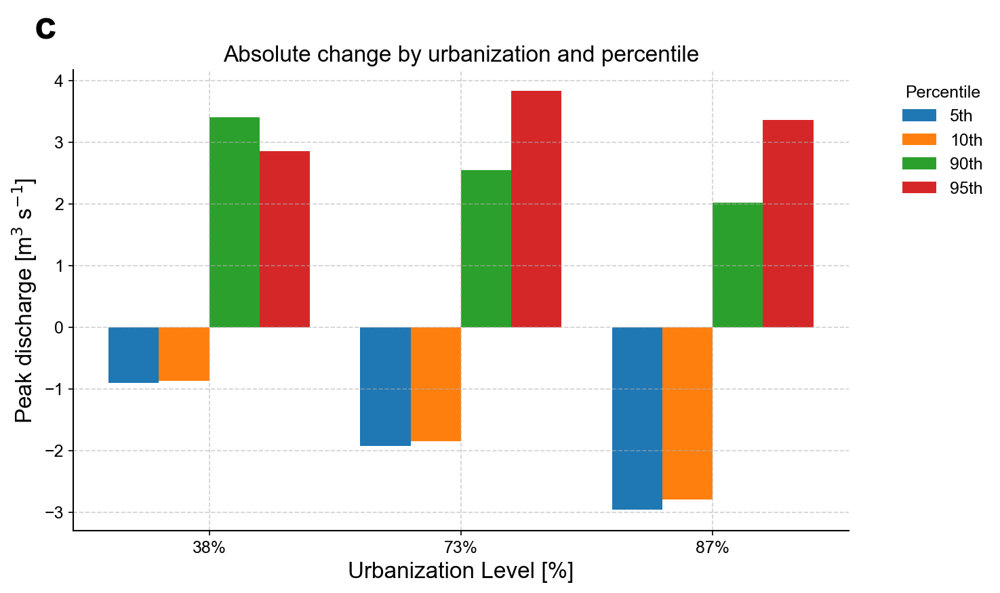

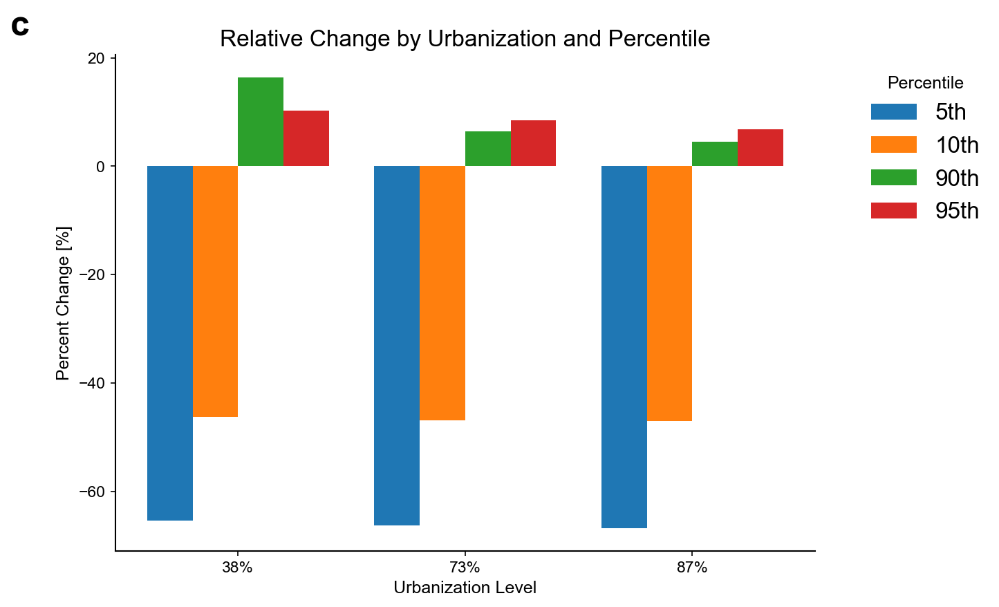

In [29]:
def plot_absolute_change_by_urbanization(
    percentile_results,
    percentiles,
    y_label,
    title=None,
    x_label="Urbanization Level [%]",
    label_letter=None
):
    """
    Plots grouped bar chart showing absolute change (Future - Historical)
    for each urbanization scenario and percentile.

    Parameters:
    - percentile_results: dict of scenario -> {'historical': {p: val}, 'future': {p: val}}
    - percentiles: list of percentiles to include (e.g., [25, 50, 75])
    - y_label (str): Y-axis label including units, e.g., 'Total runoff volume [m³]'
    - title (str, optional): Figure title; defaults to a generic title if None
    - x_label (str): X-axis label (default 'Urbanization Level [%]')
    - label_letter (str, optional): Subplot label, e.g., '(b)'

    Returns:
    - Matplotlib figure object
    """
    scenarios = list(percentile_results.keys())

    # Sort scenarios by urbanization percentage if possible
    try:
        sorted_indices = sorted(range(len(scenarios)), key=lambda i: float(scenarios[i].split("%")[0]))
    except Exception:
        sorted_indices = list(range(len(scenarios)))
    sorted_scenarios = [scenarios[i] for i in sorted_indices]

    num_scenarios = len(sorted_scenarios)
    num_percentiles = len(percentiles)

    # Calculate absolute differences
    absolute_changes = {scenario: [] for scenario in sorted_scenarios}
    for scenario in sorted_scenarios:
        for p in percentiles:
            hist = percentile_results[scenario]['historical'][p]
            fut = percentile_results[scenario]['future'][p]
            absolute_changes[scenario].append(fut - hist)

    # X positions and colors
    x = np.arange(num_scenarios)
    bar_width = 0.8 / num_percentiles
    cmap = plt.get_cmap("tab10")
    colors = [cmap(i) for i in range(num_percentiles)]

    fig, ax = plt.subplots(figsize=(max(10, num_scenarios * 1.5), 6))

    for i, p in enumerate(percentiles):
        vals = [absolute_changes[scenario][i] for scenario in sorted_scenarios]
        offset = (i - num_percentiles / 2) * bar_width + bar_width / 2
        ax.bar(x + offset, vals, width=bar_width, color=colors[i], label=f"{p}th")

    # Format x-ticks
    x_labels = []
    for scenario in sorted_scenarios:
        try:
            urb = float(scenario.split("%")[0])
            x_labels.append(f"{urb:.0f}%")
        except Exception:
            x_labels.append(scenario)
    ax.set_xticks(x)
    ax.set_xticklabels(x_labels)

    # Labels and title (units provided by caller)
    ax.set_xlabel(x_label, fontsize=16)
    ax.set_ylabel(y_label, fontsize=16)
    ax.set_title(title or "Absolute change by urbanization and percentile", fontsize=16)

    # Style to match CDF helper
    ax.grid(ls='--', alpha=.6)
    ax.tick_params(labelsize=12)
    ax.legend(title="Percentile", bbox_to_anchor=(1.05, 1), loc="upper left", framealpha=.9, fontsize=12)

    # Optional subplot label like in the CDF plot
    if label_letter:
        ax.text(-0.05, 1.05, label_letter, transform=ax.transAxes, fontsize=28, fontweight='bold', va='bottom')

    plt.tight_layout()
    return fig



plot_absolute_change_by_urbanization(
    percentile_results,
    input_percentiles,
    y_label=x_label,  
    title="Absolute change by urbanization and percentile",
    label_letter='c'
)
plot_percent_change_by_urbanization(percentile_results, input_percentiles, label_letter='c')


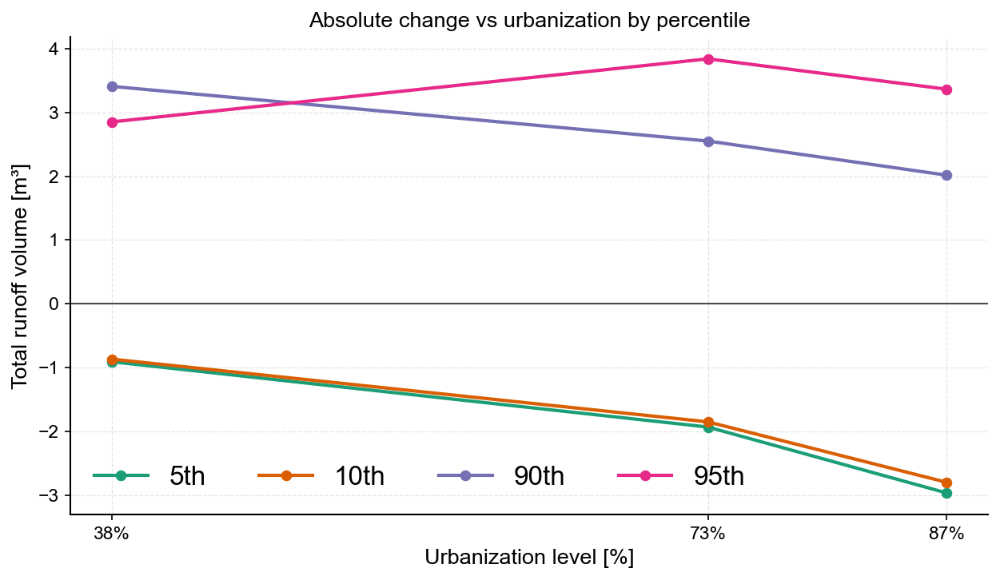

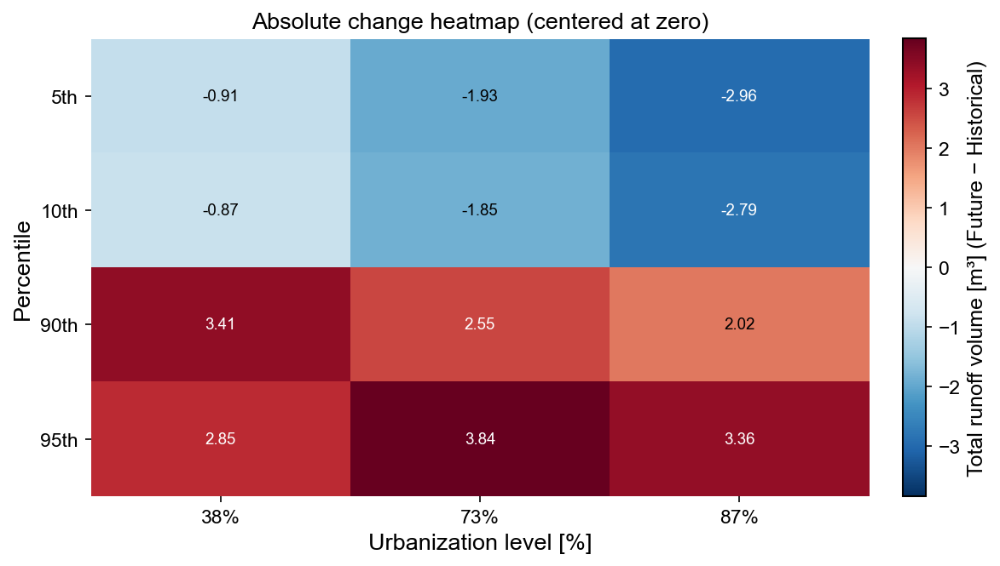

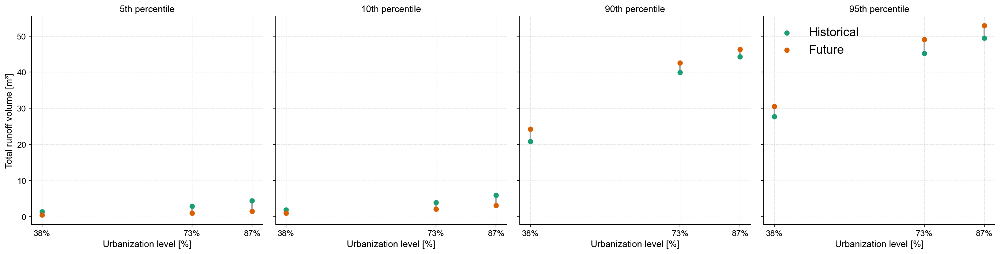

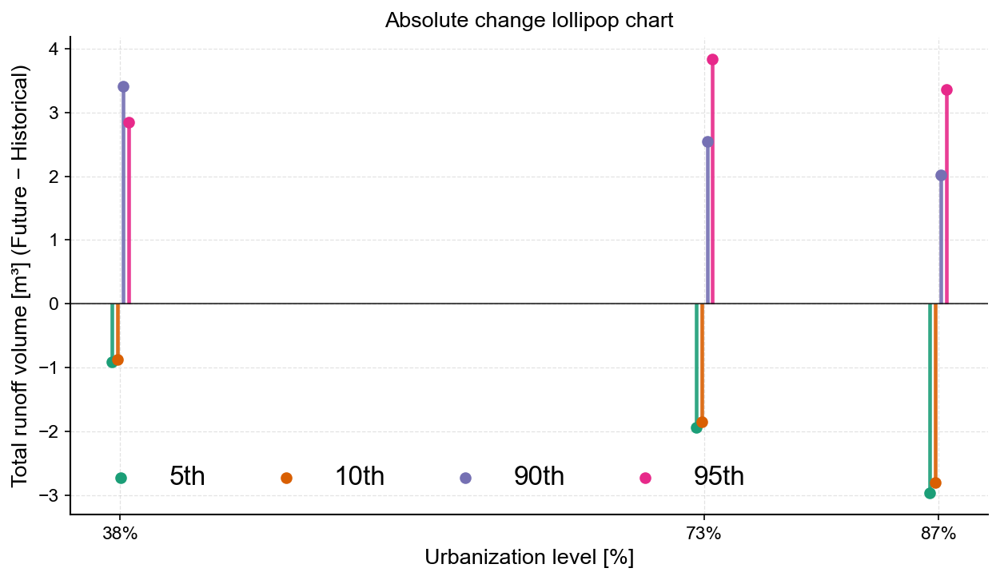

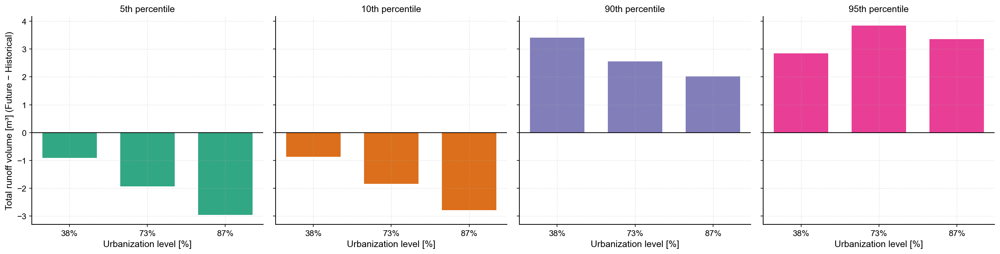

In [30]:
# ================= Nature-ready multi-figure set for absolute changes =================
# Input structure:
# percentile_results = {
#     "38% urbanization": {"historical": {25: val, 50: val, 75: val}, "future": {25: val, 50: val, 75: val}},
#     "73% urbanization": {...},
#     "87% urbanization": {...},
# }
# input_percentiles = [25, 50, 75]
#
# Call:
# figs = plot_urbanization_change_gallery(percentile_results, input_percentiles,
#                                         y_label="Total runoff volume [m³]",
#                                         x_label="Urbanization level [%]")

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

# ----------------------------- helpers -----------------------------
def _order_scenarios(scenarios):
    try:
        return sorted(scenarios, key=lambda s: float(str(s).split("%")[0]))
    except Exception:
        return list(scenarios)

def _as_numeric_levels(sorted_scenarios):
    xs = []
    labels = []
    for s in sorted_scenarios:
        try:
            xs.append(float(str(s).split("%")[0]))
            labels.append(f"{float(str(s).split('%')[0]):.0f}%")
        except Exception:
            xs.append(np.nan)
            labels.append(str(s))
    return np.array(xs), labels

def _compute_delta_matrix(percentile_results, percentiles, sorted_scenarios):
    # returns matrix shape: (n_scenarios, n_percentiles)
    m = np.empty((len(sorted_scenarios), len(percentiles)), float)
    for i, sc in enumerate(sorted_scenarios):
        for j, p in enumerate(percentiles):
            fut = percentile_results[sc]["future"][p]
            hist = percentile_results[sc]["historical"][p]
            m[i, j] = fut - hist
    return m

def _palette(n):
    # colorblind friendly palette
    base = ["#1b9e77", "#d95f02", "#7570b3", "#e7298a", "#66a61e",
            "#e6ab02", "#a6761d", "#666666", "#1f78b4", "#b2df8a"]
    if n <= len(base):
        return base[:n]
    # repeat softly if more needed
    reps = int(np.ceil(n / len(base)))
    return (base * reps)[:n]

def _style_nature(ax):
    ax.grid(True, which="major", ls="--", lw=0.6, alpha=0.35)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

# ----------------------------- figure 1: Lines over urbanization (per percentile) -----------------------------
def fig_lines_delta(percentile_results, percentiles, y_label, x_label):
    scenarios = _order_scenarios(percentile_results.keys())
    xs, xlabels = _as_numeric_levels(scenarios)
    M = _compute_delta_matrix(percentile_results, percentiles, scenarios)

    fig, ax = plt.subplots(figsize=(8.5, 5.0), dpi=150)
    cols = _palette(len(percentiles))
    for j, p in enumerate(percentiles):
        ax.plot(xs, M[:, j], marker="o", lw=2.0, ms=5.5, color=cols[j], label=f"{p}th")
    ax.axhline(0, color="k", lw=1.0, alpha=0.7)
    ax.set_xlabel(x_label, fontsize=13)
    ax.set_ylabel(y_label, fontsize=13)
    ax.set_xticks(xs)
    ax.set_xticklabels(xlabels)
    _style_nature(ax)
    ax.legend(frameon=False, ncol=min(4, len(percentiles)))
    ax.set_title("Absolute change vs urbanization by percentile", fontsize=13)
    plt.tight_layout()
    return fig

# ----------------------------- figure 2: Heatmap with centered zero -----------------------------
def fig_heatmap_delta(percentile_results, percentiles, y_label, x_label):
    scenarios = _order_scenarios(percentile_results.keys())
    xs, xlabels = _as_numeric_levels(scenarios)
    M = _compute_delta_matrix(percentile_results, percentiles, scenarios)

    vabs = np.nanmax(np.abs(M)) if np.isfinite(M).any() else 1.0
    norm = TwoSlopeNorm(vmin=-vabs, vcenter=0.0, vmax=vabs)

    fig, ax = plt.subplots(figsize=(8.0, 4.6), dpi=150)
    im = ax.imshow(M.T, aspect="auto", cmap="RdBu_r", norm=norm, interpolation="nearest")

    # axes labels (תואם לגרסאות ישנות)
    ax.set_xticks(np.arange(len(scenarios)))
    ax.set_xticklabels(xlabels)
    ax.set_yticks(np.arange(len(percentiles)))
    ax.set_yticklabels([f"{p}th" for p in percentiles])

    ax.set_xlabel(x_label, fontsize=13)
    ax.set_ylabel("Percentile", fontsize=13)
    for spine in ax.spines.values():
        spine.set_visible(False)

    # annotations
    for i in range(M.shape[0]):
        for j in range(M.shape[1]):
            val = M[i, j]
            ax.text(i, j, f"{val:.2f}", ha="center", va="center",
                    color="black" if abs(val) < 0.6*vabs else "white", fontsize=9)

    cbar = fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(y_label + " (Future − Historical)", fontsize=12)

    ax.set_title("Absolute change heatmap (centered at zero)", fontsize=13)
    plt.tight_layout()
    return fig


# ----------------------------- figure 3: Dumbbell small multiples (per percentile) -----------------------------
def fig_dumbbell_small_multiples(percentile_results, percentiles, y_label, x_label):
    scenarios = _order_scenarios(percentile_results.keys())
    xs, xlabels = _as_numeric_levels(scenarios)
    nP = len(percentiles)
    cols = _palette(2)  # one for hist, one for future

    fig, axes = plt.subplots(1, nP, figsize=(4.6*nP, 4.8), dpi=150, sharey=True)
    if nP == 1:
        axes = [axes]

    for k, p in enumerate(percentiles):
        ax = axes[k]
        hist = np.array([percentile_results[s]["historical"][p] for s in scenarios], float)
        fut  = np.array([percentile_results[s]["future"][p]     for s in scenarios], float)
        # sort by urbanization already handled
        for i, x in enumerate(xs):
            y0, y1 = hist[i], fut[i]
            ax.plot([x, x], [y0, y1], color="#999999", lw=2.0, alpha=0.8)  # connector
            ax.scatter([x], [y0], s=35, color=cols[0], zorder=3, label="Historical" if i == 0 else None)
            ax.scatter([x], [y1], s=35, color=cols[1], zorder=3, label="Future" if i == 0 else None)
        ax.set_title(f"{p}th percentile", fontsize=12)
        ax.set_xlabel(x_label, fontsize=12)
        ax.set_xticks(xs); ax.set_xticklabels(xlabels, rotation=0)
        _style_nature(ax)
        if k == 0:
            ax.set_ylabel(y_label, fontsize=12)
        if k == nP - 1:
            ax.legend(frameon=False, loc="best")
    plt.tight_layout()
    return fig

# ----------------------------- figure 4: Lollipop deltas per scenario -----------------------------
def fig_lollipop_delta(percentile_results, percentiles, y_label, x_label):
    scenarios = _order_scenarios(percentile_results.keys())
    xs, xlabels = _as_numeric_levels(scenarios)
    M = _compute_delta_matrix(percentile_results, percentiles, scenarios)

    fig, ax = plt.subplots(figsize=(8.5, 5.0), dpi=150)
    cols = _palette(len(percentiles))
    width = (xs.max() - xs.min()) * 0.01 if np.isfinite(xs).all() else 0.3
    offsets = np.linspace(-width, width, len(percentiles))

    for j, p in enumerate(percentiles):
        xj = xs + offsets[j]
        ax.vlines(xj, 0, M[:, j], color=cols[j], lw=2.2, alpha=0.9)
        ax.scatter(xj, M[:, j], s=36, color=cols[j], label=f"{p}th", zorder=3)
    ax.axhline(0, color="k", lw=1.0, alpha=0.7)
    ax.set_xlabel(x_label, fontsize=13)
    ax.set_ylabel(y_label + " (Future − Historical)", fontsize=13)
    ax.set_xticks(xs); ax.set_xticklabels(xlabels)
    _style_nature(ax)
    ax.legend(frameon=False, ncol=min(4, len(percentiles)))
    ax.set_title("Absolute change lollipop chart", fontsize=13)
    plt.tight_layout()
    return fig

# ----------------------------- figure 5: Faceted bars by percentile -----------------------------
def fig_faceted_bars(percentile_results, percentiles, y_label, x_label):
    scenarios = _order_scenarios(percentile_results.keys())
    xs, xlabels = _as_numeric_levels(scenarios)
    M = _compute_delta_matrix(percentile_results, percentiles, scenarios)

    nP = len(percentiles)
    fig, axes = plt.subplots(1, nP, figsize=(4.6*nP, 4.8), dpi=150, sharey=True)
    if nP == 1:
        axes = [axes]
    cols = _palette(nP)

    for k, p in enumerate(percentiles):
        ax = axes[k]
        vals = M[:, k]
        barw = 0.7 if len(xs) <= 6 else 0.6
        ax.bar(np.arange(len(xs)), vals, color=cols[k], width=barw, alpha=0.9, edgecolor="none")
        ax.axhline(0, color="k", lw=1.0)
        ax.set_xticks(np.arange(len(xs))); ax.set_xticklabels(xlabels, rotation=0)
        if k == 0:
            ax.set_ylabel(y_label + " (Future − Historical)", fontsize=12)
        ax.set_xlabel(x_label, fontsize=12)
        ax.set_title(f"{p}th percentile", fontsize=12)
        _style_nature(ax)
    plt.tight_layout()
    return fig

# ----------------------------- master function: produce all five -----------------------------
def plot_urbanization_change_gallery(percentile_results, percentiles, y_label,
                                     x_label="Urbanization level [%]"):
    figs = []
    figs.append(fig_lines_delta(percentile_results, percentiles, y_label, x_label))
    figs.append(fig_heatmap_delta(percentile_results, percentiles, y_label, x_label))
    figs.append(fig_dumbbell_small_multiples(percentile_results, percentiles, y_label, x_label))
    figs.append(fig_lollipop_delta(percentile_results, percentiles, y_label, x_label))
    figs.append(fig_faceted_bars(percentile_results, percentiles, y_label, x_label))
    return figs

# ================= Example call =================
figs = plot_urbanization_change_gallery(percentile_results, input_percentiles,
                                        y_label="Total runoff volume [m³]",
                                        x_label="Urbanization level [%]")
for f in figs: plt.show()


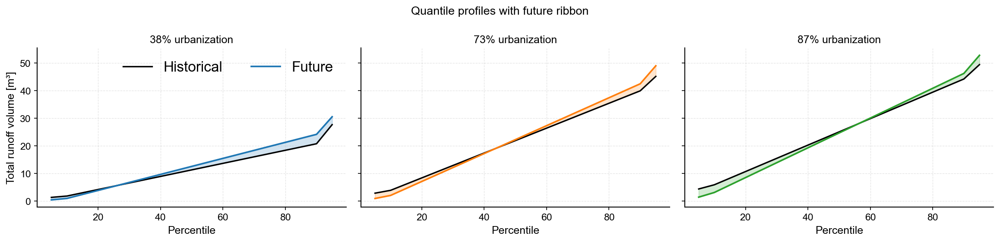

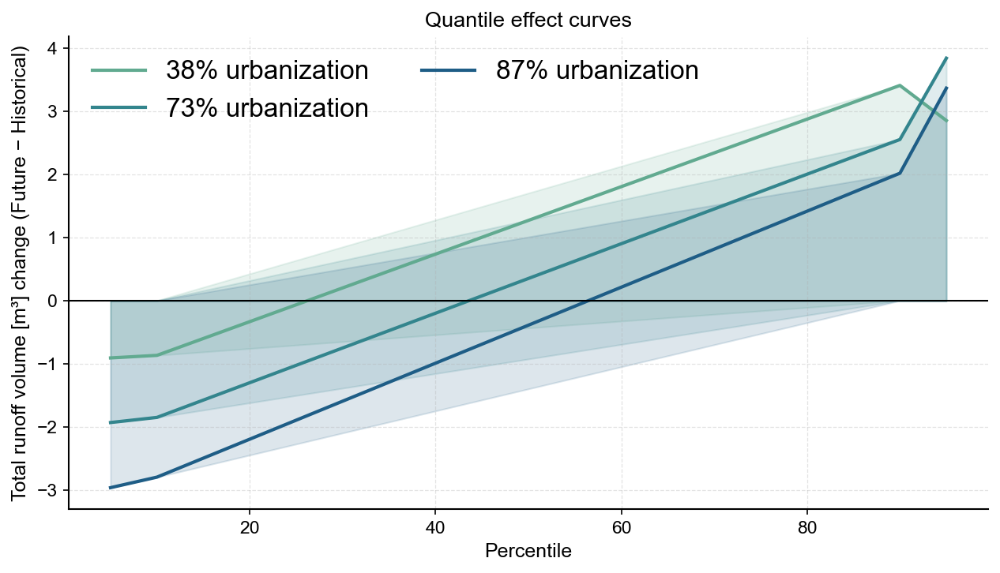

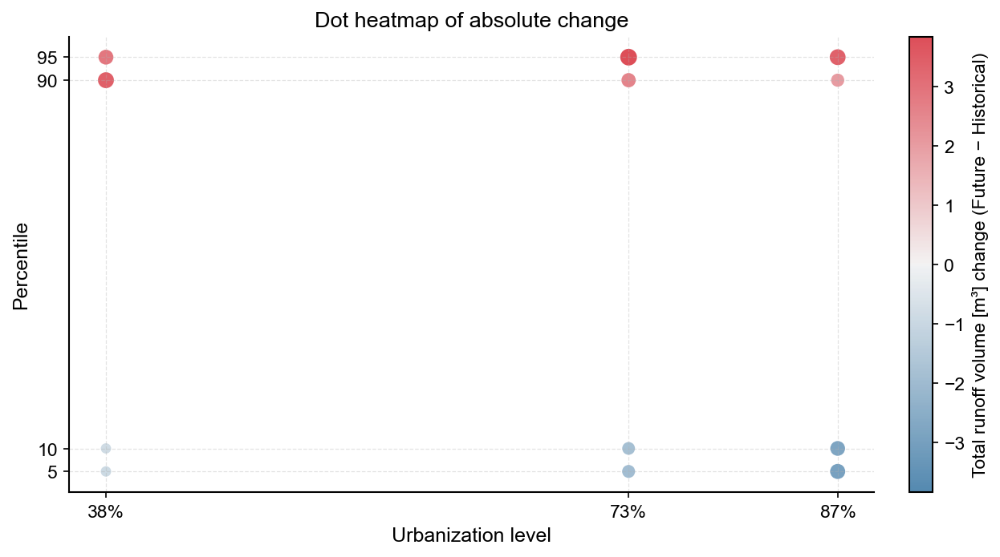

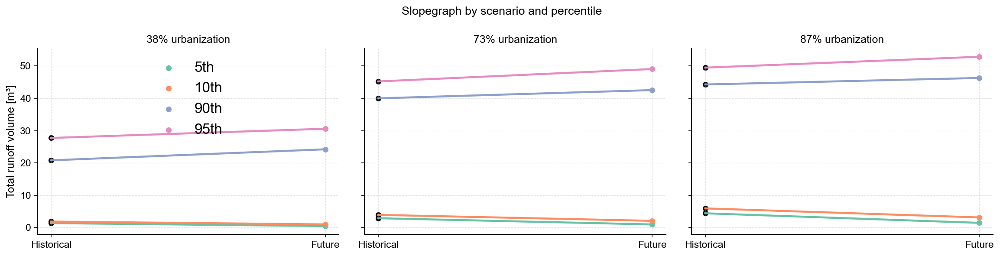

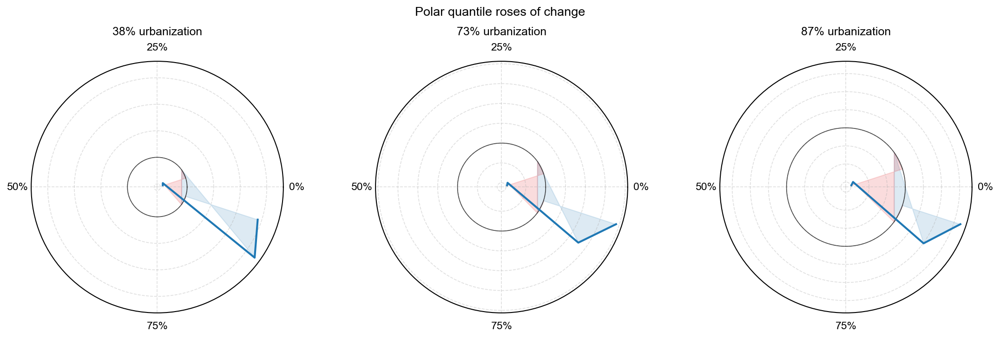

In [31]:
# ================= More Nature-ready figures for percentile deltas =================
# Input structure:
# percentile_results = {
#   "38% urbanization": {"historical": {25: val, 50: val, 75: val}, "future": {25: val, 50: val, 75: val}},
#   "73% urbanization": {...}, "87% urbanization": {...},
# }
# input_percentiles = [25, 50, 75]

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# ---------- helpers ----------
def tidy_percentile_results(percentile_results, percentiles):
    """Return long-form DataFrame for plotting."""
    rows = []
    for scen, d in percentile_results.items():
        try:
            urb = float(str(scen).split("%")[0])
        except Exception:
            urb = np.nan
        for p in percentiles:
            hist = float(d["historical"][p])
            fut  = float(d["future"][p])
            delta = fut - hist
            pct_change = np.nan if hist == 0 else 100.0 * delta / hist
            rows.append({"scenario": scen, "urbanization": urb, "percentile": p,
                         "historical": hist, "future": fut,
                         "delta": delta, "pct_change": pct_change})
    df = pd.DataFrame(rows)
    df = df.sort_values(["urbanization", "percentile"]).reset_index(drop=True)
    return df

def _style(ax):
    ax.grid(True, ls="--", lw=0.6, alpha=0.35)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

# ---------- Figure A: Quantile profiles with delta ribbon ----------
def fig_quantile_profiles(percentile_results, percentiles, y_label, palette="tab10"):
    """
    לכל תרחיש מציירים פרופיל אחוזוני לאורך ציר האחוזונים
    קווים להיסטורי ולעתידי ורצועת הפרש עדינה ביניהם
    """
    df = tidy_percentile_results(percentile_results, percentiles)
    scenarios = df["scenario"].unique().tolist()
    n = len(scenarios)
    cols = sns.color_palette(palette, n)

    ncols = min(3, n)
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5.2*ncols, 3.8*nrows), dpi=150, sharey=True)
    axes = np.array(axes).reshape(nrows, ncols)

    for i, scen in enumerate(scenarios):
        ax = axes[i//ncols, i%ncols]
        d = df[df["scenario"] == scen]
        p = d["percentile"].values
        h = d["historical"].values
        f = d["future"].values
        ax.fill_between(p, h, f, color=cols[i], alpha=0.20)
        ax.plot(p, h, color="black", lw=1.6, label="Historical")
        ax.plot(p, f, color=cols[i], lw=1.8, label="Future")
        ax.set_title(scen, fontsize=12)
        ax.set_xlabel("Percentile")
        if i % ncols == 0:
            ax.set_ylabel(y_label)
        _style(ax)
        if i == 0:
            ax.legend(frameon=False, ncol=2, loc="best")
    # clean empty axes
    for j in range(i+1, nrows*ncols):
        axes[j//ncols, j%ncols].axis("off")

    fig.suptitle("Quantile profiles with future ribbon", fontsize=13)
    fig.tight_layout()
    return fig

# ---------- Figure B: Quantile effect curves (delta vs percentile) ----------
def fig_quantile_effects(percentile_results, percentiles, y_label, palette="crest"):
    """
    מצייר עבור כל תרחיש את השינוי כפונקציה של האחוזון
    מסמן אזורים חיוביים ושליליים סביב אפס
    """
    df = tidy_percentile_results(percentile_results, percentiles)
    fig, ax = plt.subplots(figsize=(8.6, 5.0), dpi=150)
    pal = sns.color_palette(palette, as_cmap=False, n_colors=df["scenario"].nunique())

    for (scen, d), c in zip(df.groupby("scenario"), pal):
        x = d["percentile"].values
        y = d["delta"].values
        ax.plot(x, y, lw=2.0, color=c, label=scen)
        ax.fill_between(x, np.minimum(y, 0), 0, color=c, alpha=0.15)
        ax.fill_between(x, 0, np.maximum(y, 0), color=c, alpha=0.15)

    ax.axhline(0, color="k", lw=1.0)
    ax.set_xlabel("Percentile")
    ax.set_ylabel(y_label + " change (Future − Historical)")
    _style(ax)
    ax.legend(frameon=False, ncol=2)
    ax.set_title("Quantile effect curves", fontsize=13)
    fig.tight_layout()
    return fig

# ---------- Figure C: Dot heatmap of delta with size and color ----------
def fig_dot_heatmap(percentile_results, percentiles, y_label):
    """
    נקודות במקום תאים קבועים
    הצבע לפי סימן וגודל השינוי והגודל לפי גודל מוחלט
    """
    df = tidy_percentile_results(percentile_results, percentiles)
    df["abs_delta"] = df["delta"].abs()

    fig, ax = plt.subplots(figsize=(8.5, 4.8), dpi=150)
    norm_abs = df["abs_delta"].max() if df["abs_delta"].max() > 0 else 1.0
    sizes = 100 * (0.2 + 0.8 * df["abs_delta"]/norm_abs)

    # center zero colormap
    v = df["delta"].values
    vmax = np.nanmax(np.abs(v)) if np.isfinite(v).any() else 1.0
    cmap = sns.diverging_palette(240, 10, as_cmap=True)
    sc = ax.scatter(
        x=df["urbanization"], y=df["percentile"],
        c=df["delta"], s=sizes, cmap=cmap, vmin=-vmax, vmax=vmax, edgecolor="none", alpha=0.9
    )

    # axes
    xs = sorted(df["urbanization"].unique())
    ax.set_xticks(xs)
    ax.set_xticklabels([f"{int(x)}%" if np.isfinite(x) else "" for x in xs])
    ax.set_yticks(sorted(percentiles))
    ax.set_xlabel("Urbanization level")
    ax.set_ylabel("Percentile")
    _style(ax)
    cb = plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
    cb.set_label(y_label + " change (Future − Historical)", fontsize=11)
    ax.set_title("Dot heatmap of absolute change", fontsize=13)
    fig.tight_layout()
    return fig

# ---------- Figure D: Slopegraph per scenario pairing historical and future ----------
def fig_slopegraph(percentile_results, percentiles, y_label):
    """
    שני עמודים זמן סכימתי היסטורי מול עתידי
    לכל תרחיש ולכל אחוזון קו אחד עם צבע לפי אחוזון
    """
    df = tidy_percentile_results(percentile_results, percentiles)
    scenarios = df["scenario"].unique().tolist()
    P = sorted(percentiles)
    pal = sns.color_palette("Set2", n_colors=len(P))

    ncols = min(3, len(scenarios))
    nrows = int(np.ceil(len(scenarios) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5.2*ncols, 4.0*nrows), dpi=150, sharey=True)
    axes = np.array(axes).reshape(nrows, ncols)

    for i, scen in enumerate(scenarios):
        ax = axes[i//ncols, i%ncols]
        d = df[df["scenario"] == scen]
        for j, p in enumerate(P):
            row = d[d["percentile"] == p].iloc[0]
            ax.plot([0, 1], [row["historical"], row["future"]], color=pal[j], lw=2.2)
            ax.scatter([0], [row["historical"]], color="black", s=28)
            ax.scatter([1], [row["future"]], color=pal[j], s=28, label=f"{p}th" if i == 0 else None)
        ax.set_xticks([0, 1]); ax.set_xticklabels(["Historical", "Future"])
        ax.set_title(scen, fontsize=12)
        _style(ax)
        if i % ncols == 0:
            ax.set_ylabel(y_label)
    # legend once
    axes[0, 0].legend(frameon=False, loc="best")
    for j in range(i+1, nrows*ncols):
        axes[j//ncols, j%ncols].axis("off")

    fig.suptitle("Slopegraph by scenario and percentile", fontsize=13)
    fig.tight_layout()
    return fig

# ---------- Figure E: Polar quantile roses of delta ----------
def fig_polar_quantile_roses(percentile_results, percentiles, y_label):
    """
    ייצוג רדיאלי שבו הזווית היא האחוזון והרדיוס הוא שינוי
    נותן מבט אינטואיטיבי על סימטריה של השינוי לאורך הטווח
    """
    df = tidy_percentile_results(percentile_results, percentiles)
    scenarios = df["scenario"].unique().tolist()
    n = len(scenarios)
    ncols = min(3, n)
    nrows = int(np.ceil(n / ncols))
    fig = plt.figure(figsize=(5.0*ncols, 4.8*nrows), dpi=150)

    for i, scen in enumerate(scenarios):
        ax = fig.add_subplot(nrows, ncols, i+1, projection="polar")
        d = df[df["scenario"] == scen].sort_values("percentile")
        theta = 2*np.pi*(d["percentile"].values/100.0)
        r = d["delta"].values
        # baseline zero circle
        ax.plot(np.linspace(0, 2*np.pi, 361), np.zeros(361), color="k", lw=0.8, alpha=0.7)
        # positive and negative fill
        ax.plot(theta, r, lw=2.0, color="#1f78b4")
        ax.fill_between(theta, 0, np.maximum(r, 0), color="#1f78b4", alpha=0.15)
        ax.fill_between(theta, 0, np.minimum(r, 0), color="#e31a1c", alpha=0.15)
        # ticks
        ax.set_xticks(np.deg2rad([0, 90, 180, 270]))
        ax.set_xticklabels(["0%", "25%", "50%", "75%"])
        ax.set_yticklabels([])
        ax.set_title(scen, va="bottom", fontsize=12)
        ax.grid(True, ls="--", alpha=0.4)

    fig.suptitle("Polar quantile roses of change", fontsize=13)
    fig.tight_layout()
    return fig

# ---------- master function ----------
def plot_urbanization_change_gallery_extra(percentile_results, percentiles, y_label):
    figs = []
    figs.append(fig_quantile_profiles(percentile_results, percentiles, y_label))
    figs.append(fig_quantile_effects(percentile_results, percentiles, y_label))
    figs.append(fig_dot_heatmap(percentile_results, percentiles, y_label))
    figs.append(fig_slopegraph(percentile_results, percentiles, y_label))
    figs.append(fig_polar_quantile_roses(percentile_results, percentiles, y_label))
    return figs

# ================= Example call =================
figs2 = plot_urbanization_change_gallery_extra(percentile_results, input_percentiles,
                                               y_label="Total runoff volume [m³]")
for f in figs2: plt.show()


C:\Users\raznu\AppData\Local\Temp\ipykernel_26924\3760627118.py:120: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  fig.tight_layout()


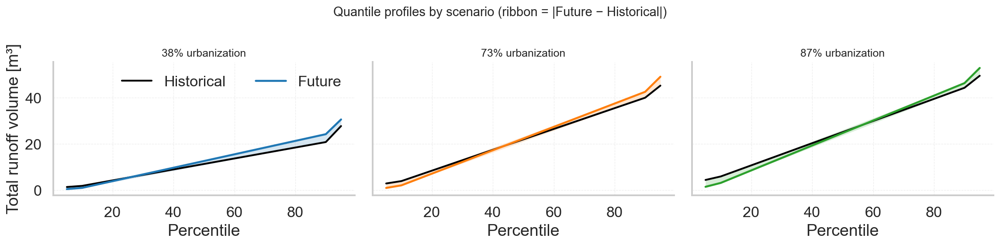

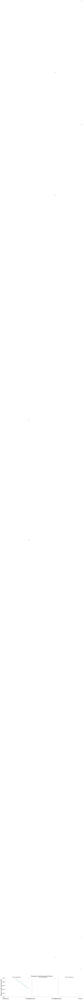

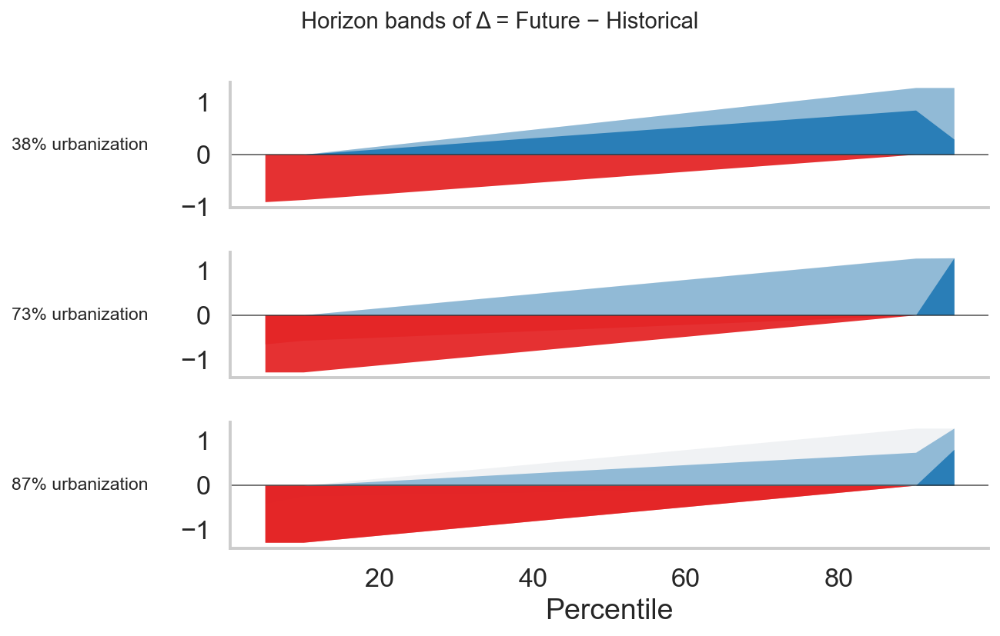

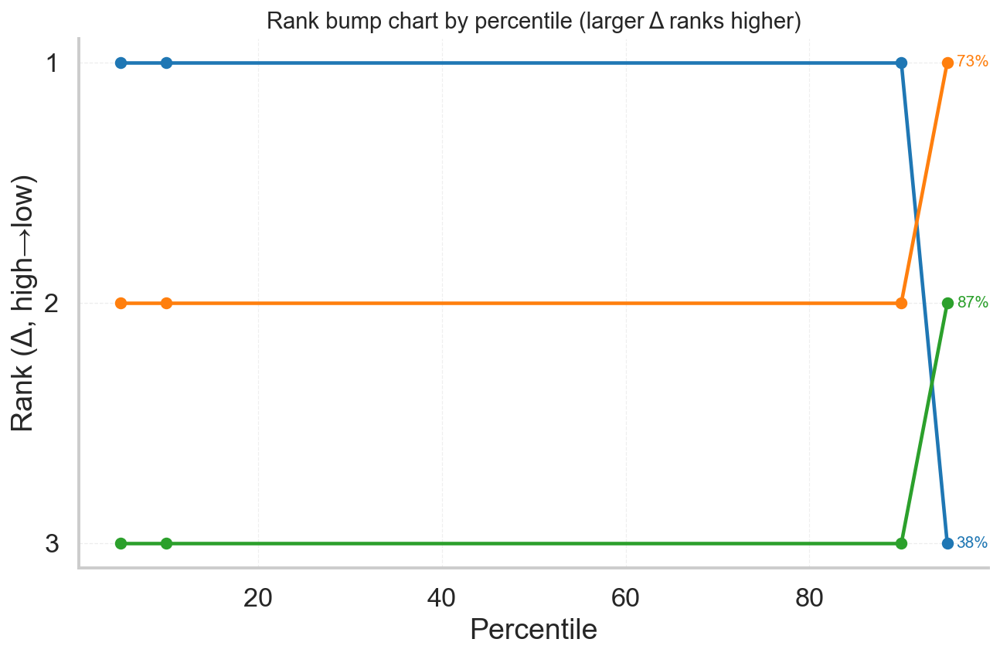

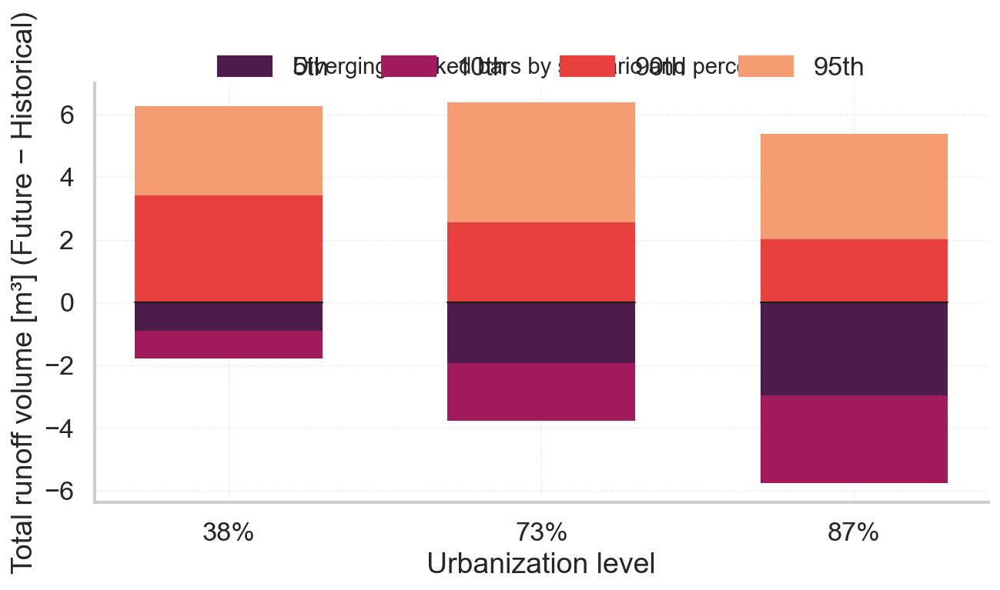

In [32]:
# ================= Nature-grade gallery v2 =================
# Inputs:
# percentile_results = {
#   "38% urbanization": {"historical": {25: v, 50: v, 75: v}, "future": {25: v, 50: v, 75: v}},
#   "73% urbanization": {...}, "87% urbanization": {...},
# }
# input_percentiles = [25, 50, 75]

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import FancyArrowPatch
from matplotlib.collections import LineCollection

# ---------- house style ----------
sns.set_theme(context="talk", style="whitegrid")
sns.set_palette("colorblind")

def _tidy(percentile_results, percentiles):
    rows = []
    for scen, d in percentile_results.items():
        try:
            urb = float(str(scen).split("%")[0])
        except Exception:
            urb = np.nan
        for p in percentiles:
            h = float(d["historical"][p])
            f = float(d["future"][p])
            delta = f - h
            pct = np.nan if h == 0 else 100*delta/h
            rows.append(dict(scenario=scen, urbanization=urb,
                             percentile=p, historical=h, future=f,
                             delta=delta, pct_change=pct))
    df = pd.DataFrame(rows).sort_values(["urbanization","percentile"]).reset_index(drop=True)
    # סדר תרחישים לפי אחוז עיור
    scen_order = df.drop_duplicates("scenario").sort_values("urbanization")["scenario"].tolist()
    df["scenario"] = pd.Categorical(df["scenario"], categories=scen_order, ordered=True)
    return df

def _beautify(ax):
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.grid(True, ls="--", lw=0.6, alpha=0.35)

# ==========================================================
# Figure 1 — Ribbon small-multiples: Future vs Historical profiles + delta tint
# ==========================================================
def fig_ribbon_profiles(percentile_results, percentiles, y_label):
    df = _tidy(percentile_results, percentiles)
    scenarios = df["scenario"].cat.categories.tolist()
    n = len(scenarios)
    ncols = min(3, n)
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5.2*ncols, 3.9*nrows), dpi=150, sharey=True)
    axes = np.array(axes).reshape(nrows, ncols)

    palette = sns.color_palette("tab10", n)
    for i, scen in enumerate(scenarios):
        ax = axes[i//ncols, i%ncols]
        d = df[df["scenario"] == scen].sort_values("percentile")
        x = d["percentile"].to_numpy()
        h = d["historical"].to_numpy()
        f = d["future"].to_numpy()
        ax.fill_between(x, np.minimum(h,f), np.maximum(h,f),
                        color=palette[i], alpha=0.18, lw=0)
        ax.plot(x, h, color="black", lw=2, label="Historical")
        ax.plot(x, f, color=palette[i], lw=2.2, label="Future")
        ax.set_title(scen, fontsize=12)
        ax.set_xlabel("Percentile")
        if i % ncols == 0:
            ax.set_ylabel(y_label)
        _beautify(ax)
        if i == 0:
            ax.legend(frameon=False, ncol=2, loc="best")
    # כיבוי צירים ריקים
    for j in range(i+1, nrows*ncols):
        axes[j//ncols, j%ncols].axis("off")

    fig.suptitle("Quantile profiles by scenario (ribbon = |Future − Historical|)", fontsize=14)
    fig.tight_layout()
    return fig

# ==========================================================
# Figure 2 — Diverging slopegraph with arrows and direct labels
# ==========================================================
def fig_slope_direct(percentile_results, percentiles, y_label):
    df = _tidy(percentile_results, percentiles)
    pal = sns.color_palette("Set2", n_colors=len(percentiles))
    scenarios = df["scenario"].cat.categories.tolist()
    n = len(scenarios)
    ncols = min(3, n)
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5.0*ncols, 3.8*nrows), dpi=150, sharey=True)
    axes = np.array(axes).reshape(nrows, ncols)

    for i, scen in enumerate(scenarios):
        ax = axes[i//ncols, i%ncols]
        d = df[df["scenario"] == scen]
        for j, p in enumerate(sorted(percentiles)):
            row = d[d["percentile"] == p].iloc[0]
            # חץ היסטורי -> עתידי
            arrow = FancyArrowPatch((0, row["historical"]), (1, row["future"]),
                                    arrowstyle="-|>", mutation_scale=12,
                                    lw=2.2, color=pal[j], alpha=0.95)
            ax.add_patch(arrow)
            # תיוג ישיר באגף ימין
            ax.text(1.02, row["future"], f"{p}th", va="center",
                    fontsize=10, color=pal[j])
        ax.set_xticks([0, 1]); ax.set_xticklabels(["Historical", "Future"])
        ax.set_title(scen, fontsize=12)
        _beautify(ax)
        if i % ncols == 0:
            ax.set_ylabel(y_label)
    # כיבוי צירים ריקים
    for j in range(i+1, nrows*ncols):
        axes[j//ncols, j%ncols].axis("off")

    fig.suptitle("Slopegraph with direct percentile labels", fontsize=14)
    fig.tight_layout()
    return fig

# ==========================================================
# Figure 3 — Horizon-style bands of delta across percentiles
# ==========================================================
def fig_horizon_bands(percentile_results, percentiles, y_label):
    """
    Horizon plot סכימטי: מחלק את Δ לרמות וחושף סימן בעוצמות צבע.
    נותן קריאות גבוהה לשינויים עדינים לאורך האחוזונים.
    """
    df = _tidy(percentile_results, percentiles)
    scenarios = df["scenario"].cat.categories.tolist()

    # מדרגות רמות
    pivot = df.pivot_table(index="percentile", columns="scenario", values="delta")
    vmax = np.nanmax(np.abs(pivot.values)) if np.isfinite(pivot.values).any() else 1.0
    levels = np.linspace(0, vmax, 4)[1:]  # 3 רמות חיובי, 3 רמות שלילי סימטרי

    fig, axes = plt.subplots(len(scenarios), 1, figsize=(9, 1.9*len(scenarios)), dpi=150, sharex=True)
    if len(scenarios) == 1:
        axes = [axes]

    pos_cmap = sns.light_palette("#1f78b4", n_colors=len(levels), reverse=False)
    neg_cmap = sns.light_palette("#e31a1c", n_colors=len(levels), reverse=False)

    x = pivot.index.to_numpy()
    for i, scen in enumerate(scenarios):
        ax = axes[i]
        y = pivot[scen].to_numpy()
        base = np.zeros_like(y)
        # שלילי
        for li, L in enumerate(levels[::-1], 1):
            band = np.clip(-y, 0, L) - np.clip(-y, 0, L - (levels[1]-levels[0]))
            ax.fill_between(x, -band, base, color=neg_cmap[li-1], alpha=0.9, lw=0)
        # חיובי
        for li, L in enumerate(levels, 1):
            band = np.clip(y, 0, L) - np.clip(y, 0, L - (levels[1]-levels[0]))
            ax.fill_between(x, base, band, color=pos_cmap[li-1], alpha=0.9, lw=0)

        ax.axhline(0, color="k", lw=0.8, alpha=0.7)
        ax.set_ylabel(scen, rotation=0, ha="right", va="center", labelpad=20, fontsize=11)
        _beautify(ax)
        ax.grid(False)  # הופכים נקי יותר לתצוגת horizon

    axes[-1].set_xlabel("Percentile")
    fig.suptitle("Horizon bands of Δ = Future − Historical", fontsize=14)
    fig.tight_layout()
    return fig

# ==========================================================
# Figure 4 — Rank-bump chart: ranking scenarios by delta at each percentile
# ==========================================================
def fig_rank_bump(percentile_results, percentiles):
    """
    מדרג את התרחישים לפי גודל שינוי בכל אחוזון ומצייר Bump chart.
    עוזר לראות מי ״מוביל״ בשינוי לאורך האחוזונים.
    """
    df = _tidy(percentile_results, percentiles)
    ranks = (df.groupby("percentile", group_keys=False)
               .apply(lambda g: g.assign(rank=g["delta"].rank(ascending=False, method="min"))))
    # הופכים שמות ידידותיים
    ranks["label"] = ranks["scenario"].astype(str).str.replace(" urbanization", "", regex=False)

    fig, ax = plt.subplots(figsize=(9, 6), dpi=150)
    scenarios = ranks["scenario"].cat.categories.tolist()
    colors = sns.color_palette("tab10", len(scenarios))
    col_map = {s:c for s, c in zip(scenarios, colors)}

    # מציירים קטעים בין אחוזונים
    lines = []
    cols = []
    for scen in scenarios:
        d = ranks[ranks["scenario"] == scen].sort_values("percentile")
        x = d["percentile"].to_numpy()
        y = d["rank"].to_numpy()
        segs = np.stack([np.column_stack([x[:-1], y[:-1]]),
                         np.column_stack([x[1:],  y[1:]])], axis=1)
        lines.append(segs)
        cols.append(col_map[scen])
        ax.scatter(x, y, s=35, color=col_map[scen], zorder=3)

        # תיוג ישיר בקצה ימין
        ax.text(x.max()+1, y[-1], str(d["label"].iloc[-1]), va="center",
                fontsize=10, color=col_map[scen])

    lc = LineCollection(np.concatenate(lines, axis=0), colors=np.repeat(colors, len(percentiles)-1, axis=0), lw=2.2)
    ax.add_collection(lc)
    ax.invert_yaxis()
    ax.set_yticks(range(1, len(scenarios)+1))
    ax.set_xlabel("Percentile")
    ax.set_ylabel("Rank (Δ, high→low)")
    _beautify(ax)
    ax.grid(axis="x", ls="--", alpha=0.3)
    ax.set_title("Rank bump chart by percentile (larger Δ ranks higher)", fontsize=14)
    fig.tight_layout()
    return fig

# ==========================================================
# Figure 5 — Diverging stacked bars with smart split of positive/negative parts
# ==========================================================
def fig_diverging_stack(percentile_results, percentiles, y_label):
    """
    מציג לכל תרחיש בר מפוצל סביב אפס, כאשר כל אחוזון הוא מקטע.
    חיובי נבנה ימינה, שלילי שמאלה, כך שלא מסתירים זה את זה.
    """
    df = _tidy(percentile_results, percentiles)
    scenarios = df["scenario"].cat.categories.tolist()
    P = sorted(percentiles)
    colors = sns.color_palette("rocket", n_colors=len(P))  # דגרדיינט עדין
    fig, ax = plt.subplots(figsize=(9, 5.2), dpi=150)

    x = np.arange(len(scenarios))
    width = 0.6

    for i, scen in enumerate(scenarios):
        d = df[df["scenario"] == scen].set_index("percentile").loc[P]
        pos_base = 0.0
        neg_base = 0.0
        for j, p in enumerate(P):
            dv = float(d.loc[p, "delta"])
            if dv >= 0:
                ax.bar(i, dv, bottom=pos_base, width=width, color=colors[j], edgecolor="none")
                pos_base += dv
            else:
                ax.bar(i, dv, bottom=neg_base, width=width, color=colors[j], edgecolor="none")
                neg_base += dv
        # קו אפס
        ax.plot([i - width/2, i + width/2], [0, 0], color="k", lw=1)

    ax.set_xticks(x)
    ax.set_xticklabels([str(s).replace(" urbanization","") for s in scenarios])
    ax.set_ylabel(y_label + " (Future − Historical)")
    ax.set_xlabel("Urbanization level")
    _beautify(ax)

    # מקרא ידני לפי אחוזון
    handles = [plt.Rectangle((0,0),1,1, color=colors[j]) for j in range(len(P))]
    ax.legend(handles, [f"{p}th" for p in P], frameon=False, ncol=len(P), loc="upper center", bbox_to_anchor=(0.5, 1.12))
    ax.set_title("Diverging stacked bars by scenario and percentile", fontsize=14)
    fig.tight_layout()
    return fig

# ==========================================================
# Master: produce all five
# ==========================================================
def plot_urbanization_change_gallery_v2(percentile_results, percentiles, y_label):
    figs = []
    figs.append(fig_ribbon_profiles(percentile_results, percentiles, y_label))
    figs.append(fig_slope_direct(percentile_results, percentiles, y_label))
    figs.append(fig_horizon_bands(percentile_results, percentiles, y_label))
    figs.append(fig_rank_bump(percentile_results, percentiles))
    figs.append(fig_diverging_stack(percentile_results, percentiles, y_label))
    return figs

# ================= Example =================
figs = plot_urbanization_change_gallery_v2(percentile_results, input_percentiles,
                                           y_label="Total runoff volume [m³]")
for f in figs: plt.show()


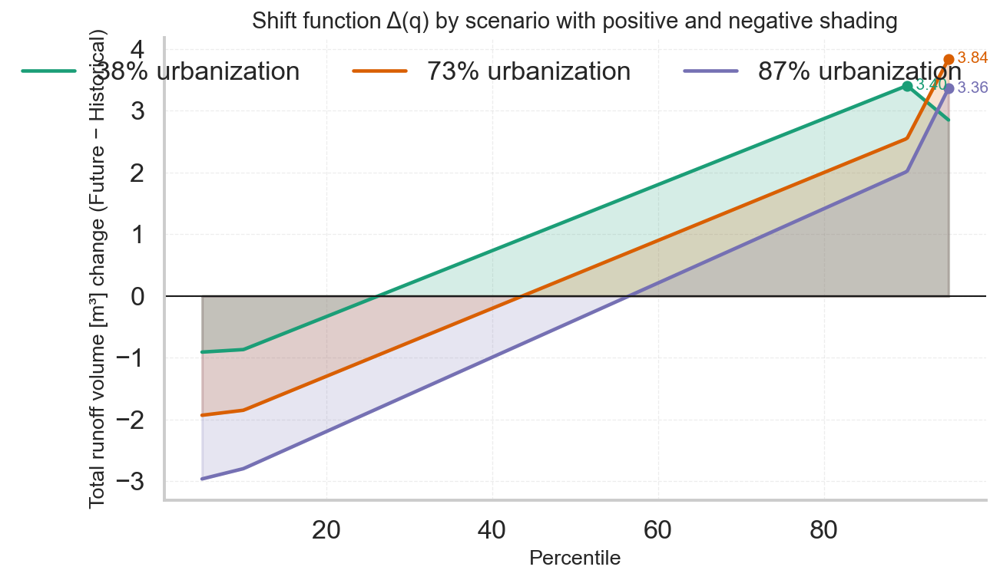

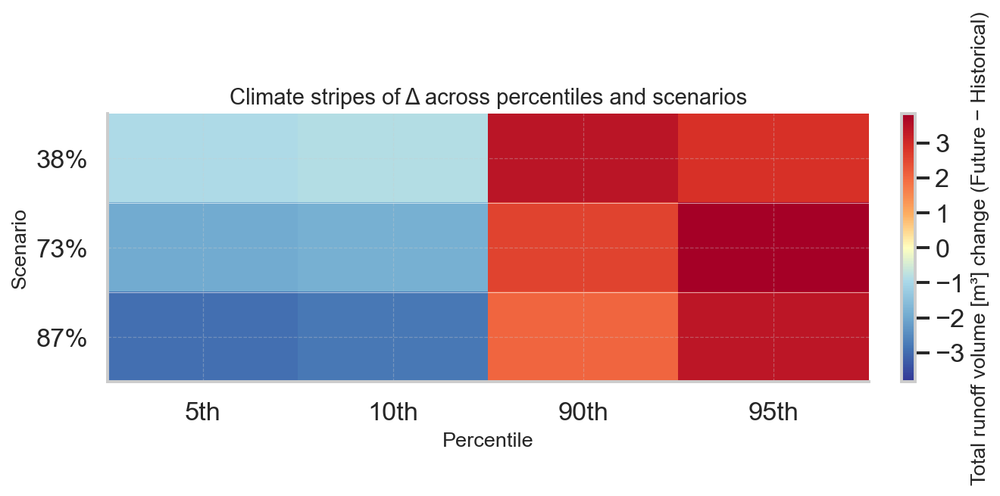

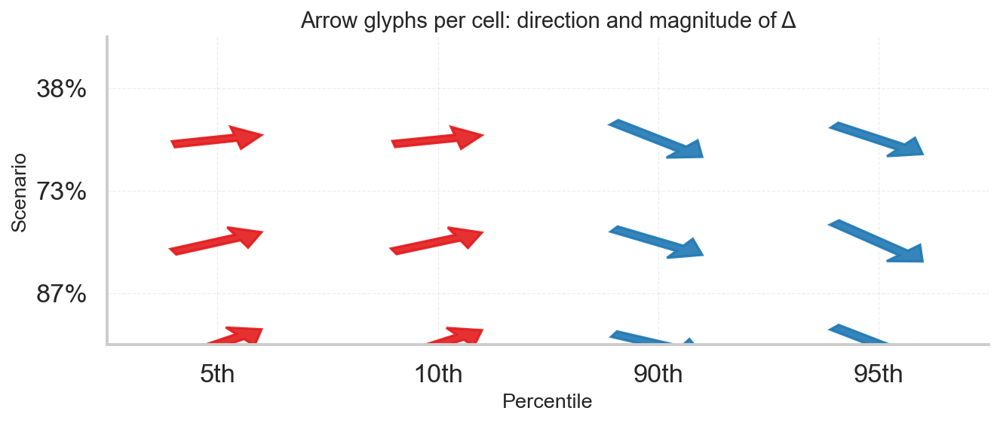

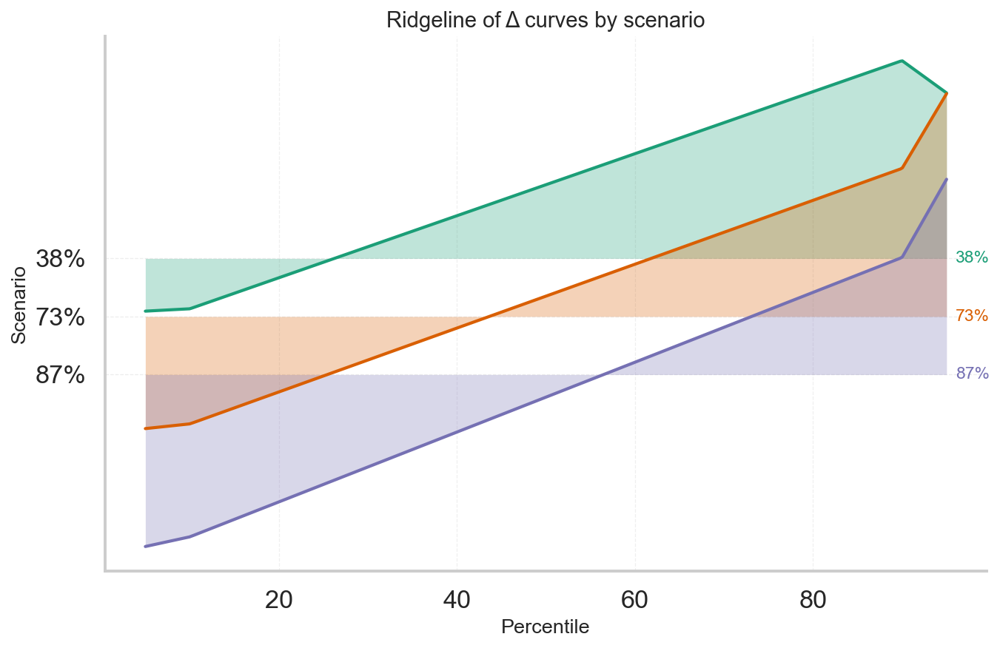

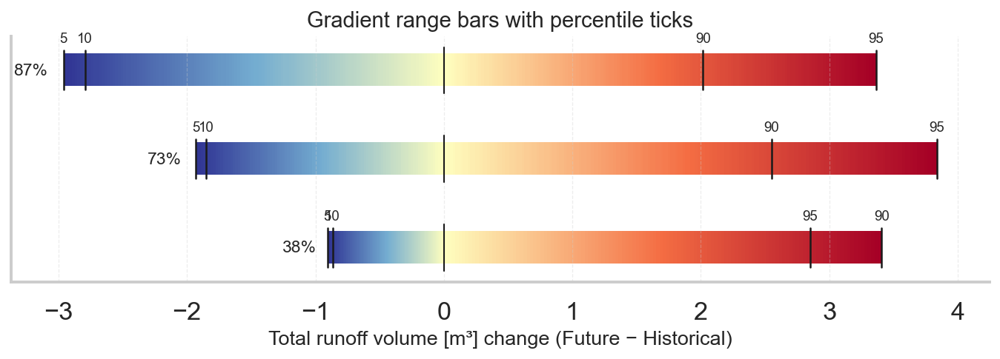

In [33]:
# ================= Nature-grade gallery v3 (pure matplotlib, no seaborn) =================
# Inputs:
# percentile_results = {
#   "38% urbanization": {"historical": {25: v, 50: v, 75: v}, "future": {25: v, 50: v, 75: v}},
#   "73% urbanization": {...}, "87% urbanization": {...},
# }
# input_percentiles = [25, 50, 75]

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from matplotlib.patches import FancyArrow
from matplotlib.colors import LinearSegmentedColormap, TwoSlopeNorm

# -------- style helpers --------
def _house_style():
    plt.rcParams.update({
        "axes.spines.top": False,
        "axes.spines.right": False,
        "axes.grid": True,
        "grid.linestyle": "--",
        "grid.alpha": 0.35,
        "grid.linewidth": 0.6,
        "font.size": 12,
        "axes.titlesize": 14,
        "axes.labelsize": 13,
        "legend.frameon": False,
    })

def _ordered_scenarios(percentile_results):
    scenarios = list(percentile_results.keys())
    try:
        return sorted(scenarios, key=lambda s: float(str(s).split("%")[0]))
    except Exception:
        return scenarios

def _tidy(percentile_results, percentiles):
    rows = []
    for scen, d in percentile_results.items():
        try:
            urb = float(str(scen).split("%")[0])
        except Exception:
            urb = np.nan
        for p in percentiles:
            h = float(d["historical"][p])
            f = float(d["future"][p])
            delta = f - h
            pct = np.nan if h == 0 else 100.0 * delta / h
            rows.append(dict(scenario=scen, urbanization=urb, percentile=p,
                             historical=h, future=f, delta=delta, pct_change=pct))
    df = pd.DataFrame(rows).sort_values(["urbanization","percentile"]).reset_index(drop=True)
    scen_order = df.drop_duplicates("scenario").sort_values("urbanization")["scenario"].tolist()
    df["scenario"] = pd.Categorical(df["scenario"], categories=scen_order, ordered=True)
    return df

def _palette(n):
    base = ["#1b9e77","#d95f02","#7570b3","#e7298a","#66a61e","#e6ab02","#a6761d","#666666",
            "#1f78b4","#b2df8a"]
    if n <= len(base):
        return base[:n]
    reps = int(np.ceil(n/len(base)))
    return (base*reps)[:n]

_house_style()

# ==========================================================
# Figure 1 — Shift function splines: Δ(q) per scenario עם הצללה מעל ומתחת לאפס
# ==========================================================
def fig_shift_splines(percentile_results, percentiles, y_label):
    df = _tidy(percentile_results, percentiles)
    scenarios = list(df["scenario"].cat.categories)
    colors = _palette(len(scenarios))

    fig, ax = plt.subplots(figsize=(9, 5.2), dpi=150)
    for c, scen in zip(colors, scenarios):
        d = df[df["scenario"] == scen].sort_values("percentile")
        x = d["percentile"].to_numpy()
        y = d["delta"].to_numpy()

        # קו חלק באמצעות אינטרפולציה ליניארית על רזולוציה גבוהה
        xx = np.linspace(x.min(), x.max(), 400)
        yy = np.interp(xx, x, y)

        ax.plot(xx, yy, color=c, lw=2.2, label=str(scen))
        ax.fill_between(xx, 0, np.maximum(yy, 0), color=c, alpha=0.18)
        ax.fill_between(xx, 0, np.minimum(yy, 0), color=c, alpha=0.18)

        # הדגשת מקסימום מוחלט עם תיוג ישיר
        k = np.argmax(np.abs(yy))
        ax.scatter([xx[k]], [yy[k]], s=28, color=c, zorder=3)
        ax.text(xx[k], yy[k], f"  {yy[k]:.2f}", va="center", ha="left", fontsize=10, color=c)

    ax.axhline(0, color="k", lw=1)
    ax.set_xlabel("Percentile")
    ax.set_ylabel(y_label + " change (Future − Historical)")
    ax.set_title("Shift function Δ(q) by scenario with positive and negative shading")
    ax.legend(ncol=min(3, len(scenarios)))
    fig.tight_layout()
    return fig

# ==========================================================
# Figure 2 — Climate stripes of Δ: פסי צבע לאורך אחוזונים לכל תרחיש
# ==========================================================
def fig_delta_stripes(percentile_results, percentiles, y_label):
    df = _tidy(percentile_results, percentiles)
    scenarios = list(df["scenario"].cat.categories)
    M = df.pivot_table(index="scenario", columns="percentile", values="delta").loc[scenarios].to_numpy()

    v = np.nanmax(np.abs(M)) if np.isfinite(M).any() else 1.0
    cmap = LinearSegmentedColormap.from_list("rb", ["#313695","#4575b4","#74add1","#abd9e9",
                                                    "#ffffbf",
                                                    "#fdae61","#f46d43","#d73027","#a50026"])
    norm = TwoSlopeNorm(vmin=-v, vcenter=0.0, vmax=v)

    fig, ax = plt.subplots(figsize=(9, 2.2 + 0.45*len(scenarios)), dpi=150)
    ax.imshow(M, aspect="auto", cmap=cmap, norm=norm, interpolation="nearest")
    ax.set_yticks(range(len(scenarios)))
    ax.set_yticklabels([str(s).replace(" urbanization","") for s in scenarios])
    ax.set_xticks(range(len(percentiles)))
    ax.set_xticklabels([f"{p}th" for p in sorted(percentiles)])
    ax.set_xlabel("Percentile")
    ax.set_ylabel("Scenario")
    ax.set_title("Climate stripes of Δ across percentiles and scenarios")

    # פס הפרדה עדין בין שורות
    for i in range(1, len(scenarios)):
        ax.axhline(i-0.5, color="white", lw=0.5, alpha=0.6)

    cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax, fraction=0.046, pad=0.04)
    cbar.set_label(y_label + " change (Future − Historical)")
    fig.tight_layout()
    return fig

# ==========================================================
# Figure 3 — Arrow-glyph heatmap: חץ קטן בכל תא מצביע על כיוון וגודל השינוי
# ==========================================================
def fig_cell_arrows(percentile_results, percentiles, y_label):
    df = _tidy(percentile_results, percentiles)
    scenarios = list(df["scenario"].cat.categories)
    P = sorted(percentiles)
    mat = df.pivot_table(index="scenario", columns="percentile", values="delta").loc[scenarios][P].to_numpy()

    vmax = np.nanmax(np.abs(mat)) if np.isfinite(mat).any() else 1.0
    fig, ax = plt.subplots(figsize=(9, 2.4 + 0.5*len(scenarios)), dpi=150)

    # רקע ניטרלי
    ax.imshow(np.zeros_like(mat), cmap="Greys", vmin=0, vmax=1, aspect="auto", alpha=0.06)
    ax.set_xticks(range(len(P))); ax.set_xticklabels([f"{p}th" for p in P])
    ax.set_yticks(range(len(scenarios))); ax.set_yticklabels([str(s).replace(" urbanization","") for s in scenarios])
    ax.set_xlabel("Percentile"); ax.set_ylabel("Scenario")
    ax.set_title("Arrow glyphs per cell: direction and magnitude of Δ")

    # ציור חצים
    for i in range(mat.shape[0]):
        for j in range(mat.shape[1]):
            dv = mat[i, j]
            if not np.isfinite(dv) or dv == 0:
                continue
            length = 0.38 * np.clip(abs(dv)/vmax, 0.05, 1.0)   # אורך יחסי
            dy = np.sign(dv) * length
            x = j; y = i
            arrow = FancyArrow(x-0.2, y+0.5 - dy*0.5, 0.4, dy,
                               width=0.06, head_width=0.22, head_length=0.12,
                               color="#1f78b4" if dv>0 else "#e31a1c", alpha=0.9, length_includes_head=True)
            ax.add_patch(arrow)

    fig.tight_layout()
    return fig

# ==========================================================
# Figure 4 — Ridgeline of Δ curves: כל תרחיש קו אופקי משלו עם מילוי סימטרי
# ==========================================================
def fig_ridgeline_delta(percentile_results, percentiles, y_label):
    df = _tidy(percentile_results, percentiles)
    scenarios = list(df["scenario"].cat.categories)
    colors = _palette(len(scenarios))

    # נרמל את ציר ה Y המקומי לכל תרחיש סביב הקו האופקי שלו
    offsets = np.arange(len(scenarios))[::-1]  # מלמעלה למטה
    fig, ax = plt.subplots(figsize=(9.2, 1.6*len(scenarios) + 1.2), dpi=150)

    for off, scen, c in zip(offsets, scenarios, colors):
        d = df[df["scenario"] == scen].sort_values("percentile")
        x = d["percentile"].to_numpy()
        y = d["delta"].to_numpy()

        xx = np.linspace(x.min(), x.max(), 400)
        yy = np.interp(xx, x, y)

        baseline = np.full_like(xx, off, dtype=float)
        # מילוי חיובי מעל הבייסליין ושלילי מתחת
        ax.fill_between(xx, baseline, baseline + np.maximum(yy, 0), color=c, alpha=0.28, lw=0)
        ax.fill_between(xx, baseline, baseline + np.minimum(yy, 0), color=c, alpha=0.28, lw=0)
        ax.plot(xx, baseline + yy, color=c, lw=2.0)
        ax.text(xx[-1] + 1.0, off, str(scen).replace(" urbanization",""), va="center", fontsize=11, color=c)

    ax.set_yticks(offsets)
    ax.set_yticklabels([str(s).replace(" urbanization","") for s in scenarios])
    ax.set_xlabel("Percentile")
    ax.set_ylabel("Scenario")
    ax.set_title("Ridgeline of Δ curves by scenario")
    # אין רשת אופקית כדי לשמור נקי
    ax.grid(axis="x", alpha=0.3)
    fig.tight_layout()
    return fig

# ==========================================================
# Figure 5 — Gradient range bar: טווח Δ לכל תרחיש עם סימון אחוזונים על הסקלה
# ==========================================================
def fig_gradient_range(percentile_results, percentiles, y_label):
    df = _tidy(percentile_results, percentiles)
    scenarios = list(df["scenario"].cat.categories)

    fig, ax = plt.subplots(figsize=(9.2, 0.6*len(scenarios) + 1.6), dpi=150)
    yloc = np.arange(len(scenarios))
    for i, scen in enumerate(scenarios):
        d = df[df["scenario"] == scen]
        vals = d.set_index("percentile")["delta"].sort_index()
        vmin, vmax = float(vals.min()), float(vals.max())

        # פס גרדיאנט אופקי סימטרי סביב אפס
        L = 300
        gx = np.linspace(vmin, vmax, L)
        gnorm = TwoSlopeNorm(vmin=vmin, vcenter=0.0, vmax=vmax)
        cmap = LinearSegmentedColormap.from_list("rb", ["#313695","#74add1","#ffffbf","#f46d43","#a50026"])
        # יצירת פאטצ' של תמונה קטנה
        grad = np.tile(gnorm(gx), (10, 1))
        ax.imshow(grad, extent=(vmin, vmax, i-0.18, i+0.18), aspect="auto", cmap=cmap, origin="lower")

        # סימון אחוזונים כטיקים על הפס
        for p, v in vals.items():
            ax.plot([v, v], [i-0.22, i+0.22], color="k", lw=1.2)
            ax.text(v, i+0.28, f"{p}", ha="center", va="bottom", fontsize=9)

        # קו אפס
        ax.plot([0,0],[i-0.26, i+0.26], color="k", lw=1.0)

        # תווית תרחיש
        ax.text(vmin - 0.02*(abs(vmin)+abs(vmax)+1e-9), i, str(scen).replace(" urbanization",""),
                va="center", ha="right", fontsize=11)

    ax.set_yticks([])  # התוויות כבר מופיעות משמאל
    # גבולות X אחידים לכל התרחישים על פי גלובלי
    all_vals = df["delta"].values
    glob_min = float(np.nanmin(all_vals)) if np.isfinite(all_vals).any() else -1.0
    glob_max = float(np.nanmax(all_vals)) if np.isfinite(all_vals).any() else 1.0
    pad = 0.06*(abs(glob_min)+abs(glob_max)+1e-9)
    ax.set_xlim(glob_min - pad, glob_max + pad)
    ax.set_xlabel(y_label + " change (Future − Historical)")
    ax.set_title("Gradient range bars with percentile ticks")
    fig.tight_layout()
    return fig

# ==========================================================
# Master function: return the five figures
# ==========================================================
def plot_urbanization_change_gallery_v3(percentile_results, percentiles, y_label):
    figs = []
    figs.append(fig_shift_splines(percentile_results, percentiles, y_label))
    figs.append(fig_delta_stripes(percentile_results, percentiles, y_label))
    figs.append(fig_cell_arrows(percentile_results, percentiles, y_label))
    figs.append(fig_ridgeline_delta(percentile_results, percentiles, y_label))
    figs.append(fig_gradient_range(percentile_results, percentiles, y_label))
    return figs

# ================= Example usage =================
figs = plot_urbanization_change_gallery_v3(percentile_results, input_percentiles,
                                           y_label="Total runoff volume [m³]")
for f in figs: plt.show()


In [34]:
percentile_results

{'38% urbanization': {'historical': {5: 1.3882585048675538,
   10: 1.8716051816940307,
   90: 20.815940093994143,
   95: 27.737893676757814},
  'future': {5: 0.4811271011829376,
   10: 1.0052168846130372,
   90: 24.223097610473637,
   95: 30.589288330078137}},
 '73% urbanization': {'historical': {5: 2.9106109619140623,
   10: 3.9431874275207517,
   90: 39.989133453369156,
   95: 45.219877624511724},
  'future': {5: 0.9806113958358764,
   10: 2.0943907260894776,
   90: 42.54028472900391,
   95: 49.05841827392578}},
 '87% urbanization': {'historical': {5: 4.430397701263428,
   10: 5.945232772827149,
   90: 44.27796478271485,
   95: 49.487168121337895},
  'future': {5: 1.4693852186203002,
   10: 3.151025915145874,
   90: 46.29520034790039,
   95: 52.85111770629883}}}

In [35]:
def print_changes_by_urbanization(percentile_results: dict,
                                  percentiles,
                                  units: str = None):
    """
    Build and print tables of changes:
      1) Absolute change = Future - Historical
      2) Percent change = 100 * (Future - Historical) / Historical

    Returns:
      abs_df, pct_df  (both pandas DataFrames indexed by scenario, columns are percentiles)
    """
    # Sort scenarios by the numeric part before the '%' if present
    scenarios = list(percentile_results.keys())
    try:
        sorted_scenarios = sorted(
            scenarios,
            key=lambda s: float(s.split("%")[0])
        )
    except Exception:
        sorted_scenarios = scenarios[:]  # keep original order if parsing fails

    # Ensure percentiles is a list
    percentiles = list(percentiles)

    # Build absolute and percent change tables
    abs_data = []
    pct_data = []
    for scenario in sorted_scenarios:
        abs_row = []
        pct_row = []
        for p in percentiles:
            hist = percentile_results[scenario]['historical'][p]
            fut  = percentile_results[scenario]['future'][p]
            diff = fut - hist
            # Guard against division by zero
            pct  = np.nan if hist == 0 else 100.0 * diff / hist
            abs_row.append(diff)
            pct_row.append(pct)
        abs_data.append(abs_row)
        pct_data.append(pct_row)

    # Create DataFrames with clean column labels (e.g., 10, 50, 90)
    abs_df = pd.DataFrame(abs_data, index=sorted_scenarios, columns=percentiles)
    pct_df = pd.DataFrame(pct_data, index=sorted_scenarios, columns=percentiles)

    # Pretty printing
    pd.set_option("display.float_format", lambda x: f"{x:,.3f}")
    units_str = f" [{units}]" if units else ""
    print("\n=== Absolute change (Future - Historical)" + units_str + " ===")
    print(abs_df.to_string())
    print("\n=== Percent change (% of Historical) ===")
    print(pct_df.to_string())

    return abs_df, pct_df

# Example usage (matching your variables):
abs_df, pct_df = print_changes_by_urbanization(
    percentile_results,
    input_percentiles,
    units=None  # or pass something like 'm³', 'mm', etc.
)





=== Absolute change (Future - Historical) ===
                     5      10    90    95
38% urbanization -0.907 -0.866 3.407 2.851
73% urbanization -1.930 -1.849 2.551 3.839
87% urbanization -2.961 -2.794 2.017 3.364

=== Percent change (% of Historical) ===
                      5       10     90     95
38% urbanization -65.343 -46.291 16.368 10.280
73% urbanization -66.309 -46.886  6.380  8.489
87% urbanization -66.834 -46.999  4.556  6.798


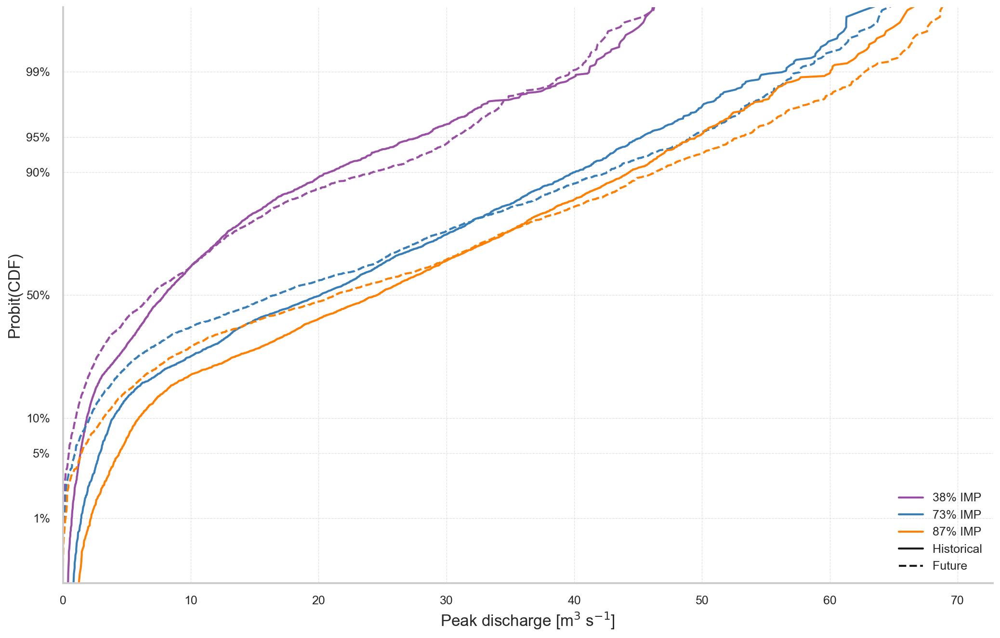

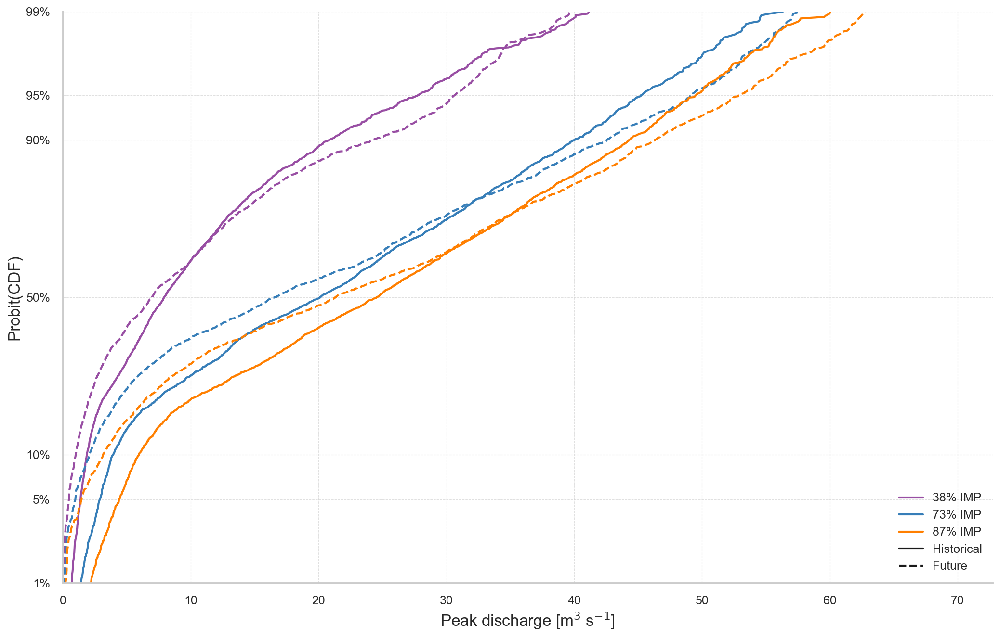

In [36]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from itertools import cycle
from scipy.stats import norm           # Φ⁻¹ (probit)

def create_cdf_probit_strength(
    data_dict, x_label, selected_scenarios,
    strength=1.0                       # 0 = linear-CDF, 1 = classic probit
):
    """
    CDF with probit Y-axis.
    strength stretches *only* the curves & tick positions, NOT the axis limits.
    כך המרחק בין 0.5-CDF ל-10%/90% משתנה באמת.
    """
    # helpers ---------------------------------------------------------
    probit_base   = lambda p: norm.ppf(np.clip(p,1e-6,1-1e-6))
    probit_scaled = lambda p: probit_base(p) * strength

    # figure ----------------------------------------------------------
    fig, ax = plt.subplots(figsize=(14, 9))
    palette = cycle(["#984EA3","#377EB8","#FF7F00","#E41A1C",
                     "#A65628","#999999","#66A61E","#FFD92F"])
    colors  = [next(palette) for _ in range(len(data_dict))]

    # curves ----------------------------------------------------------
    for (lbl,d), col in zip(data_dict.items(), colors):
        n = len(d['historical'])
        p = np.linspace(1/(n+1), n/(n+1), n)
        ax.plot(np.sort(d['historical']), probit_scaled(p),
                color=col, lw=2, ls='-')
        n = len(d['future'])
        p = np.linspace(1/(n+1), n/(n+1), n)
        ax.plot(np.sort(d['future']),     probit_scaled(p),
                color=col, lw=2, ls='--')

    # axis & ticks ----------------------------------------------------
    ax.set_xlabel(x_label, fontsize=16)
    ax.set_ylabel("Probit(CDF)", fontsize=16)

    # קובע גבולות-Y קבועים (±3 מכסים 0.1 %-99.9 %)
    ax.set_ylim(-3, 3)
    ax.set_xlim(left=0)

    # ticks – מוכפלים ב-strength, לכן זזים החוצה/פנימה
    pct_ticks = np.array([0.01,0.05,0.1,0.5,0.9,0.95,0.99])
    ax.set_yticks(probit_scaled(pct_ticks))
    ax.set_yticklabels([f"{int(t*100)}%" for t in pct_ticks])

    ax.grid(ls='--', alpha=.6)
    ax.tick_params(labelsize=12)

    # legend ----------------------------------------------------------
    h=[]
    for (lbl,_), col in zip(data_dict.items(), colors):
        pct=next((s.split('%')[0].strip()
                 for s in selected_scenarios if s.startswith(lbl)), None)
        if pct:
            h.append(mlines.Line2D([],[],color=col,lw=2,label=f"{pct}% IMP"))
    h += [mlines.Line2D([],[],color='k',lw=2,ls='-', label='Historical'),
          mlines.Line2D([],[],color='k',lw=2,ls='--',label='Future')]
    ax.legend(handles=h, loc='lower right', fontsize=12, framealpha=.9)

    plt.tight_layout(); plt.show()


# --------- run & compare ----------

# Classic probit
create_cdf_probit_strength(data_dict, x_label, selected_scenarios, strength=1)

# Stronger tail-emphasis
create_cdf_probit_strength(data_dict, x_label, selected_scenarios, strength=3)


In [37]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
from itertools import cycle

def create_cdf_logit(
    data_dict, 
    x_label, 
    selected_scenarios
):
    """
    Plot CDFs of historical and future data for each scenario using a logit y-axis.
    This highlights changes in the lower and upper tails (extremes) of the distributions.
    
    Parameters:
    data_dict (dict): Dictionary containing scenario data (must include 'historical' and 'future' keys for each scenario).
    x_label (str): Label for the x-axis (e.g. 'Peak Discharge [m³/s]').
    selected_scenarios (list): List of scenario names (used for legend formatting).
    """
    fig, ax = plt.subplots(figsize=(14, 10))

    # Define a custom color palette for scenarios
    tol_colors = [
        "#984EA3", "#377EB8", "#FF7F00", "#E41A1C",
        "#A65628", "#999999", "#66A61E", "#FFD92F"
    ]
    colors = cycle(tol_colors)
    assigned_colors = [next(colors) for _ in range(len(data_dict))]

    # Plot the CDFs for each scenario (historical and future)
    for (label, scenario_data), color in zip(data_dict.items(), assigned_colors):
        # Avoid exactly 0 or 1 for the cumulative probabilities
        n = len(scenario_data['historical'])
        p_hist = np.linspace(1/(n+1), n/(n+1), n)
        n_fut = len(scenario_data['future'])
        p_fut = np.linspace(1/(n_fut+1), n_fut/(n_fut+1), n_fut)

        # Plot historical CDF
        ax.plot(
            np.sort(scenario_data['historical']),
            np.log10(p_hist / (1 - p_hist)),
            color=color, linestyle='-', linewidth=2
        )
        # Plot future CDF
        ax.plot(
            np.sort(scenario_data['future']),
            np.log10(p_fut / (1 - p_fut)),
            color=color, linestyle='--', linewidth=2
        )

    # Axis labels and tick formatting
    ax.set_xlabel(x_label, fontsize=28)
    ax.set_ylabel('Logit(Cumulative Probability)', fontsize=28)
    ax.tick_params(axis='both', labelsize=22)
    ax.grid(True, linestyle='--', alpha=0.7)
    ax.set_xlim(left=0)

    # Set y-ticks at common percentiles and convert to logit scale
    ticks = np.array([0.001, 0.01, 0.05, 0.1, 0.5, 0.9, 0.95, 0.99, 0.999])
    logit_ticks = np.log10(ticks / (1 - ticks))
    ticklabels = [f"{int(p*100)}%" for p in ticks]
    ax.set_yticks(logit_ticks)
    ax.set_yticklabels(ticklabels)
    ax.text(-0.05, 1.05, '(a)', transform=ax.transAxes, fontsize=28, fontweight='bold', va='bottom')

    # Draw a black frame around the plot
    for spine in ['left', 'bottom', 'right', 'top']:
        ax.spines[spine].set_color('black')
        ax.spines[spine].set_linewidth(1.2)

    # Create legend for urbanization scenarios, historical/future
    urbanization_handles = []
    for (label, _), color in zip(data_dict.items(), assigned_colors):
        urban_percentage = None
        for scenario in selected_scenarios:
            if scenario.startswith(label):
                urban_percentage = scenario.split('%')[0].strip()
                break
        if urban_percentage is not None:
            line = mlines.Line2D([], [], color=color, linestyle='-', linewidth=2,
                                 label=f'{urban_percentage}% IMP')
            urbanization_handles.append(line)
    hist_line = mlines.Line2D([], [], color='black', linestyle='-', linewidth=2, label='Historical')
    fut_line = mlines.Line2D([], [], color='black', linestyle='--', linewidth=2, label='Future')
    legend_elements = urbanization_handles + [hist_line, fut_line]
    ax.legend(handles=legend_elements, loc='lower right', fontsize=18, framealpha=0.9, ncol=2)

    plt.tight_layout()
    plt.show()


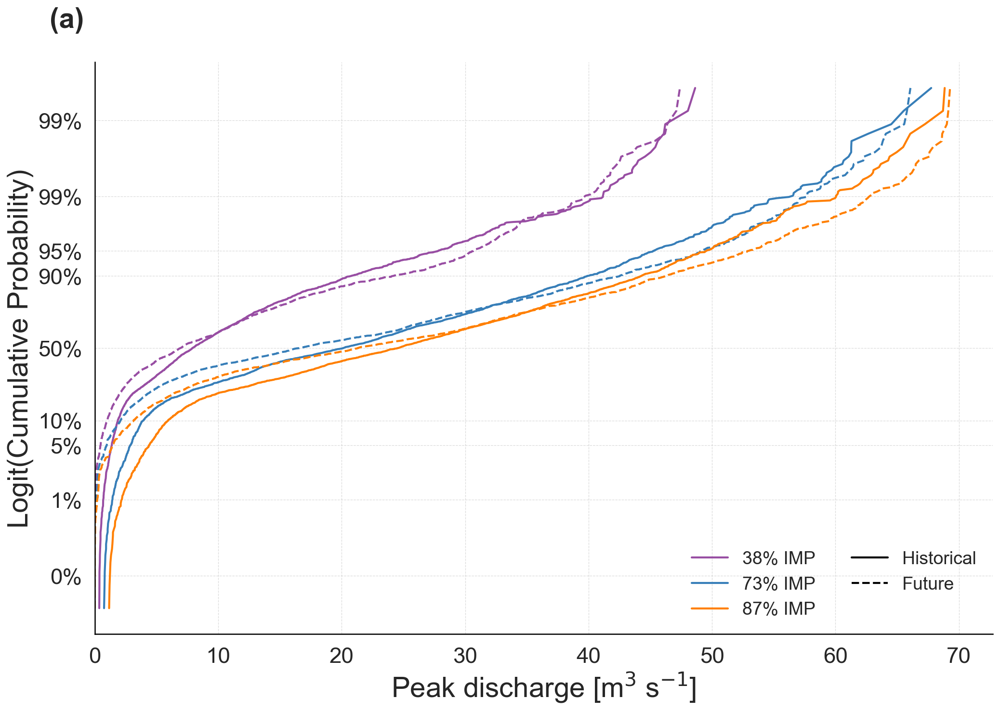

In [38]:
create_cdf_logit(
    data_dict=data_dict,
    x_label=x_label,
    selected_scenarios=selected_scenarios
)

C:\Users\raznu\AppData\Local\Temp\ipykernel_26924\4283127368.py:103: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Figure saved to: D:\Development\RESEARCH\Raanana\figures\climate_change_shifts\CDFs\Peak_discharge_[m$^3$_s$^{-1}$]_ZOOM.png


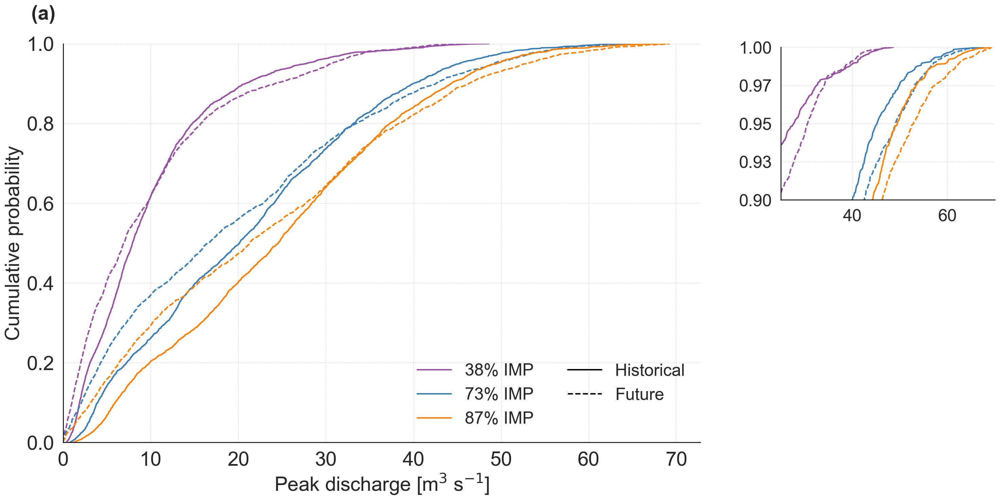

In [39]:
create_cdf(
    data_dict=data_dict,
    x_label=x_label,
#     xlim_zoom=(.2*10**5, 2*10**5),
    xlim_zoom=(25,70),
    ylim_zoom=(0.90, 1),
    selected_scenarios=selected_scenarios
)


## Percentiles plots

Figure saved to: D:\Development\RESEARCH\Raanana\figures\climate_change_shifts\CDFs\Future_Events_CDF_historical.png


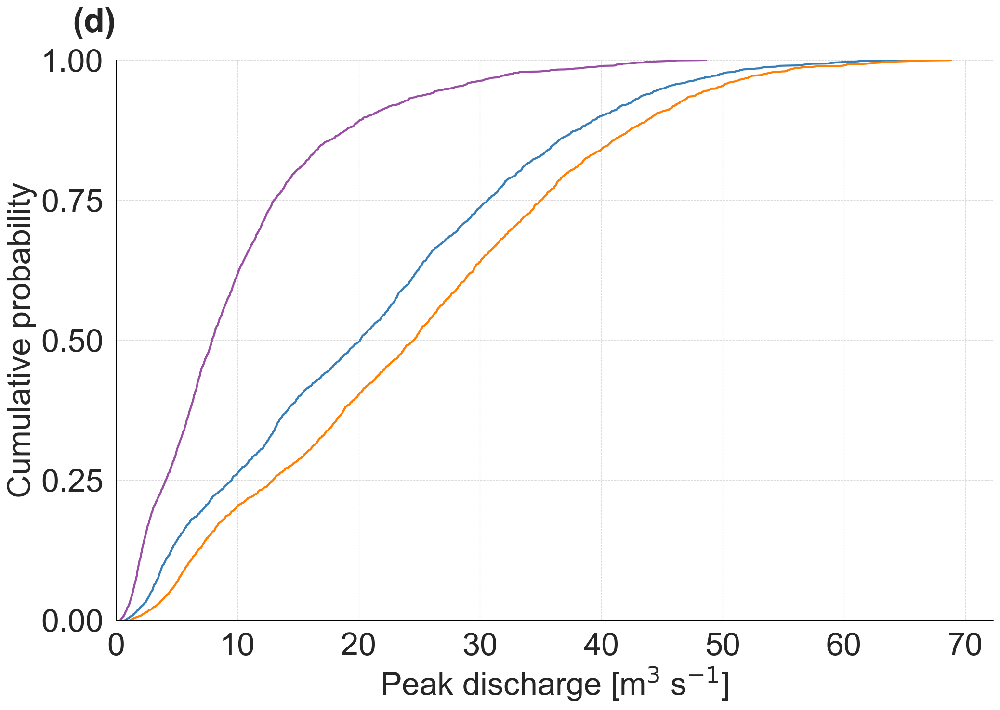

In [40]:
create_single_period_cdf_plot(data_dict, period='historical', 
                              title="Future Events CDF", 
                              x_label=x_label)

In [41]:
percentile_results = compute_percentiles(data_dict, percentiles=input_percentiles)

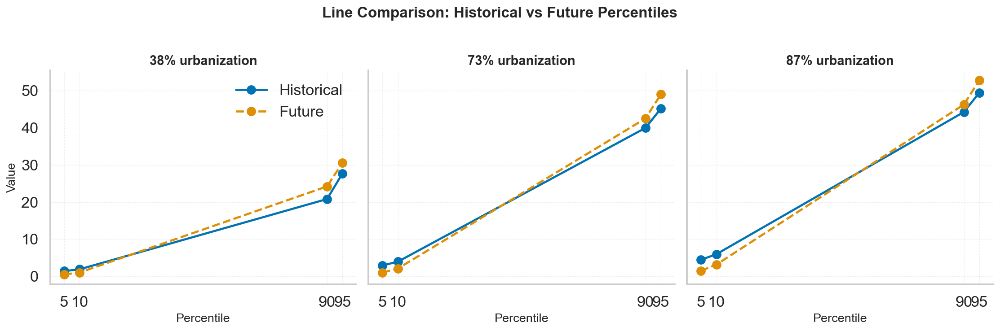

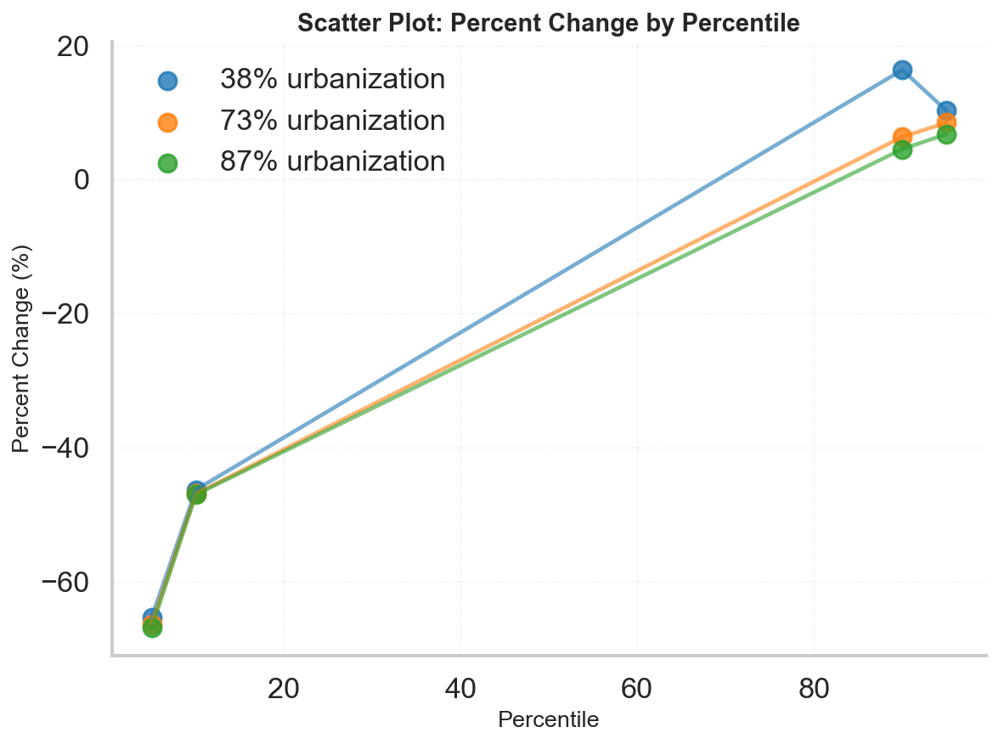

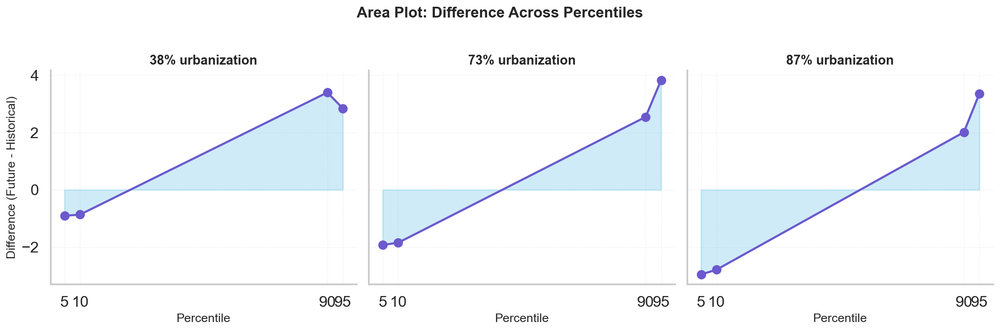

In [42]:

# 1. Line Comparison
fig_line = plot_line_comparison(percentile_results, percentiles=input_percentiles)


# 2. Scatter Plot of Percent Change
fig_scatter = plot_scatter_percent_change(percentile_results, percentiles=input_percentiles)


# 3. Difference Area Plot
fig_area = plot_difference_area(percentile_results, percentiles=input_percentiles)


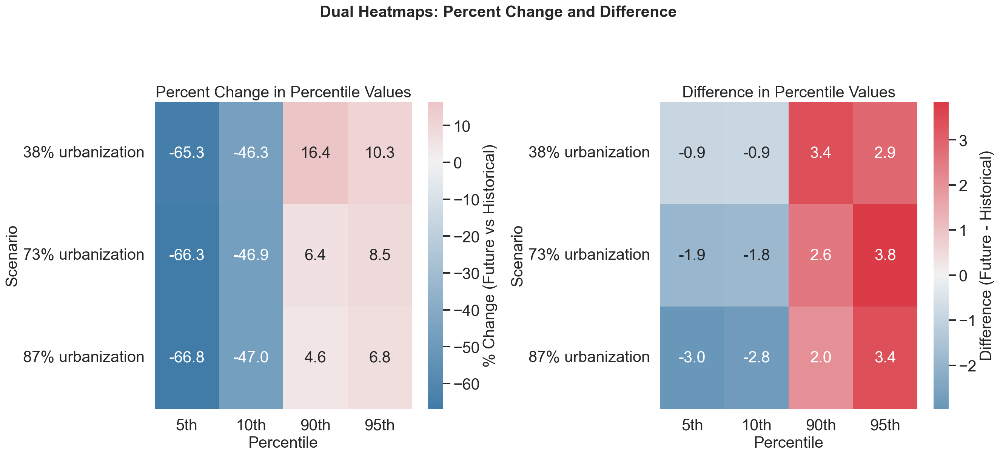

In [43]:
# Create the dual heatmap figure
fig = plot_dual_heatmaps(percentile_results, percentiles=input_percentiles)


In [44]:
import matplotlib.pyplot as plt

def plot_line_charts_gradient(percentile_results, percentiles):
    scenarios = list(percentile_results.keys())
    urbanization = []
    for scenario in scenarios:
        try:
            value = float(scenario.split("%")[0])
        except:
            value = 0
        urbanization.append(value)
    
    sorted_indices = sorted(range(len(urbanization)), key=lambda i: urbanization[i])
    sorted_scenarios = [scenarios[i] for i in sorted_indices]
    sorted_urbanization = [urbanization[i] for i in sorted_indices]

    percent_change_lines = {p: [] for p in percentiles}
    difference_lines = {p: [] for p in percentiles}
    for scenario in sorted_scenarios:
        for p in percentiles:
            hist = percentile_results[scenario]['historical'][p]
            fut = percentile_results[scenario]['future'][p]
            percent_change_lines[p].append((fut / hist - 1) * 100)
            difference_lines[p].append(fut - hist)

    cmap = plt.get_cmap("coolwarm")
    pmin, pmax = min(percentiles), max(percentiles)
    norm = plt.Normalize(pmin, pmax)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), sharex=True)
    
    lines = []
    labels = []

    for p in percentiles:
        color = cmap(norm(p))
        line1, = ax1.plot(sorted_urbanization, percent_change_lines[p], color=color)
        line2, = ax2.plot(sorted_urbanization, difference_lines[p], color=color)
        lines.append(line1)
        labels.append(f"{p}th")

    ax1.set_title("% Change")
    ax1.set_ylabel("Percent Change [%]")
    ax1.set_xlabel("Urbanization [%]")

    ax2.set_title("Absolute Difference")
    ax2.set_ylabel("Future - Historical")
    ax2.set_xlabel("Urbanization [%]")

    # Highlight y=0 line in black
    ax1.axhline(0, color='black', linewidth=1.2)
    ax2.axhline(0, color='black', linewidth=1.2)

    fig.legend(lines, labels, loc='lower center', ncol=len(percentiles), bbox_to_anchor=(0.5, -0.05))
    fig.tight_layout(rect=[0, 0.05, 1, 1])

    plt.show()


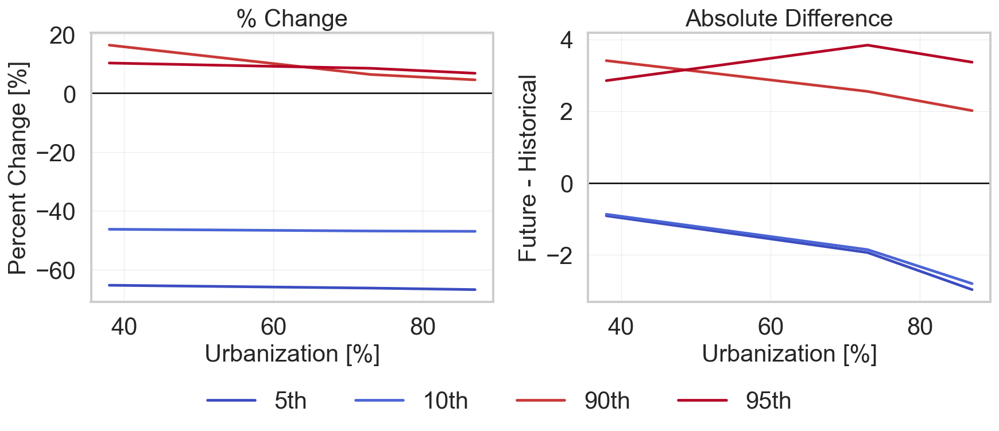

In [45]:
fig_line_gradient = plot_line_charts_gradient(percentile_results, percentiles=input_percentiles)



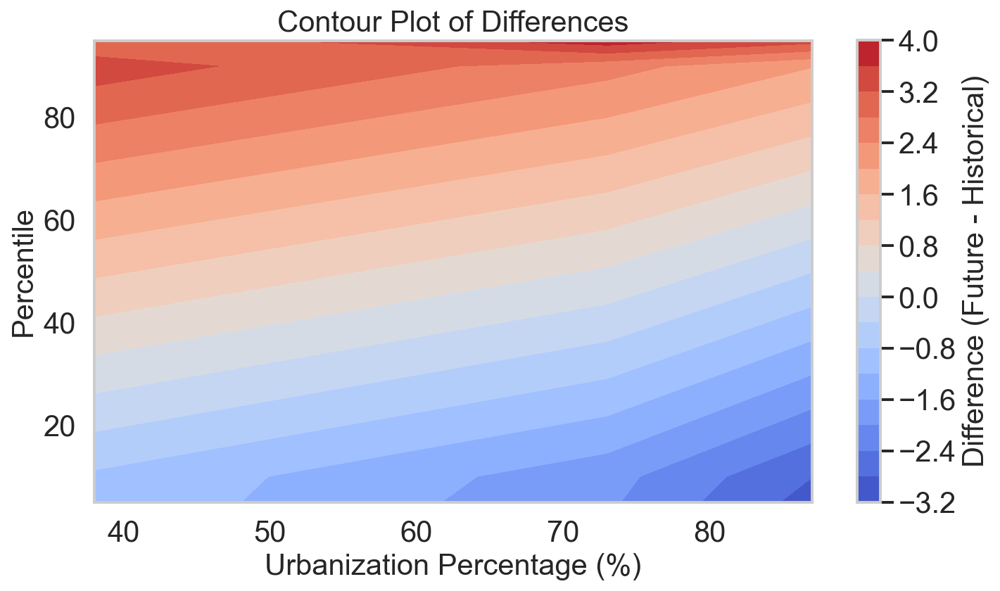

In [46]:
fig_contour = plot_contour_difference(percentile_results, percentiles=input_percentiles)


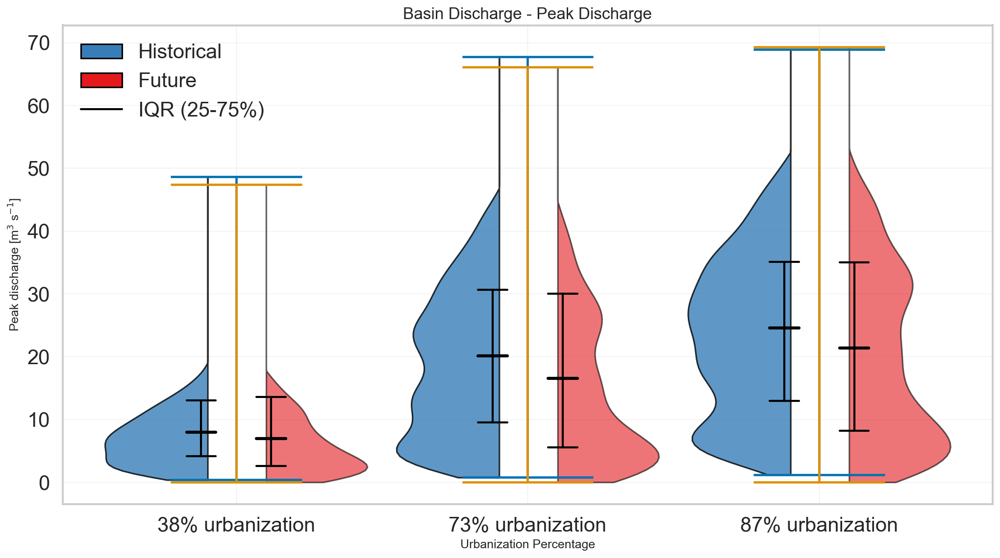

In [47]:
plot_split_violin(
    data_dict,
    title=dynamic_title,
    y_label=x_label
)


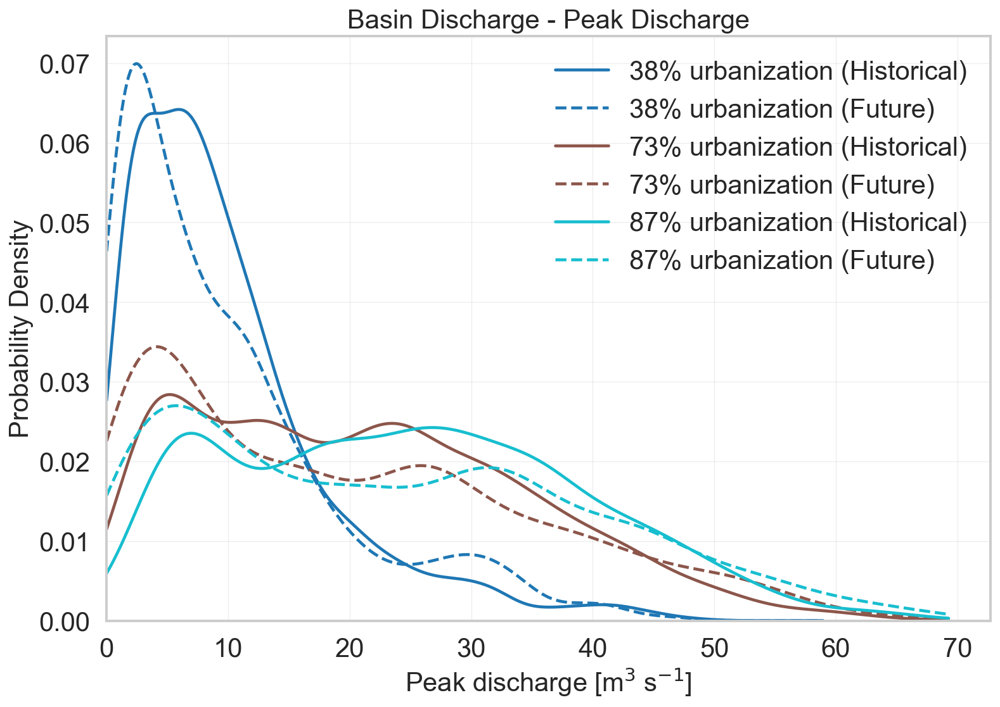

In [48]:
create_kde_plot(data_dict, dynamic_title, x_label)

C:\Users\raznu\AppData\Local\Temp\ipykernel_26924\889289195.py:145: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


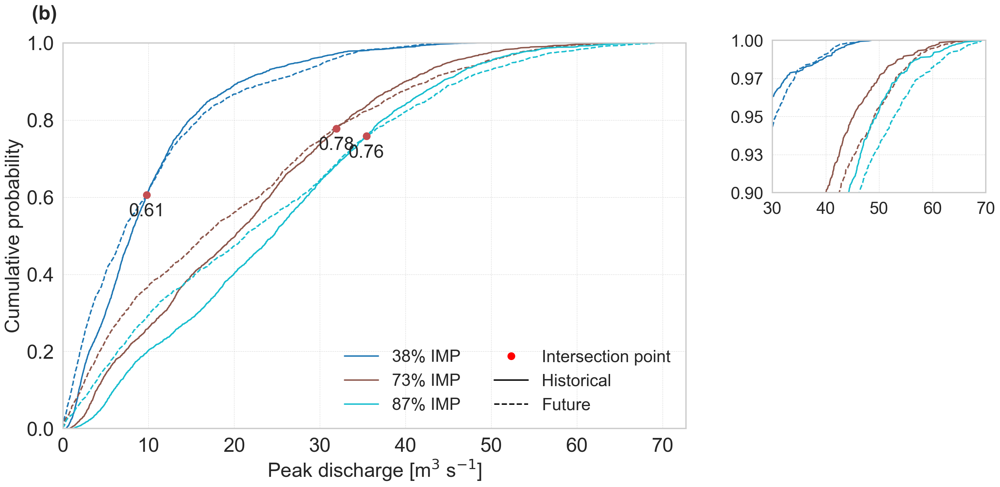

In [49]:
create_cdf_with_zoom_and_intersection(
    data_dict=data_dict,
    x_label=x_label,
#     xlim_zoom=(.5*10**6, 3*10**6),
    xlim_zoom=(30,70),
    ylim_zoom=(0.90, 1),
    selected_scenarios=selected_scenarios
)


Figure saved to: D:\Development\RESEARCH\Raanana\figures\climate_change_shifts\CDFs\Basin_Discharge_-_Peak_Discharge_historical.png


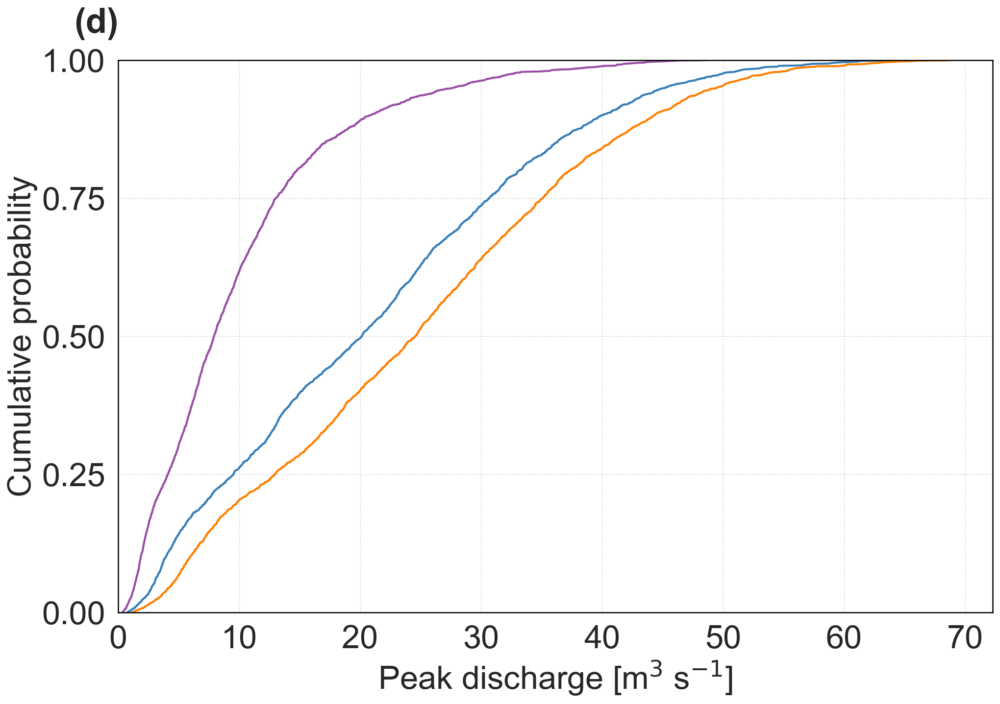

In [50]:
create_single_period_cdf_plot(data_dict, period='historical', 
                              title=dynamic_title, 
                              x_label=x_label)

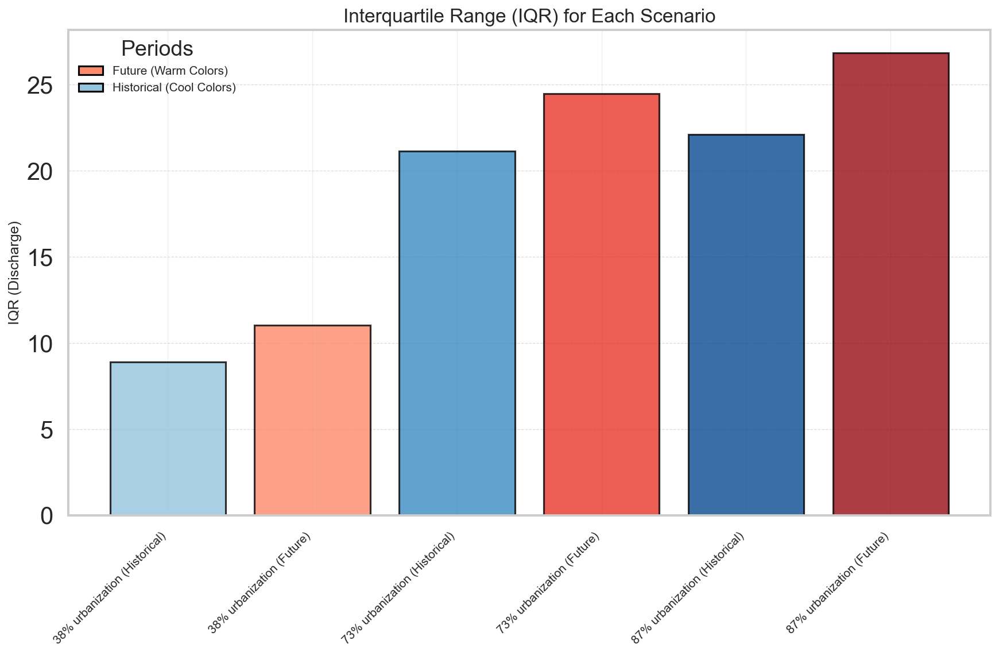

In [51]:
plot_iqr_bar_chart(
    data_dict,
    title="Interquartile Range (IQR) for Each Scenario",
    y_label="IQR (Discharge)"
)


[2.1257877349853516, 3.353264331817627, 4.735668182373047]


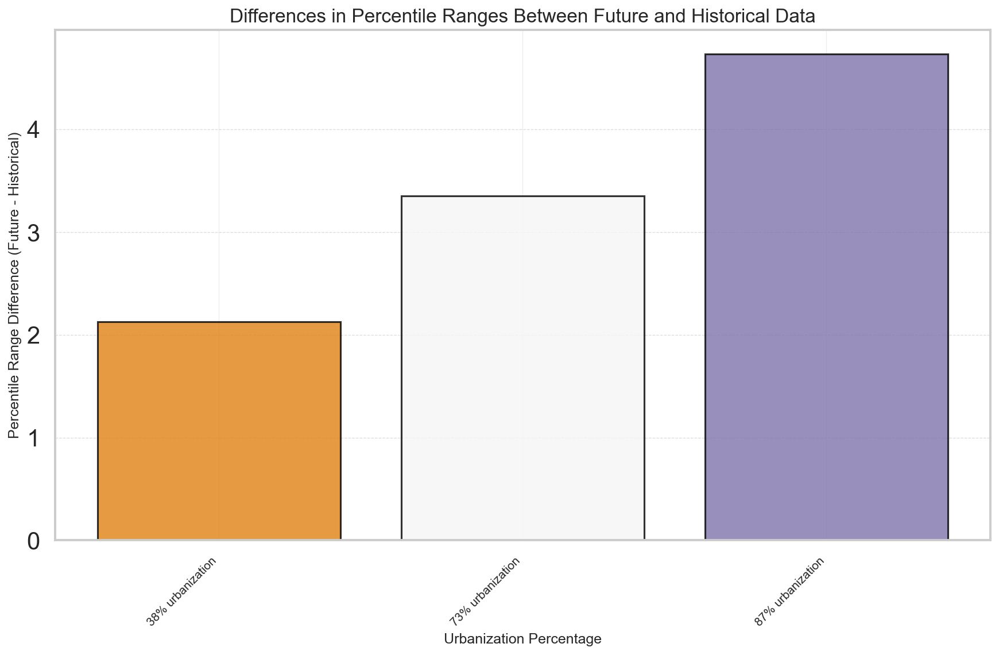

In [52]:
plot_percentile_differences(
    data_dict,
    lower_percentile=25,  # For the 10th percentile
    upper_percentile=75,  # For the 90th percentile
    title="Differences in Percentile Ranges Between Future and Historical Data",
    y_label="Percentile Range Difference (Future - Historical)"
)


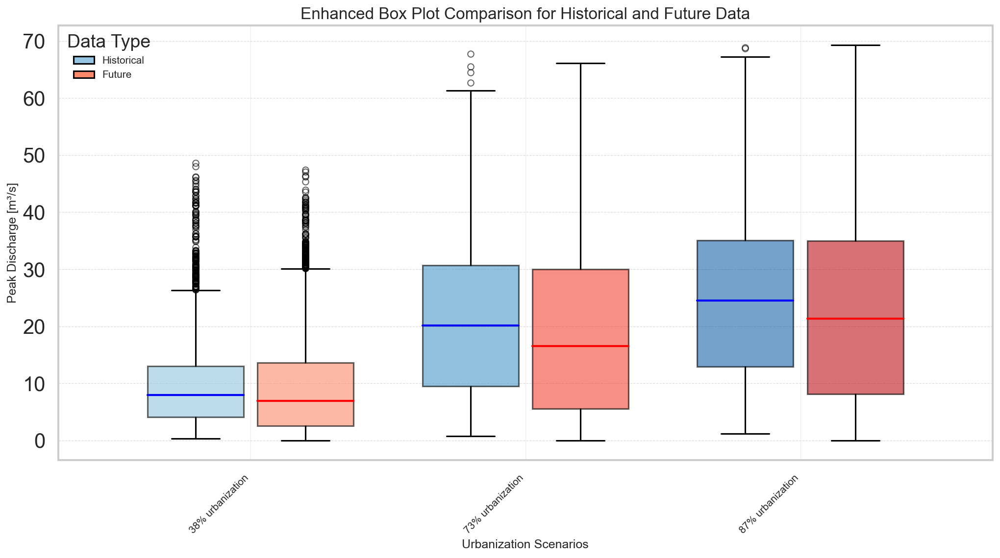

In [53]:
plot_enhanced_boxplot(
    data_dict,
    title="Enhanced Box Plot Comparison for Historical and Future Data",
    y_label="Peak Discharge [m³/s]"
)


## Two-sample Kolmogorov–Smirnov test
## test between specific urbanization level ffuture Vs. historical climate

In [54]:
ks_test_for_scenario(data_dict, selected_scenarios[0])

KS Test Between Future and Historical Data (38% urbanization):
KS Statistic: 0.1070
P-value: 0.0000
The distributions are significantly different.


C:\Users\raznu\AppData\Local\Temp\ipykernel_26924\1889874306.py:40: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


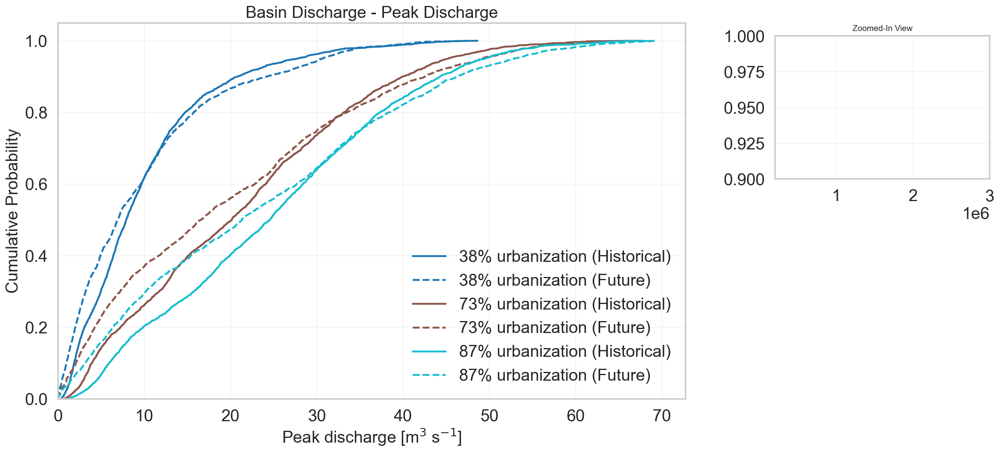

In [55]:
create_cdf_with_zoom(data_dict, dynamic_title, x_label, 
                    xlim_zoom=(0.2*10**6, 3*10**6), ylim_zoom=(0.9, 1))

Medians for 38% urbanization:
Historical: 7.92
Future: 6.95

Medians for 73% urbanization:
Historical: 20.15
Future: 16.56

Medians for 87% urbanization:
Historical: 24.54
Future: 21.33



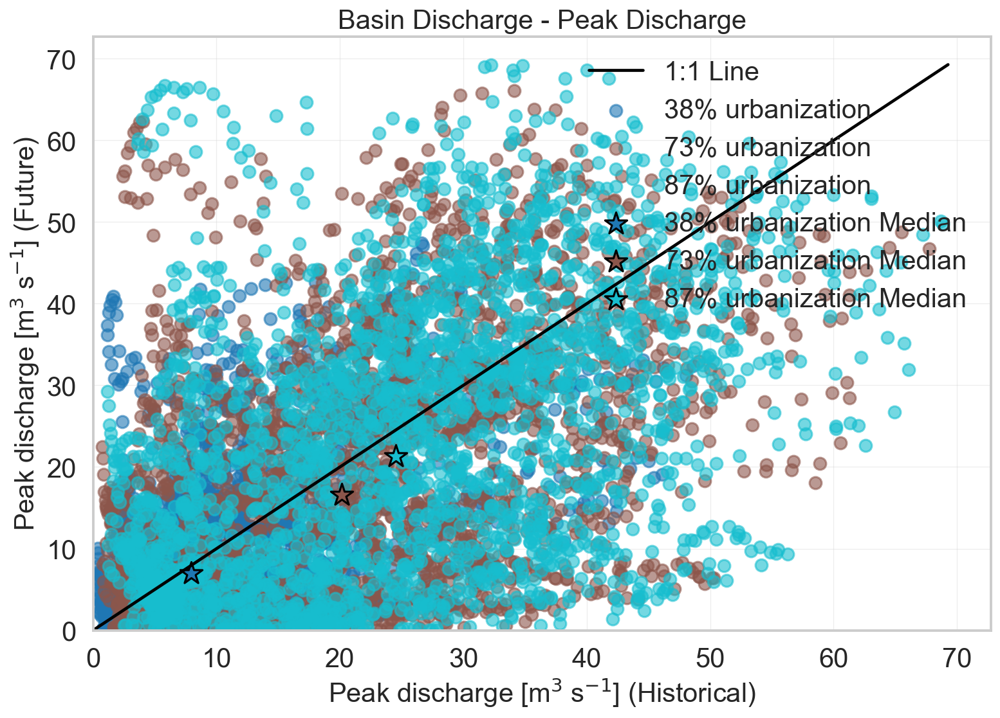

In [56]:
# Generate all plots
create_scatter_plot(data_dict, dynamic_title, x_label)

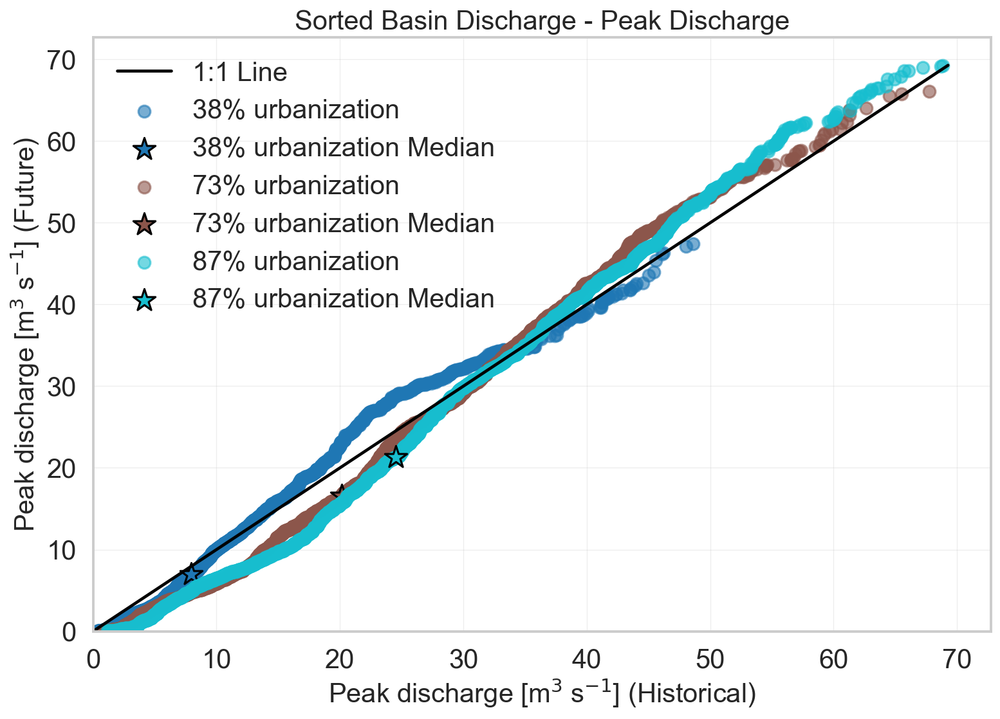

In [57]:
create_sorted_scatter_plot(data_dict, dynamic_title, x_label)

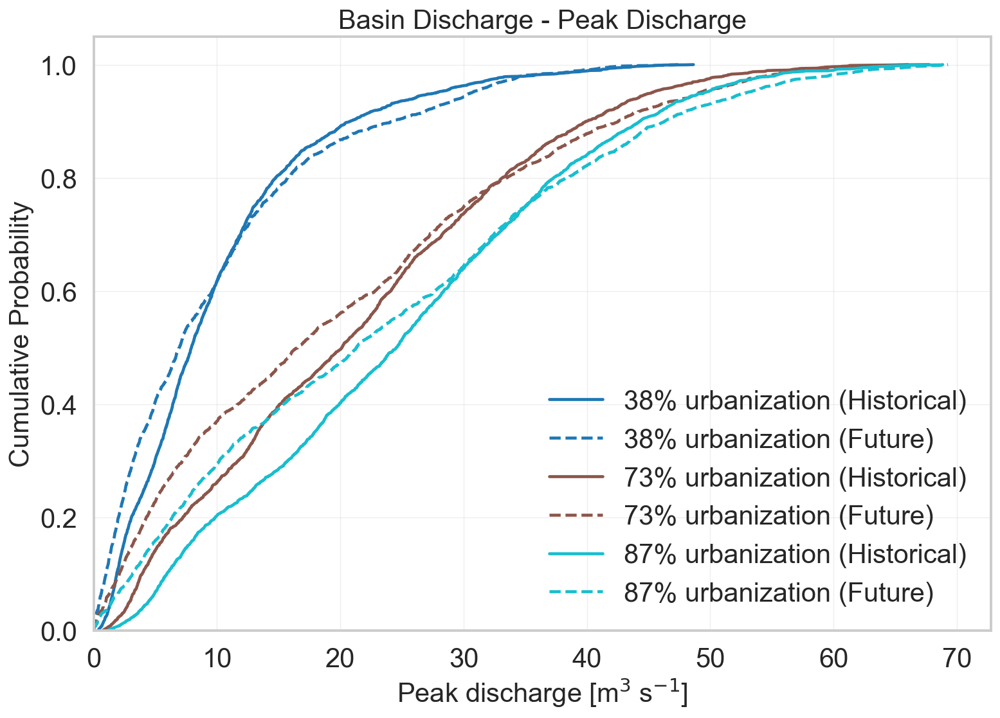

In [58]:
create_cdf_plot(data_dict, dynamic_title, x_label)

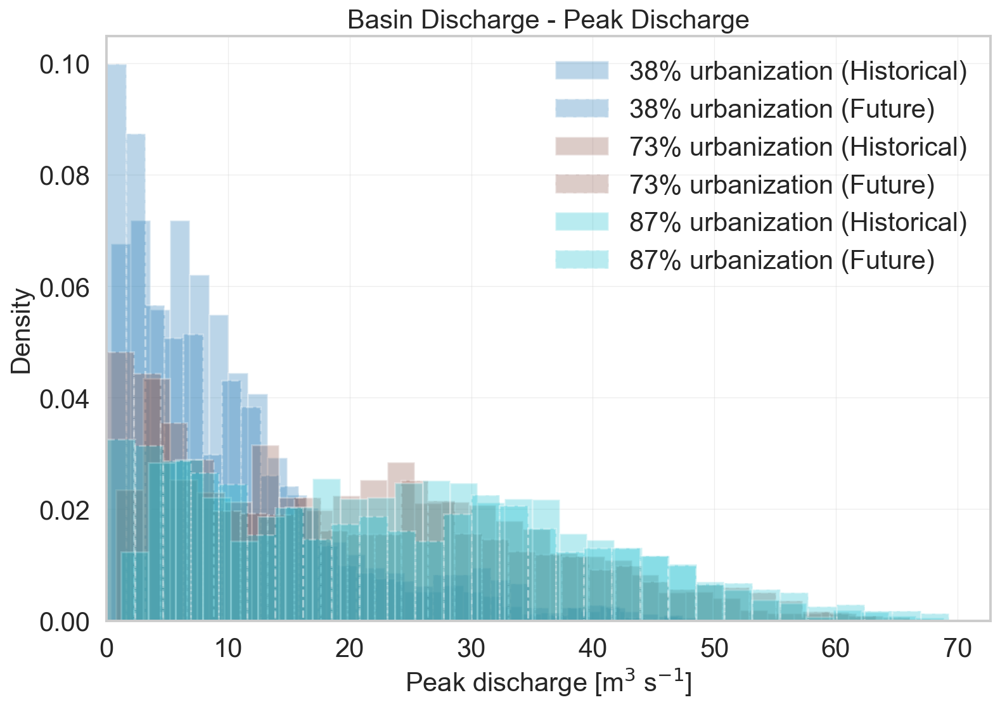

In [59]:
create_histogram(data_dict, dynamic_title, x_label)

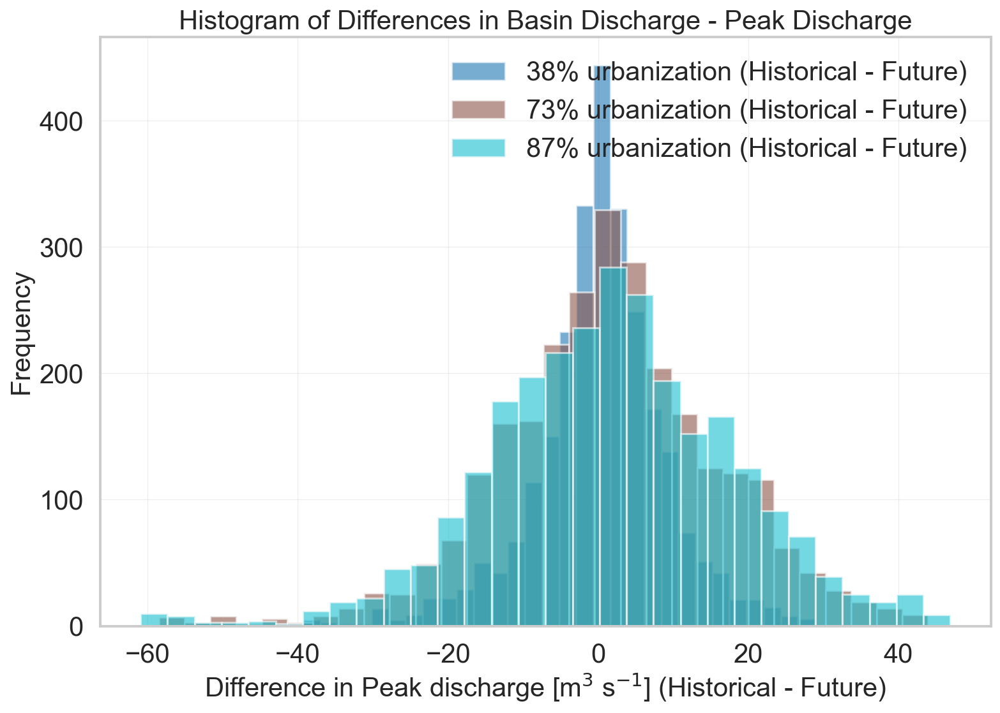

In [60]:
create_difference_histogram(data_dict, dynamic_title, x_label)

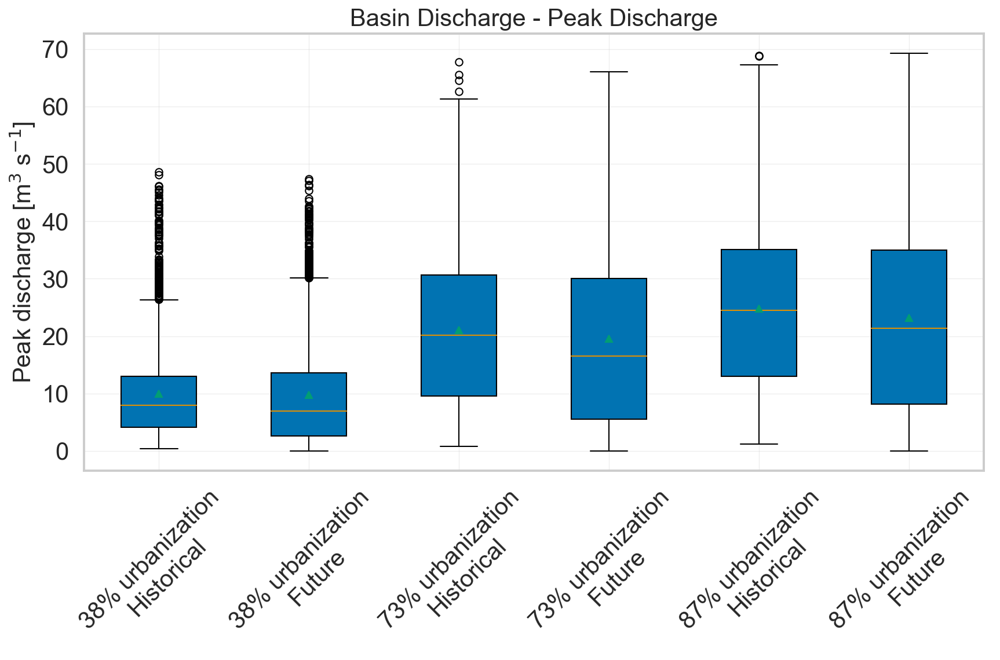

In [61]:
create_box_plot(data_dict, dynamic_title, x_label)

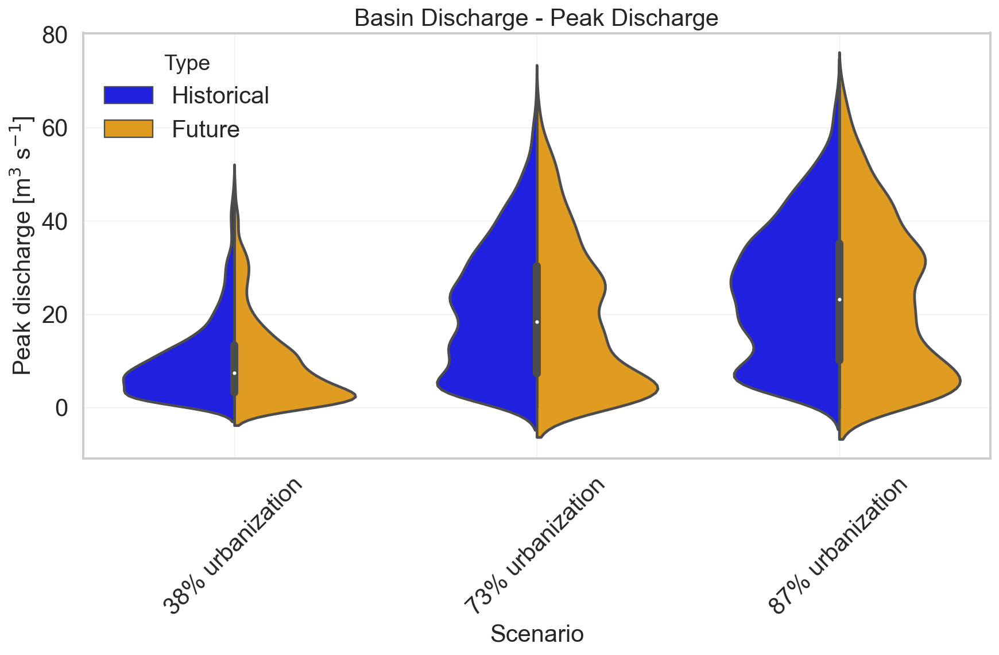

In [62]:
create_violin_plot(data_dict, dynamic_title, x_label)